Proyecto Semestral de Míneria de Datos - Segundo Semestre del 2020, UTEM

Integrantes:
*   Daniel Aguilera
*   Javiera Vergara
*   Jorge Verdugo



In [ ]:
!pip install numpy pandas keras seaborn matplotlib pandas_profiling factor_analyzer sklearn

     |████████████████████████████████| 40kB 3.6MB/s 
  Created wheel for factor-analyzer: filename=factor_analyzer-0.3.2-cp36-none-any.whl size=40380 sha256=732f75b1b7e95ee93a03c9523b0899fa9b9ff5d371fa22dfd5f9b285f89db5de
  Stored in directory: /root/.cache/pip/wheels/4a/d0/57/f1330cb9c80e82d8d05391c74c94ed61ce3f03bf6157f3d6db
Successfully built factor-analyzer


In [ ]:
# Importación de las librerias

import numpy as np 
import pandas as pd
import keras
import seaborn as sns
import matplotlib
import warnings

%matplotlib inline

from pandas_profiling import ProfileReport
from matplotlib import pyplot as plt

from factor_analyzer import FactorAnalyzer
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
from factor_analyzer.factor_analyzer import calculate_kmo

from sklearn import preprocessing
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import explained_variance_score, max_error, mean_absolute_error, mean_squared_error
from sklearn.metrics import mean_squared_log_error, median_absolute_error, r2_score, mean_poisson_deviance, mean_gamma_deviance
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor

from tensorflow.keras import layers

In [ ]:
warnings.filterwarnings("ignore")
sns.set_style("whitegrid")
plt.style.use(['dark_background'])

In [ ]:
# Carga de los datos

dataset_path = keras.utils.get_file("spotify.csv", "https://github.com/mapacheverdugo/spotify-mdd/raw/master/data.csv")
raw_dataset = pd.read_csv(dataset_path)

29827072/29825241 [==============================] - 1s 0us/step


# 1. Presentacion del dataset

Este es un dataset creado por terceros a partir de la API oficial de Spotify que recoge la mayor información posible de más de 170.000 pistas disponibles en la plataforma de streaming desde el año 1921 al año 2020.

## Variables

In [ ]:
# Se obtiene el nombre original de cada columna

raw_dataset.keys()

Index(['valence', 'year', 'acousticness', 'artists', 'danceability',
       'duration_ms', 'energy', 'explicit', 'id', 'instrumentalness', 'key',
       'liveness', 'loudness', 'mode', 'name', 'popularity', 'release_date',
       'speechiness', 'tempo'],
      dtype='object')

*   **`acousticness`**: Define el grado acústico de una pista en un rango de `0.0` para las menos acústicas y `1.0` para las más acústicas.

*   **`artists`**: Lista con el nombre de los artistas de cada pista.

*   **`danceability`**: Describe qué tan adecuada es la canción para bailar, basada en la combinación de elementos musicales como el tempo, estabilidad y fuerza rítmica y la regulación general. Donde valores cercanos a `0.0` son para las menos bailables y valores cercanos a `1.0` para las más bailables.

*   **`duration_ms`**: Duración, en milisegundos (ms), de la pista.

*   **`energy`**: Representa una medida de intensidad y actividad en un rango de `0.0` para las menos energéticas y `1.0` para las más energéticas.

*   **`explicit`**: Define si la canción tiene letras explicitas con el valor `1`, y `0` si es que no las tiene.

* **`id`**: ID de Spotify para la canción.

*   **`instrumentalness`**: Predice si la pista tiene componente vocal. Sonidos como “ooh” y “aah” son tratados como instrumentales en este contexto. Mientras más cercano sea al `1.0`, mayor es la probabilidad que la pista no contenga contenido vocal, y al revés con el valor `0.0`.

*   **`key`**: Nota músical estimada de la canción en general. Números enteros mapeados que corresponde a un determinado tono. Ej: `0` = C, `1` = C♯/D♭, `2` = D, y así sucesivamente. En caso de no detectarla, se deja en el valor `-1`.

*   **`liveness`**: Detecta la presencia de audiencia en la grabación. A valores más cercanos a `1.0`, mayor es la probabilidad de que haya sido grabada en vivo, y viceversa con el `0.0`.

*   **`loudness`**: Volumen relativo de la pista expresado en decibeles (dB) negativos.

*   **`mode`**: Indica la modalidad (mayor o menor) de una pista, el tipo de escala de la que se deriva su contenido melódico. Mayor está representado por `1` y menor es `0`.

*   **`name`**: Título de la pista.

*   **`popularity`**: Variable a predecir, corresponde a un valor porcentual, de `0` a `100`, de la popularidad de la pista, basada directamente en la cantidad de reproducciones de la misma.

*   **`release_date`**: Fecha exacta del lanzamiento del álbum, en caso de no tener el detalle, corresponde al año de lanzamiento.

*   **`speechiness`**: Detecta la presencia de palabras *habladas* en una pista. Cuanto más exclusivamente parecida a un discurso sea la grabación (por ejemplo, programa de entrevistas, audiolibro, poesía), más cercano a `1.0` será el valor del atributo.

*   **`tempo`**: El tempo global estimado de la pista, en pulsaciones por minuto (BPM).

*   **`valence`**: Una medida que describe la positividad musical que transmite una pista. Las pistas con valencia alta suenan más positivas (feliz, alegre, eufórico) y tiene valores más cercanos a `1.0`, mientras que las pistas con valencia baja suenan más negativas (triste, deprimido, enojado) y tienen valores más cercanos a `0.0`.

*   **`year`**: El año de la fecha de lanzamiento del álbum.


### Tipos de variables

| **Variable**   | **Tipo**   |
|----------------|------------|
| `id`           | Primaria   |
| `acousticness` | Numérica   |
| `artists`      | Categórica |
| `danceability` | Numérica   |
| `duration_ms`  | Numérica   |
| `energy`       | Numérica   |
| `explicit`     | Categórica |
| `key`          | Categórica |
| `liveness`     | Numérica   |
| `loudness`     | Numérica   |
| `mode`         | Categórica |
| `name`         | Categórica |
| `popularity`   | Numérica   |
| `release_date` | Categórica |
| `speechiness`  | Numérica   |
| `tempo`        | Numérica   |
| `valence`      | Numérica   |
| `year`         | Numérica   |

## Seleccion de variables

### Variable objetivo

La variable objetivo es la `popularity`


### Variables no consideradas

Las siguientes variables **NO serán consideradas** para el modelo:

* **`artists`**: Si bien los artistas pueden tener relación con la popularidad de una canción, se debe considerar que lo que se busca en este proyecto es predecir si una canción es popular en base a características netamente musicales.

* **`id`**: Este campo no es relevante para la popularidad, dado que solamente es el ID generado por Spotify para cada pista.

* **`name`**: Si bien el nombre de una canción puede (o no) influenciar en la popularidad de una canción, para determinar esto sería necesario hacer un trabajo detallado sobre las palabras en sí, ya sea mediante un análisis de sentimientos o algún método similar, lo que se escapa del alcance del proyecto.

* **`release_date`**: Este campo no es una característica musical de la pista, por lo que no se considerará.

* **`year`**: Al igual que el anterior, este campo no es una característica musical de la pista. Además de esto, la relación de la variable `year` con `popularity` siempre estará determinada por la fecha actual de la aplicación del modelo.


### Variables consideradas

Por lo que finalmente para el desarrollo de los modelos **se considerarán** las variables `acousticness`, `danceability`, `duration_ms`, `energy`, `explicit`, `instrumentalness`, `key`, `liveness`, `loudness`, `mode`, `popularity`, `speechiness`, `tempo`, `valence`

# Análisis (EDA)

## General


In [ ]:
# Se obtienen los primeros cinco valores del dataset 

raw_dataset.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665


Text(0.5, 1.0, 'Distribución de popularity')

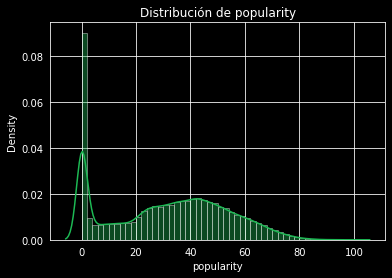

In [ ]:
sns.distplot(raw_dataset['popularity'], color = "#1db954").set_title('Distribución de popularity')

Se investigan las tendencias generales en los datos para tener una buena idea de qué variables se correlacionan entre sí y con otras asociaciones.

In [ ]:
# Se modifica la distribución de colores del heatmap

def NonLinCdict(steps, hexcol_array):
    cdict = {'red': (), 'green': (), 'blue': ()}
    for s, hexcol in zip(steps, hexcol_array):
        rgb =matplotlib.colors.hex2color(hexcol)
        cdict['red'] = cdict['red'] + ((s, rgb[0], rgb[0]),)
        cdict['green'] = cdict['green'] + ((s, rgb[1], rgb[1]),)
        cdict['blue'] = cdict['blue'] + ((s, rgb[2], rgb[2]),)
    return cdict

hc = ['#CB1582', '#A5FFEF']
th = [0, 1]

cdict = NonLinCdict(th, hc)
cm = matplotlib.colors.LinearSegmentedColormap('test', cdict)

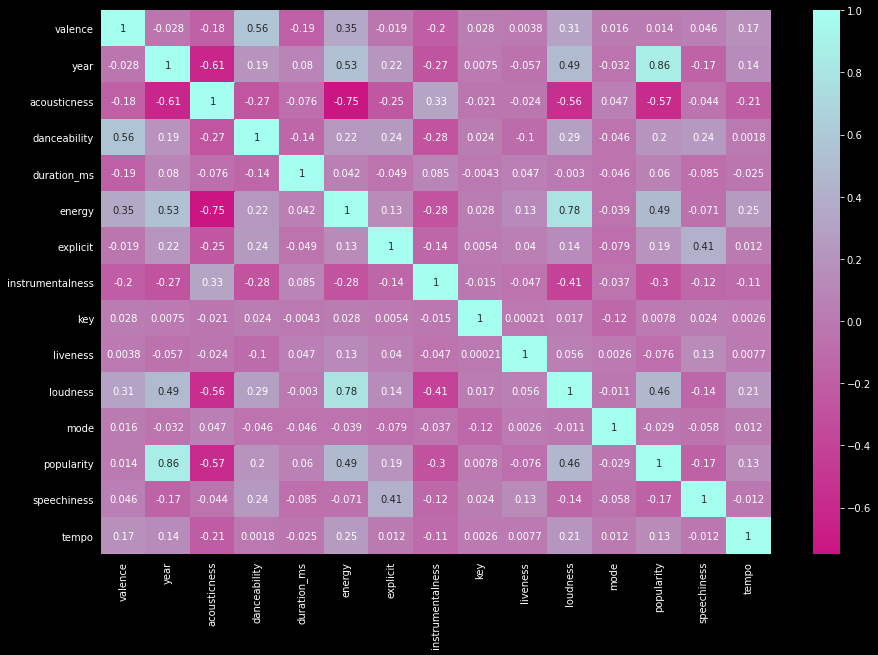

In [ ]:
# Se inicializa heatmap con la información del dataset

pearsoncorr = raw_dataset.corr(method='pearson')
plt.figure(figsize = (15,10))
sns.heatmap(pearsoncorr, 
            xticklabels=pearsoncorr.columns,
            yticklabels=pearsoncorr.columns,
            cmap=cm,
            annot=True)

In [ ]:
# Se prueba el reporte de pandas_profiling

# profile_data = ProfileReport(raw_dataset)
# profile_data.to_file('reporte_dataset_spotify.html')
# profile_data

In [ ]:
# Se grafica cada variable contra cada variable

sns.pairplot(raw_dataset)

Text(0.5, 1.0, 'Popularity basada en Explicit')

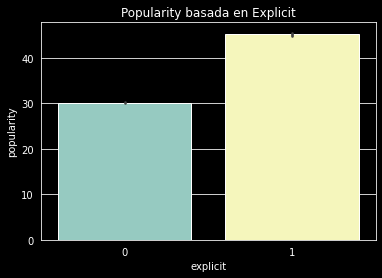

In [ ]:
# Se grafica relación entre Popularity y Explicit

sns.barplot(x = 'explicit', y = 'popularity', data = raw_dataset)
plt.title('Popularity basada en Explicit')

Text(0.5, 1.0, 'Promedio Popularity basada en Mode')

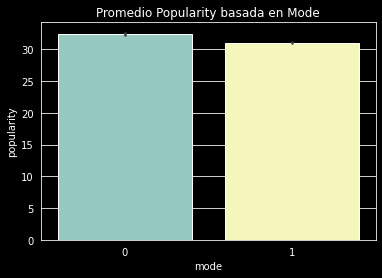

In [ ]:
# Se grafica relación entre Popularity y Mode

sns.barplot(x = 'mode', y = 'popularity', data = raw_dataset)
plt.title('Promedio Popularity basada en Mode')

Text(0.5, 1.0, 'Promedio Popularity basada en Key')

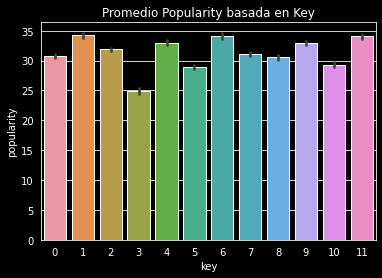

In [ ]:
# Se grafica relación entre Popularity y Key

sns.barplot(x = 'key', y = 'popularity', data = raw_dataset)
plt.title('Promedio Popularity basada en Key')

Ya que las variables `key` y `mode` pueden actuar como conjunto en las canciones, es decir estan relacionadas musicalmente (Por ejemplo, existen canciones en La Mayor o en La Menor), graficamos la relación entre las notas musicales y la popularidad por cada modalidad (menor y mayor)

Text(0.5, 1.0, 'Promedio Popularity basada en Mode y Key')

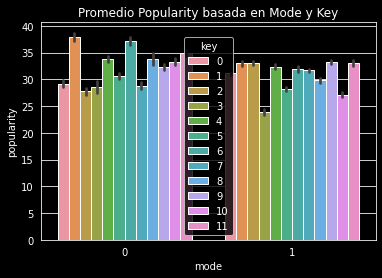

In [ ]:
# Se grafica relación entre Popularity y Key por cada Mode

sns.barplot(x = 'mode', y = 'popularity', hue = 'key', data = raw_dataset)
plt.title('Promedio Popularity basada en Mode y Key')

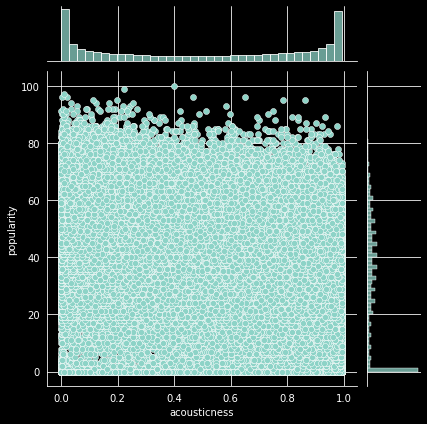

In [ ]:
# Se grafican las variables Acousticness y Popularity

sns.jointplot(x = 'acousticness', y = 'popularity', data = raw_dataset)

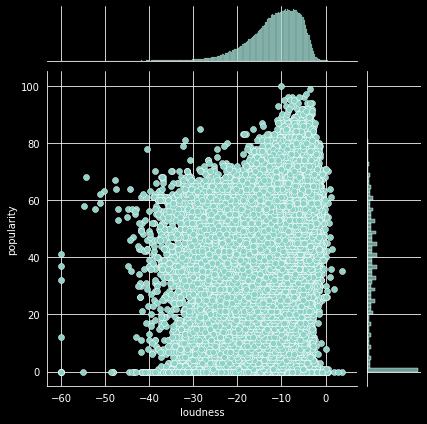

In [ ]:
# Se grafican las variables Loudness y Popularity

sns.jointplot(x = 'loudness', y = 'popularity', data = raw_dataset)

Text(0.5, 1.0, 'Acoustiness para canciones sobre 50 de Popularity')

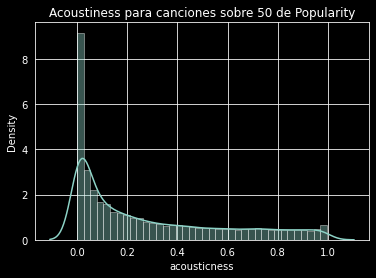

In [ ]:
# Se grafica la densidad de Acousticness para todas valores de Popularity mayores a 50

popular_above_50 = raw_dataset[raw_dataset.popularity > 50]
sns.distplot(popular_above_50['acousticness'])
plt.title('Acoustiness para canciones sobre 50 de Popularity')

Text(0.5, 1.0, 'Acoustiness para canciones bajo 50 de Popularity')

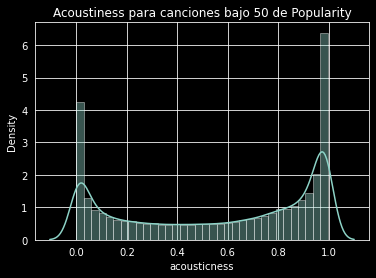

In [ ]:
# Se grafica la densidad de Acousticness para todas valores de Popularity menores a 50

popular_below_50 = raw_dataset[raw_dataset.popularity < 50]
sns.distplot(popular_below_50['acousticness'])
plt.title('Acoustiness para canciones bajo 50 de Popularity')

Text(0.5, 1.0, 'Loudness para canciones sobre 50 de Popularity')

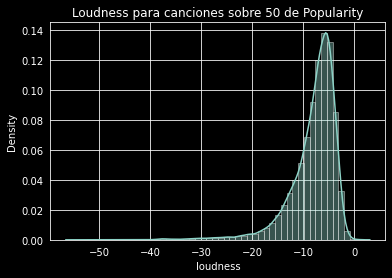

In [ ]:
# Se grafica la densidad de Loudness para todas valores de Popularity mayores a 50

sns.distplot(popular_above_50['loudness'])
plt.title('Loudness para canciones sobre 50 de Popularity')

Text(0.5, 1.0, 'Loudness para canciones bajo 50 de Popularity')

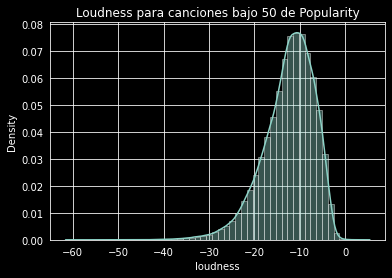

In [ ]:
# Se grafica la densidad de Loudness para todas valores de Popularity menores a 50

popular_below_50 = raw_dataset[raw_dataset.popularity < 50]
sns.distplot(popular_below_50['loudness'])
plt.title('Loudness para canciones bajo 50 de Popularity')

## Datos erroneos

Se comprueba si existen registros fuera de rango que puedan corresponder a errores.

In [ ]:
# Se obtienen algunos estadígrafos básicos de cada variable

raw_dataset.describe()

,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
count,170653.000000,170653.000000,170653.000000,170653.000000,1.706530e+05,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000
mean,0.528587,1976.787241,0.502115,0.537396,2.309483e+05,0.482389,0.084575,0.167010,5.199844,0.205839,-11.467990,0.706902,31.431794,0.098393,116.861590
std,0.263171,25.917853,0.376032,0.176138,1.261184e+05,0.267646,0.278249,0.313475,3.515094,0.174805,5.697943,0.455184,21.826615,0.162740,30.708533
min,0.000000,1921.000000,0.000000,0.000000,5.108000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000
25%,0.317000,1956.000000,0.102000,0.415000,1.698270e+05,0.255000,0.000000,0.000000,2.000000,0.098800,-14.615000,0.000000,11.000000,0.034900,93.421000
50%,0.540000,1977.000000,0.516000,0.548000,2.074670e+05,0.471000,0.000000,0.000216,5.000000,0.136000,-10.580000,1.000000,33.000000,0.045000,114.729000
75%,0.747000,1999.000000,0.893000,0.668000,2.624000e+05,0.703000,0.000000,0.102000,8.000000,0.261000,-7.183000,1.000000,48.000000,0.075600,135.537000
max,1.000000,2020.000000,0.996000,0.988000,5.403500e+06,1.000000,1.000000,1.000000,11.000000,1.000000,3.855000,1.000000,100.000000,0.970000,243.507000


### `loudness`
Según el autor del dataset, los datos deberían estar en un rango de [-60, 0] y se aprecia que el valor máximo es de `3.855000`, por lo que hay registros que se salen de rango.



In [ ]:
# Se revisan los estadígrafos de los registros que se salen de rango
raw_dataset[raw_dataset.loudness > 0].describe()

,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
count,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000
mean,0.535600,1981.225806,0.181393,0.460032,207106.032258,0.847485,0.161290,0.129905,4.741935,0.304090,0.917065,0.741935,30.806452,0.143865,122.385161
std,0.331993,30.378402,0.266498,0.249362,105674.614884,0.237666,0.373878,0.275556,3.678476,0.233989,1.000266,0.444803,24.051915,0.115374,49.974852
min,0.000000,1930.000000,0.000047,0.000000,22962.000000,0.000020,0.000000,0.000000,0.000000,0.030900,0.060000,0.000000,0.000000,0.000000,0.000000
25%,0.264500,1973.000000,0.003495,0.264500,152058.000000,0.813000,0.000000,0.000000,1.500000,0.137500,0.232500,0.500000,1.000000,0.056950,94.721000
50%,0.539000,1976.000000,0.034800,0.440000,198072.000000,0.951000,0.000000,0.000125,4.000000,0.216000,0.496000,1.000000,33.000000,0.119000,125.964000
75%,0.810500,2007.500000,0.313000,0.655000,240362.500000,0.983500,0.000000,0.076150,8.500000,0.419500,1.174000,1.000000,49.500000,0.190500,157.627500
max,0.974000,2019.000000,0.925000,0.888000,632625.000000,0.998000,1.000000,0.998000,11.000000,0.900000,3.855000,1.000000,71.000000,0.486000,184.066000


In [ ]:
# Se revisan los estadígrafos de los registros que se salen de rango
raw_dataset[raw_dataset.loudness > 0].head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
10365,0.241,1973,0.003530,['The Stooges'],0.235,208133,0.977,0,00sydAz6PeOxYzwG1dRIPi,0.006040,6,0.172,0.878,1,Search and Destroy - Iggy Pop Mix,52,1973-02-07,0.1070,152.952
29282,0.249,1973,0.003290,['The Stooges'],0.378,213093,0.951,0,77bHrxVX3E2SWopfaoWrTw,0.419000,3,0.135,0.450,0,Gimme Danger - Alternate 'Violent' Iggy Mix,45,1973-02-07,0.0566,132.060
38418,0.604,2019,0.085000,['Lil Darkie'],0.457,632625,0.965,1,68Y3zzmt2XxzheQVGbbJt4,0.000000,1,0.697,0.457,1,GENOCIDE,70,2019-05-20,0.4860,170.122
40165,0.827,1934,0.027700,['The Moors'],0.623,22962,0.933,0,7vltgClIJwjmiilwWAZpSf,0.000311,4,0.140,0.674,1,Blue Christmas,0,1934,0.0427,100.226
40413,0.000,1936,0.000047,['Apocolothoth'],0.000,152476,0.114,0,050FXMyCrQJG01AT55Jvk1,0.998000,0,0.578,3.855,0,Sold,0,1936-05-27,0.0000,0.000


Dada el número de casos fuera de norma y que la proporción respecto a la muestra total es menor al 0.0002% se optará por hacerle un tratamiento a estos datos.

## Datos perdidos

Se comprueba si existen datos perdidos comprobando si existen valores `Null`

In [ ]:
raw_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [ ]:
pd.isnull(raw_dataset).sum()

valence             0
year                0
acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
explicit            0
id                  0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
name                0
popularity          0
release_date        0
speechiness         0
tempo               0
dtype: int64

En este dataset no existen registros con valores `Null`, por lo que no existen datos perdidos, entonces no será necesario tratar los datos.

In [ ]:
raw_dataset.corr()

,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
valence,1.000000,-0.028245,-0.184101,0.558946,-0.191813,0.353876,-0.018613,-0.198501,0.028473,0.003832,0.313512,0.015641,0.014200,0.046381,0.171689
year,-0.028245,1.000000,-0.614250,0.188515,0.079713,0.530272,0.220881,-0.272371,0.007540,-0.057318,0.487697,-0.032385,0.862442,-0.167816,0.141048
acousticness,-0.184101,-0.614250,1.000000,-0.266852,-0.076373,-0.749393,-0.246007,0.329819,-0.020550,-0.024482,-0.561696,0.047168,-0.573162,-0.043980,-0.207120
danceability,0.558946,0.188515,-0.266852,1.000000,-0.139937,0.221967,0.241757,-0.278063,0.024439,-0.100193,0.285057,-0.045956,0.199606,0.235491,0.001801
duration_ms,-0.191813,0.079713,-0.076373,-0.139937,1.000000,0.042119,-0.048880,0.084770,-0.004266,0.047168,-0.003037,-0.046085,0.059597,-0.084604,-0.025472
energy,0.353876,0.530272,-0.749393,0.221967,0.042119,1.000000,0.132723,-0.281101,0.027705,0.126192,0.782362,-0.039260,0.485005,-0.070555,0.250865
explicit,-0.018613,0.220881,-0.246007,0.241757,-0.048880,0.132723,1.000000,-0.140987,0.005432,0.039640,0.140300,-0.078872,0.191543,0.414070,0.011969
instrumentalness,-0.198501,-0.272371,0.329819,-0.278063,0.084770,-0.281101,-0.140987,1.000000,-0.014591,-0.047193,-0.408611,-0.036543,-0.296750,-0.121700,-0.105361
key,0.028473,0.007540,-0.020550,0.024439,-0.004266,0.027705,0.005432,-0.014591,1.000000,0.000205,0.017385,-0.116260,0.007826,0.023784,0.002629
liveness,0.003832,-0.057318,-0.024482,-0.100193,0.047168,0.126192,0.039640,-0.047193,0.000205,1.000000,0.056422,0.002641,-0.076464,0.134667,0.007714


## Determinación de outliers

In [ ]:
Q1 = raw_dataset.quantile(0.25)
Q3 = raw_dataset.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

valence                 0.4300
year                   43.0000
acousticness            0.7910
danceability            0.2530
duration_ms         92573.0000
energy                  0.4480
explicit                0.0000
instrumentalness        0.1020
key                     6.0000
liveness                0.1622
loudness                7.4320
mode                    1.0000
popularity             37.0000
speechiness             0.0407
tempo                  42.1160
dtype: float64


In [ ]:
(Q1 - 1.5 * IQR)

valence                -0.32800
year                 1891.50000
acousticness           -1.08450
danceability            0.03550
duration_ms         30967.50000
energy                 -0.41700
explicit                0.00000
instrumentalness       -0.15300
key                    -7.00000
liveness               -0.14450
loudness              -25.76300
mode                   -1.50000
popularity            -44.50000
speechiness            -0.02615
tempo                  30.24700
dtype: float64

In [ ]:
(Q3 + 1.5 * IQR)

valence                  1.39200
year                  2063.50000
acousticness             2.07950
danceability             1.04750
duration_ms         401259.50000
energy                   1.37500
explicit                 0.00000
instrumentalness         0.25500
key                     17.00000
liveness                 0.50430
loudness                 3.96500
mode                     2.50000
popularity             103.50000
speechiness              0.13665
tempo                  198.71100
dtype: float64

### `acousticness`

La variable `acousticness` no presenta outliers significativos, por lo que se usará sin problemas para para la investigación.

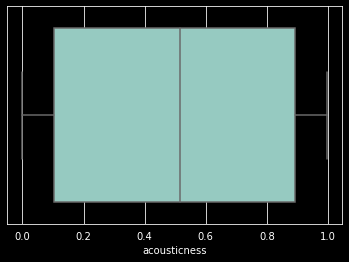

In [ ]:
ax = sns.boxplot(x=raw_dataset["acousticness"])

### `danceability`

La variable `danceability` presenta outliers para valores menores a *0.03550*, estos valores se concentran específicamente en 0, y dado que no existe un comportamiento similar para la popularidad en este valor, se opta por eliminar estos outliers.

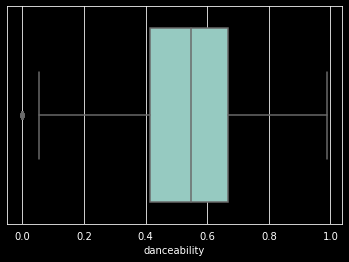

In [ ]:
ax = sns.boxplot(x=raw_dataset["danceability"])

In [ ]:
raw_dataset[raw_dataset.danceability < 0.03550].sort_values(by = 'popularity', ascending = False)

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
19030,0.0,2017,0.791000,"['Erik Eriksson', 'White Noise Baby Sleep', 'W...",0.0,90228,0.003420,0,2bRKxuH1o7pTmb1y4GfdEc,1.000000,8,0.111,-28.460,1,Clean White Noise - Loopable with no fade,85,2017-01-08,0.0,0.0
19260,0.0,2018,0.394000,['High Altitude Samples'],0.0,160003,0.001480,0,129ldjjvnFfA7Ygc8ktYnh,1.000000,5,0.111,-31.839,1,Soft Brown Noise,81,2018-11-15,0.0,0.0
19038,0.0,2017,0.923000,['Granular'],0.0,147097,0.000050,0,65rkHetZXO6DQmBh3C2YtW,0.297000,10,0.110,-32.354,0,White Noise - 500 hz,79,2017-10-13,0.0,0.0
19029,0.0,2017,0.944000,['Granular'],0.0,135484,0.000020,0,6H4B9gJD6eQlNoEh8q85pP,0.869000,2,0.112,-40.449,0,White Noise - 145 hz,78,2017-10-13,0.0,0.0
38356,0.0,2019,0.862000,['Bruce Brus'],0.0,168000,0.000431,0,3AFEx7f9qxc6U59s27Tp1V,0.977000,0,0.162,-14.105,0,White Noise Crashing Waves,76,2019-08-09,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79007,0.0,1953,0.990000,"['Sergei Rachmaninoff', 'Arthur Rubinstein', '...",0.0,8853,0.722000,0,0MMpXuAkKfU4poBGLwHXUI,0.792000,2,0.447,-7.916,1,"Rhapsody on a Theme of Paganini, Op. 43: Intro...",0,1953,0.0,0.0
93224,0.0,1936,0.000061,['Apocolothoth'],0.0,144000,0.000020,0,7gS9LcwwA5l9zpBwOXu1lM,0.949000,1,0.900,2.799,1,Idiot,0,1936-05-27,0.0,0.0
94404,0.0,1948,0.951000,"['Igor Stravinsky', 'Columbia Symphony Orchest...",0.0,63373,0.126000,0,3l4zPozgfoLhF6JnUfWDMf,0.689000,8,0.608,-16.260,1,L'Oiseau de feu: Dialogue de Kachtchei avec Iv...,0,1948,0.0,0.0
95170,0.0,1952,0.976000,"['Richard Wagner', 'Keilberth', 'Varnay', 'Lor...",0.0,212667,0.085400,0,19Ttq3sjIl5pW9wT7ZFfmY,0.000105,7,0.343,-21.505,1,"Götterdämmerung : Act 1 : Willkommen, Gast, In...",0,1952,0.0,0.0


In [ ]:
raw_dataset[raw_dataset.danceability < 0.03550].describe()

,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
count,143.0,143.000000,143.000000,143.0,1.430000e+02,143.000000,143.000000,143.000000,143.000000,143.000000,143.000000,143.000000,143.000000,143.0,143.0
mean,0.0,1985.818182,0.560623,0.0,1.891800e+05,0.186423,0.013986,0.481097,4.776224,0.307774,-22.599427,0.713287,37.265734,0.0,0.0
std,0.0,33.743990,0.409229,0.0,4.577506e+05,0.263091,0.117845,0.417927,3.662562,0.268493,13.449279,0.453816,28.585417,0.0,0.0
min,0.0,1924.000000,0.000000,0.0,5.108000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.0,0.0
25%,0.0,1949.500000,0.117500,0.0,6.912900e+04,0.000062,0.000000,0.000809,1.000000,0.111000,-25.555500,0.000000,0.000000,0.0,0.0
50%,0.0,2009.000000,0.747000,0.0,1.435830e+05,0.040100,0.000000,0.399000,5.000000,0.182000,-19.082000,1.000000,48.000000,0.0,0.0
75%,0.0,2017.000000,0.951000,0.0,1.768465e+05,0.303000,0.000000,0.927000,8.000000,0.480500,-15.291000,1.000000,62.500000,0.0,0.0
max,0.0,2020.000000,0.996000,0.0,5.403500e+06,1.000000,1.000000,1.000000,11.000000,0.970000,3.855000,1.000000,85.000000,0.0,0.0


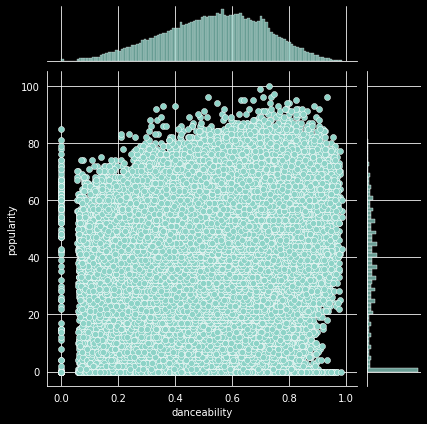

In [ ]:
sns.jointplot(x = 'danceability', y = 'popularity', data = raw_dataset)

### `duration_ms`

**Extremo Inferior:** 30967.5 ms -> 0,516 minutos (30.97 segundos)

* Se puede notar una tendencia de baja en la popularidad para estos outliers, ya que el 75% de estos tiene popularidad 0, por lo que puede existir una relación entre estas bajas duraciones y la popularidad, por lo tanto, se opta por mantener estos datos y asi evitar un posible overfitting.

**Extremo Superior:** 401259.5 ms -> 6.688 minutos (401.28 segundos)

* Si bien se puede ver una pequeña tendencia de baja en la popularidad cuando las canciones tienen mayor duración, no se puede decir que existe una alta cantidad de datos que lo demuestre, además se debe considerar que en promedio una canción dura 230948.3 ms (3.85 min) y que incluso el 75% de las canciones no supera los 262400 ms (4.37 min), se opta por eliminar estos outliers.

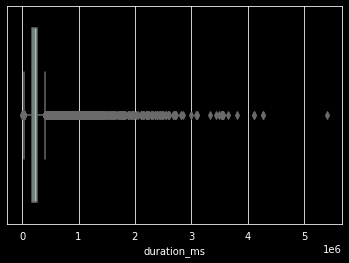

In [ ]:
ax = sns.boxplot(x=raw_dataset["duration_ms"])

In [ ]:
raw_dataset[raw_dataset.duration_ms < 30967.5].sort_values(by = 'popularity', ascending = False)

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
155544,0.5190,2020,0.9910,['Juice WRLD'],0.392,30583,0.3730,1,1OjiYjgPZyxS0AiXiSnuYI,0.097800,0,0.5450,-14.097,1,Juice WRLD Speaks From Heaven - Outro,66,2020-07-10,0.0968,121.678
124835,0.1130,2020,0.0673,['Dayday Hotnow'],0.914,30579,0.3820,0,5G5H0NFRrp3TCybwAxMJdy,0.011400,6,0.1030,-15.308,1,The Crib,64,2020-10-28,0.4450,105.042
71311,0.8110,2001,0.0988,['Thomas & Friends'],0.906,30946,0.5960,0,2mQVahe9gsumDmr67neUzb,0.000059,8,0.0561,-10.254,1,Thomas Theme (Reprise),53,2001-01-01,0.0463,98.980
73836,0.8040,2013,0.4950,['Chance the Rapper'],0.759,30301,0.1110,0,3VhGbMpUONRwUIvgFoF14b,0.000000,10,0.4950,-21.779,0,Juice,52,2013-04-30,0.8610,109.238
11600,0.3090,1979,0.9170,['Pink Floyd'],0.555,30622,0.0193,0,21L1dVOTGhvAKvBXXnTIHj,0.001360,9,0.0658,-29.867,0,Stop,51,1979-11-30,0.0432,76.112
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60220,0.8200,1945,0.9940,"['Parul Ghosh', 'Chitalkar']",0.363,18360,0.1610,0,1pSex08ZvfpMpwxLwlHJZe,0.970000,5,0.1220,-12.053,1,Bhool Jana Chahti Hoon - Duet,0,1945-12-01,0.0730,68.389
60254,0.1650,1946,0.9830,"['George Frideric Handel', 'The Liverpool Phil...",0.351,22800,0.1800,0,2E1gkbp3j1n3sSX19tJT2p,0.000000,6,0.4500,-20.410,0,"Messiah, HWV 56, Pt. 2: He was cut off out of ...",0,1946,0.0519,107.805
60269,0.5210,1946,0.9940,"['Frédéric Chopin', 'Maryla Jonas']",0.471,30587,0.3140,0,2J96VWals9KGl87YoJHbaX,0.854000,7,0.1580,-16.222,1,"Mazurka in C Major, Op. 7 No. 5",0,1946,0.0615,128.720
60344,0.3820,1946,0.9950,"['Robert Schumann', 'Maryla Jonas']",0.285,27307,0.2180,0,2hhWYGVpdimu917EgOWK9V,0.938000,5,0.1010,-18.886,1,"Kinderszenen, Op. 15: 8. Am Kamin",0,1946,0.0657,86.932


In [ ]:
raw_dataset[raw_dataset.duration_ms < 30967.5].describe()

,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
count,226.000000,226.000000,226.000000,226.000000,226.000000,226.000000,226.000000,226.000000,226.000000,226.000000,226.000000,226.000000,226.000000,226.000000,226.000000
mean,0.492231,1946.500000,0.821342,0.452028,24198.743363,0.290284,0.004425,0.398796,5.300885,0.289642,-20.299765,0.650442,2.858407,0.177360,100.737544
std,0.374450,14.949173,0.269028,0.222015,5809.337946,0.255155,0.066519,0.420850,3.483000,0.218066,10.436149,0.477889,10.800302,0.268831,45.353106
min,0.000000,1926.000000,0.000000,0.000000,5108.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000
25%,0.037300,1938.250000,0.807250,0.316250,20461.500000,0.109000,0.000000,0.000027,2.000000,0.120250,-23.033000,0.000000,0.000000,0.040675,76.191500
50%,0.549500,1946.000000,0.945500,0.464000,25600.000000,0.221500,0.000000,0.166500,5.000000,0.216500,-18.048000,1.000000,0.000000,0.055500,99.930000
75%,0.837000,1951.000000,0.988000,0.623000,29497.000000,0.412000,0.000000,0.879500,8.000000,0.427500,-13.466250,1.000000,0.000000,0.162500,131.461750
max,1.000000,2020.000000,0.995000,0.914000,30960.000000,1.000000,1.000000,0.993000,11.000000,0.976000,0.674000,1.000000,66.000000,0.962000,203.903000


In [ ]:
raw_dataset[raw_dataset.duration_ms > 401259.5].sort_values(by = 'popularity', ascending = False)

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
18223,0.5120,2013,0.2340,['Justin Timberlake'],0.574,484147,0.5120,0,4rHZZAmHpZrA3iH5zx8frV,0.000000,5,0.0946,-6.664,0,Mirrors,81,2013-03-15,0.0503,76.899
13813,0.2260,1991,0.0163,"[""Guns N' Roses""]",0.294,536067,0.6410,0,3YRCqOhFifThpSRFJ1VWFM,0.220000,11,0.1120,-9.316,1,November Rain,80,1991-09-17,0.0291,79.759
15613,0.5070,2000,0.0371,"['Eminem', 'Dido']",0.780,404107,0.7680,1,3UmaczJpikHgJFyBTAJVoz,0.000002,6,0.5180,-4.325,0,Stan,78,2000-05-23,0.2380,80.063
19367,0.4420,2018,0.5420,"['Nio Garcia', 'Casper Magico', 'Bad Bunny', '...",0.903,417920,0.6750,1,3V8UKqhEK5zBkBb6d6ub8i,0.000013,11,0.0595,-3.445,0,Te Boté - Remix,78,2018-04-13,0.2140,96.507
9809,0.1970,1971,0.5800,['Led Zeppelin'],0.338,482830,0.3400,0,5CQ30WqJwcep0pYcV4AMNc,0.003200,9,0.1160,-12.049,0,Stairway to Heaven - Remaster,78,1971-11-08,0.0339,82.433
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94200,0.0860,1947,0.7320,['David Raskin'],0.159,1181533,0.1280,0,54FXuRdpKxTZqzYSd5hUqy,0.768000,4,0.1490,-22.216,0,Part III: Amber's Theme / Ride / Death / Sickn...,0,1947,0.0371,97.301
94197,0.2010,1947,0.9930,"['Ludwig van Beethoven', 'Rudolf Serkin']",0.431,419493,0.0241,0,52vmipU0V7LH2X2vsh7kpr,0.915000,1,0.1050,-25.065,1,"Sonata No. 23 in F Minor for Piano, Op. 57 ""Ap...",0,1947,0.0412,97.427
94196,0.0810,1947,0.8820,"['Johannes Brahms', 'Isaac Stern', 'Sir Thomas...",0.194,1355640,0.1260,0,52eDKUu2Xsd1GPqcgCFuwM,0.503000,2,0.1430,-16.791,1,"Violin Concerto in D Major, Op. 77: I. Allegro...",0,1947,0.0440,76.945
94176,0.2180,1947,0.9120,"['Wolfgang Amadeus Mozart', 'George Szell', 'C...",0.242,484933,0.2120,0,4ulxWHnQrvaPPH3dHURNfp,0.896000,2,0.0968,-14.277,1,"Symphony No. 35 in D Major, K. 385 ""Haffner"": ...",0,1947,0.0330,150.541


In [ ]:
raw_dataset[raw_dataset.duration_ms > 401259.5].describe()

,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
count,9292.000000,9292.000000,9292.000000,9292.000000,9.292000e+03,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000,9292.000000
mean,0.358166,1969.648192,0.573260,0.422062,5.785393e+05,0.408941,0.022385,0.360633,5.140659,0.243057,-14.183204,0.650237,24.042079,0.090620,111.955650
std,0.254340,22.080286,0.377206,0.184486,2.952967e+05,0.268395,0.147940,0.377471,3.528581,0.236971,5.814362,0.476921,19.191422,0.167419,28.940932
min,0.000000,1921.000000,0.000000,0.000000,4.012670e+05,0.000000,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000
25%,0.131000,1952.000000,0.161000,0.287000,4.360000e+05,0.179000,0.000000,0.001307,2.000000,0.096800,-17.795000,0.000000,2.000000,0.037400,89.026500
50%,0.315000,1969.000000,0.698000,0.403000,4.920130e+05,0.364500,0.000000,0.173000,5.000000,0.132000,-13.643500,1.000000,25.000000,0.044200,110.616500
75%,0.551000,1985.000000,0.940000,0.549000,5.958530e+05,0.622000,0.000000,0.797000,8.000000,0.296000,-9.782000,1.000000,39.000000,0.061000,131.125500
max,0.983000,2020.000000,0.996000,0.983000,5.403500e+06,1.000000,1.000000,1.000000,11.000000,0.999000,0.457000,1.000000,81.000000,0.968000,217.591000


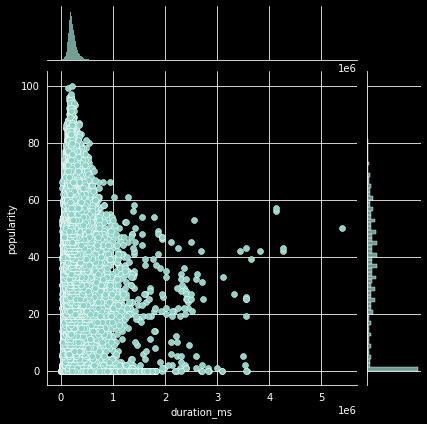

In [ ]:
sns.jointplot(x = 'duration_ms', y = 'popularity', data = raw_dataset)

### `energy`
La variable `energy` no presenta outliers significativos, por lo que se usará sin problemas para para la investigación.

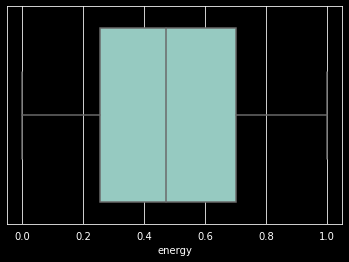

In [ ]:
ax = sns.boxplot(x=raw_dataset["energy"])

### `explicit`
En esta variable, solo un ~8.46% de las canciones son explicitas (explicit == 1), ya que solamente posee el valor de 0 y 1, siendo más del 91% de los datos 0, por lo que se encuentra que todos las canciones explicitas son outliers, sin embargo, como se noto previamente en el analisis exploratorio, las canciones explicitas tienen un promedio considerablemente más alto de popularidad que las no explicitas, por lo que se opta por conservar estos outliers y la columna en general.

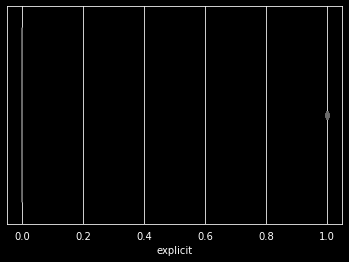

In [ ]:
ax = sns.boxplot(x=raw_dataset["explicit"])

In [ ]:
raw_dataset['explicit'].value_counts()

0    156220
1     14433
Name: explicit, dtype: int64

In [ ]:
explicit0 = len(raw_dataset[raw_dataset.explicit == 0])
explicit1 = len(raw_dataset[raw_dataset.explicit == 1])
total = len(raw_dataset.index)

print("% explicit == 0: ", (explicit0/total)*100)
print("% explicit == 1: ", (explicit1/total)*100)

% explicit == 0:  91.54248680070084
% explicit == 1:  8.457513199299163


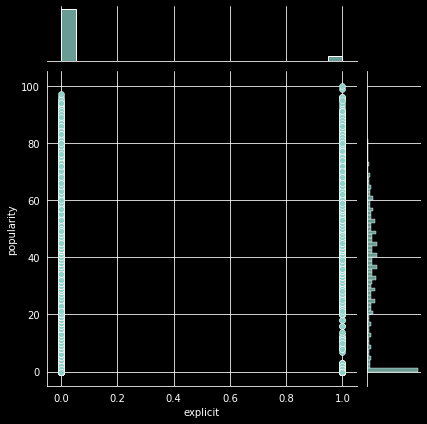

In [ ]:
sns.jointplot(x = 'explicit', y = 'popularity', data = raw_dataset)

### `instrumentalness`
**Extremo Superior**: *sobre 0.25500*

* Si bien el promedio de instrumentalidad es de *0.129905*, los outliers encontrados son una cantidad considerable del dataset y corresponden a piezas musicales instrumentales, ya sean orquestas, sonatas u otro tipo de instrumentos, por lo que deben ser considerados y que por lo tanto no se eliminaran.

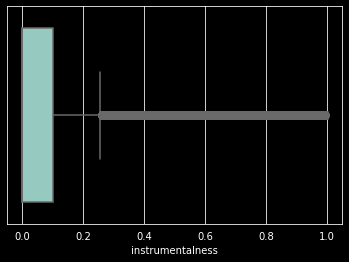

In [ ]:
ax = sns.boxplot(x=raw_dataset["instrumentalness"])

In [ ]:
raw_dataset[raw_dataset.instrumentalness > 0.25500].sort_values(by = 'popularity', ascending = False)

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
19427,0.2430,2019,0.90200,['Billie Eilish'],0.704,245426,0.22500,0,3ZCTVFBt2Brf31RLEnCkWJ,0.657,6,0.1060,-14.454,0,everything i wanted,87,2019-11-13,0.0994,120.006
19649,0.4530,2020,0.00981,['Don Toliver'],0.629,167916,0.69200,1,527k23H0A4Q0UJN3vGs0Da,0.331,5,0.6030,-8.045,1,After Party,86,2020-03-13,0.0376,162.948
19438,0.3130,2019,0.47100,['Labrinth'],0.316,153294,0.63000,0,6N22FZs2ZhPBYi3b9XPajV,0.262,5,0.2050,-5.963,1,Still Don't Know My Name,86,2019-10-04,0.1170,89.643
19030,0.0000,2017,0.79100,"['Erik Eriksson', 'White Noise Baby Sleep', 'W...",0.000,90228,0.00342,0,2bRKxuH1o7pTmb1y4GfdEc,1.000,8,0.1110,-28.460,1,Clean White Noise - Loopable with no fade,85,2017-01-08,0.0000,0.000
19454,0.5000,2019,0.13200,['Dayglow'],0.641,278769,0.84200,0,64lsIF5pw0sJY0gV5kz0RN,0.910,9,0.4190,-7.270,1,Can I Call You Tonight?,82,2019-11-14,0.0292,129.980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125919,0.0765,1945,0.98700,"['Ludwig van Beethoven', 'Ania Dorfmann', 'Art...",0.201,575253,0.08940,0,4Uq2Q30FhLmbVnIqUshb2Q,0.874,8,0.1250,-19.302,1,"Piano Concerto No. 1 in C Major, Op. 15: II. L...",0,1945,0.0357,84.266
125926,0.2120,1945,0.98500,"['Aaron Copland', 'William Kapell']",0.270,276000,0.13600,0,4WXgjf5hIlNI0dVZyszfEb,0.830,3,0.1030,-20.422,0,Piano Sonata: Vivace,0,1945,0.0559,174.995
125929,0.1680,1945,0.93700,"['Ludwig van Beethoven', 'Joseph Szigeti', 'Br...",0.259,1349000,0.09080,0,4Wv8iXNu1X0oOeKRpkYCyk,0.667,2,0.1690,-19.225,1,"Violin Concerto in D Major, Op. 61: I. Allegro...",0,1945,0.0444,87.804
125936,0.0438,1945,0.93800,"['Johannes Brahms', 'William Kapell', 'Jascha ...",0.160,262627,0.23900,0,4YQfgMQSVuBMFVwZaNkCdz,0.395,2,0.1320,-16.863,1,"Violin Sonata No. 3 in D Minor, Op. 108: II. A...",0,1945,0.0410,98.491


In [ ]:
raw_dataset[raw_dataset.instrumentalness > 0.25500].describe()

,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
count,36105.000000,36105.000000,36105.000000,36105.000000,3.610500e+04,36105.000000,36105.000000,36105.000000,36105.000000,36105.000000,36105.000000,36105.000000,36105.000000,36105.000000,36105.000000
mean,0.436555,1963.764548,0.722125,0.449814,2.535207e+05,0.350371,0.011965,0.739919,5.117214,0.192210,-15.539484,0.676278,19.462651,0.062023,111.277675
std,0.292336,25.220625,0.364959,0.187021,1.788880e+05,0.268824,0.108730,0.205730,3.464389,0.164577,6.653422,0.467902,20.100250,0.062903,31.516826
min,0.000000,1921.000000,0.000000,0.000000,8.853000e+03,0.000020,0.000000,0.256000,0.000000,0.015800,-55.000000,0.000000,0.000000,0.000000,0.000000
25%,0.163000,1945.000000,0.508000,0.312000,1.661600e+05,0.134000,0.000000,0.601000,2.000000,0.101000,-19.482000,0.000000,0.000000,0.036600,85.636000
50%,0.409000,1958.000000,0.931000,0.448000,2.029870e+05,0.277000,0.000000,0.826000,5.000000,0.125000,-14.741000,1.000000,14.000000,0.043800,109.825000
75%,0.690000,1983.000000,0.989000,0.586000,2.937070e+05,0.521000,0.000000,0.902000,8.000000,0.219000,-10.661000,1.000000,36.000000,0.059500,130.877000
max,1.000000,2020.000000,0.996000,0.983000,5.403500e+06,1.000000,1.000000,1.000000,11.000000,0.999000,3.855000,1.000000,87.000000,0.960000,243.507000


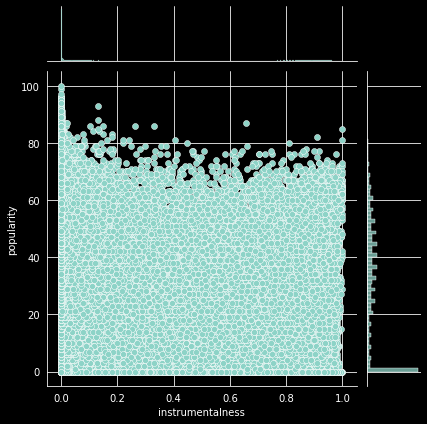

In [ ]:
sns.jointplot(x = 'instrumentalness', y = 'popularity', data = raw_dataset)

### `key`

La variable `key` no presenta outliers significativos, por lo que se usará sin problemas para para la investigación.

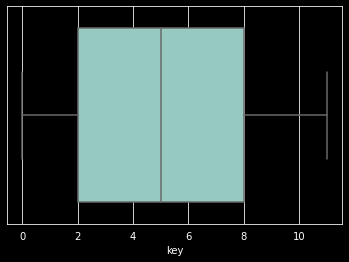

In [ ]:
ax = sns.boxplot(x=raw_dataset["key"])

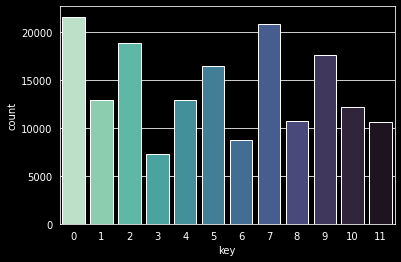

In [ ]:
sns.countplot(x="key", data=raw_dataset, palette="mako_r")
plt.xlabel("key")
plt.show()

### `liveness`
Estos outliers corresponden a canciones que probablemente fueron grabadas en vivo, y por lo tanto, pueden ser útiles para determinar si las personas buscan o no este tipo de canciones, por lo tanto se conservaran.

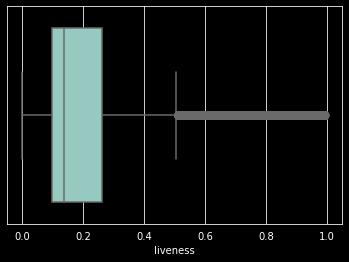

In [ ]:
ax = sns.boxplot(x=raw_dataset["liveness"])

In [ ]:
raw_dataset[raw_dataset.liveness > 0.50430].sort_values(by = 'liveness', ascending = False)

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
166940,0.855,2002,0.17400,['The Band'],0.586,331467,0.965,0,21Saw6Z6sW4ZJ7HFgWdvmo,0.000001,2,1.000,-6.017,1,Up on Cripple Creek - Concert Version,39,2002-12-16,0.0790,132.922
62381,0.198,1956,0.41000,['Duke Ellington'],0.492,552200,0.578,0,0k2cvPNBXi2dxDWmcQujYJ,0.467000,7,0.999,-16.891,1,Skin Deep - Live,16,1956,0.0815,130.141
161450,0.479,1974,0.78900,['Loggins & Messina'],0.517,187187,0.181,0,4iM9khwTMsvMxgpVEQ5yyO,0.000002,1,0.998,-15.365,0,You Could Break My Heart - Live,18,1974,0.0600,123.274
87749,0.424,1997,0.00149,['Fleetwood Mac'],0.440,310960,0.784,0,2hwFQrMDzCPUr8vCanCw0E,0.000266,7,0.998,-7.688,1,The Chain - Live at Warner Brothers Studios in...,43,1997-08-19,0.0624,79.015
67160,0.743,1980,0.01730,['Eagles'],0.492,309467,0.895,0,7aMJo6bv0PFq2bX969Wgos,0.148000,9,0.997,-6.309,1,Life in the Fast Lane - Live; 1999 Remaster,35,1980-11-07,0.0648,111.115
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41722,0.479,1942,0.21300,['Cade Walker'],0.589,149751,0.276,0,24XIPWKZQTE4JyiKtjkDil,0.000000,8,0.505,-13.731,1,White Christmas,0,1942-05-29,0.0502,116.247
101757,0.307,1985,0.72400,['Roupa Nova'],0.489,242733,0.475,0,4Bd8jSFBXHC1K7JAKW9Ojm,0.000000,7,0.505,-9.565,1,Dona,58,1985-08-22,0.0343,139.213
30715,0.208,1980,0.96700,"['Giuseppe Verdi', 'Luciano Pavarotti', 'Dame ...",0.395,167027,0.246,0,2zGVfygrdGVKCZ54sxCaQH,0.000008,10,0.505,-16.601,1,La traviata / Act 1: Libiamo ne'lieti calici,37,1980-01-01,0.0644,110.022
58011,0.599,1929,0.34800,['Эрнест Хемингуэй'],0.729,103259,0.165,1,6Zd0MGfkawI7lvu6rUxc6D,0.000000,7,0.505,-24.461,1,Часть 78.4 & Часть 79.1 - Прощай оружие,0,1929,0.9360,78.570


In [ ]:
raw_dataset[raw_dataset.liveness > 0.50430].describe()

,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
count,11808.000000,11808.000000,11808.000000,11808.000000,1.180800e+04,11808.000000,11808.000000,11808.000000,11808.000000,11808.000000,11808.000000,11808.000000,11808.000000,11808.000000,11808.000000
mean,0.519006,1974.784299,0.483323,0.492856,2.637681e+05,0.567290,0.100694,0.143903,5.224424,0.717141,-11.007124,0.710451,28.355860,0.147252,117.231071
std,0.246700,24.234998,0.369181,0.162255,2.219721e+05,0.264584,0.300936,0.287785,3.529897,0.143675,5.168996,0.453572,20.345938,0.214326,31.259921
min,0.000000,1921.000000,0.000000,0.000000,1.197300e+04,0.000020,0.000000,0.000000,0.000000,0.505000,-39.198000,0.000000,0.000000,0.000000,0.000000
25%,0.331000,1955.000000,0.094675,0.380000,1.718400e+05,0.346000,0.000000,0.000000,2.000000,0.598000,-13.931250,0.000000,9.000000,0.040700,93.504500
50%,0.531000,1975.000000,0.486000,0.494000,2.209670e+05,0.574500,0.000000,0.000195,5.000000,0.689000,-10.199000,1.000000,29.000000,0.060100,115.165500
75%,0.716000,1994.000000,0.856000,0.607000,2.962302e+05,0.802250,0.000000,0.064550,8.000000,0.833000,-7.182750,1.000000,44.000000,0.134000,136.164250
max,1.000000,2020.000000,0.996000,0.978000,3.569933e+06,1.000000,1.000000,1.000000,11.000000,1.000000,3.855000,1.000000,90.000000,0.968000,218.363000


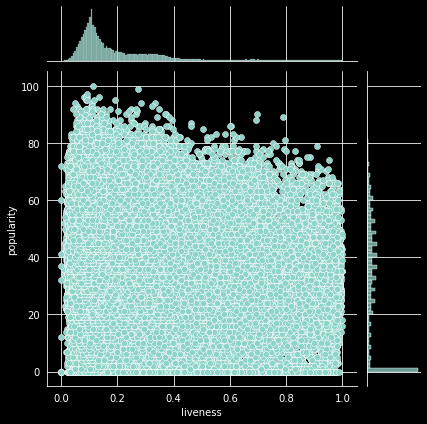

In [ ]:
sns.jointplot(x = 'liveness', y = 'popularity', data = raw_dataset)

### `loudness`
Este tipo de canciones pueden incluir canciones de relajación, canciones con bajo volumen (menores dB) o canciones instrumentales, por lo que se optara por conservar estos outliers.

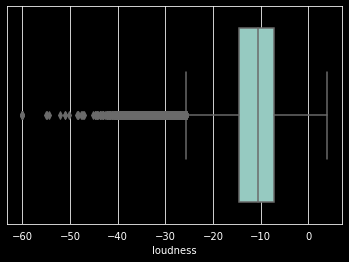

In [ ]:
ax = sns.boxplot(x=raw_dataset["loudness"])

In [ ]:
raw_dataset[raw_dataset.loudness < -25.76300].sort_values(by = 'popularity', ascending = False)

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
19030,0.000,2017,0.7910,"['Erik Eriksson', 'White Noise Baby Sleep', 'W...",0.000,90228,0.00342,0,2bRKxuH1o7pTmb1y4GfdEc,1.000,8,0.1110,-28.460,1,Clean White Noise - Loopable with no fade,85,2017-01-08,0.0000,0.000
19260,0.000,2018,0.3940,['High Altitude Samples'],0.000,160003,0.00148,0,129ldjjvnFfA7Ygc8ktYnh,1.000,5,0.1110,-31.839,1,Soft Brown Noise,81,2018-11-15,0.0000,0.000
19038,0.000,2017,0.9230,['Granular'],0.000,147097,0.00005,0,65rkHetZXO6DQmBh3C2YtW,0.297,10,0.1100,-32.354,0,White Noise - 500 hz,79,2017-10-13,0.0000,0.000
19029,0.000,2017,0.9440,['Granular'],0.000,135484,0.00002,0,6H4B9gJD6eQlNoEh8q85pP,0.869,2,0.1120,-40.449,0,White Noise - 145 hz,78,2017-10-13,0.0000,0.000
75221,0.000,2020,0.9160,['Water Sound Natural White Noise'],0.000,63000,0.03200,0,5pGBDKBaR63vuJ4g8ialcU,0.202,1,0.1030,-30.704,1,Deep Sleep Recovery Noise,74,2020-02-25,0.0000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93849,0.219,1945,0.9850,"['Claude Debussy', 'William Kapell']",0.250,135800,0.08270,0,3BoCaEeUjFzrUuYNZdfw98,0.866,11,0.1720,-27.807,1,Children's Corner: The Snow Is Dancing,0,1945,0.0358,128.405
93833,0.283,1945,0.9940,"['Johann Sebastian Bach', 'William Kapell']",0.297,292893,0.12000,0,37YHVDptCoOZqUT7KodnCw,0.879,2,0.0700,-28.250,1,"Partita No.4 in D Major, BWV 828: Sarabande",0,1945,0.0436,139.910
93830,0.191,1945,0.9300,"['Modest Mussorgsky', 'William Kapell']",0.298,239267,0.02000,0,3762uC6rJvH57tz1MHsEhE,0.150,8,0.1660,-26.542,1,Pictures at an Exhibition: Il vecchio castello...,0,1945,0.0327,88.418
93788,0.649,1945,0.0117,['Federico García Lorca'],0.567,97047,0.21400,0,2xSLU0uoDv4Ot0dpViMfEy,0.000,1,0.4850,-27.213,1,Capítulo 4.6 & Capítulo 5.1 - la Casa de Berna...,0,1945,0.9540,168.740


In [ ]:
raw_dataset[raw_dataset.loudness < -25.76300].describe()

,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
count,3499.000000,3499.000000,3499.000000,3499.000000,3.499000e+03,3499.000000,3499.000000,3499.000000,3499.000000,3499.000000,3499.000000,3499.000000,3499.000000,3499.000000,3499.000000
mean,0.209411,1965.410975,0.917381,0.326080,2.246472e+05,0.051448,0.004859,0.680182,5.115462,0.149885,-29.963749,0.665619,20.523864,0.084177,98.381145
std,0.206765,26.124646,0.175191,0.168019,2.031806e+05,0.079684,0.069544,0.358851,3.423398,0.129780,4.189674,0.471841,21.236496,0.155445,32.725599
min,0.000000,1921.000000,0.000000,0.000000,5.108000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000
25%,0.050550,1947.000000,0.933000,0.191500,1.217500e+05,0.013400,0.000000,0.490000,2.000000,0.091300,-31.684000,0.000000,0.000000,0.039500,75.170500
50%,0.133000,1957.000000,0.981000,0.317000,1.835730e+05,0.030300,0.000000,0.882000,5.000000,0.109000,-28.657000,1.000000,13.000000,0.044300,89.160000
75%,0.297000,1987.500000,0.993000,0.436000,2.758270e+05,0.059100,0.000000,0.925000,8.000000,0.138000,-26.978500,1.000000,38.000000,0.053700,119.489500
max,0.985000,2020.000000,0.996000,0.872000,4.269407e+06,0.984000,1.000000,1.000000,11.000000,0.981000,-25.764000,1.000000,85.000000,0.961000,218.435000


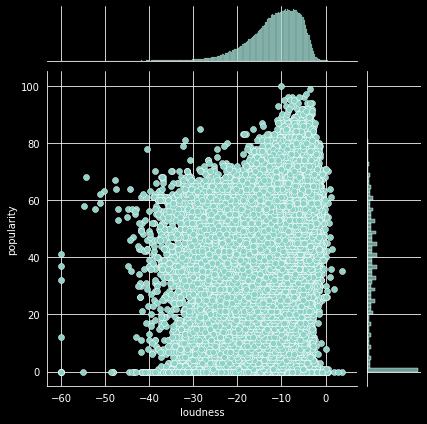

In [ ]:
sns.jointplot(x = 'loudness', y = 'popularity', data = raw_dataset)

### `mode`
La variable `mode` no presenta outliers significativos, por lo que se usará sin problemas para para la investigación.

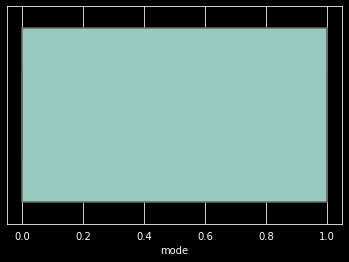

In [ ]:
ax = sns.boxplot(x=raw_dataset["mode"])

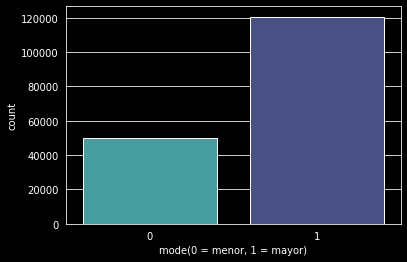

In [ ]:
sns.countplot(x="mode", data=raw_dataset, palette="mako_r")
plt.xlabel("mode(0 = menor, 1 = mayor)")
plt.show()

### `popularity`
La variable `popularity` no presenta outliers significativos, por lo que se usará sin problemas para para la investigación.

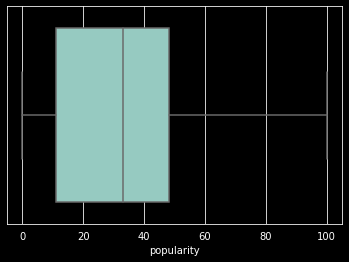

In [ ]:
ax = sns.boxplot(x=raw_dataset["popularity"])

### `speechiness`
Si bien esta variable considera el hecho de que mientras mayor sea, es más probable que la canción sea hablada o como tipo discurso o que contenga cada vez menos instrumentos musicales, esto puede incluir canciones a capella, rap o hip-hop, además de que es una cantidad considerable de canciones dentro del dataset, incluso si se toman valores sobre 0.8, estas canciones pueden seguir siendo de alguno de los distintos géneros musicales hablados, por lo que se opta por conservar estos outliers

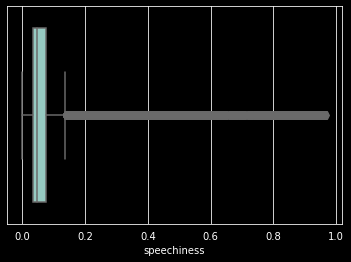

In [ ]:
ax = sns.boxplot(x=raw_dataset["speechiness"])

In [ ]:
raw_dataset[raw_dataset.speechiness > 0.8].sort_values(by = 'popularity', ascending = False)

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
38500,0.544,2020,0.8640,['BTS'],0.703,179548,0.321,0,4GVwjLRT7oSsKby7Vy8EHr,0.000000,4,0.9080,-13.135,1,Skit,79,2020-11-20,0.884,114.822
18659,0.528,2015,0.2720,"['Lin-Manuel Miranda', 'Leslie Odom Jr.', 'Ant...",0.646,156631,0.439,0,6dr7ekfhlbquvsVY8D7gyk,0.000000,7,0.0945,-10.837,1,"Aaron Burr, Sir",73,2015-09-25,0.818,160.387
57074,0.628,2019,0.1840,"['Cordae', 'Anderson .Paak']",0.611,175828,0.714,1,5lw8Mgb4LyhriPIC86gV6e,0.000000,9,0.1450,-4.696,0,RNP (feat. Anderson .Paak),72,2019-07-26,0.856,196.043
38347,0.457,2019,0.3630,['J.I the Prince of N.Y'],0.806,142289,0.368,1,18wBygantQ9hYTzPgpSVTk,0.000000,5,0.1100,-12.745,0,Blame on Me,71,2019-10-11,0.868,81.034
108829,0.945,2020,0.7420,"['21 Savage', 'Metro Boomin']",0.607,57074,0.371,1,2y3mrzWEWaAFqb2jf5fED8,0.000164,1,0.4030,-14.255,0,Snitches & Rats (Interlude),69,2020-10-02,0.894,102.481
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75335,0.430,1926,0.1580,['Эрнест Хемингуэй'],0.706,105559,0.273,1,50TJ39MHPLy7mT18kncq3c,0.000000,3,0.3200,-15.010,0,Часть 76.4 & Часть 77.1 - Фиеста,0,1926,0.943,131.129
75336,0.455,1926,0.0729,['Эрнест Хемингуэй'],0.691,97600,0.289,1,50sFUQNfaNFjC6Jon8CqHf,0.000000,5,0.1390,-12.514,0,Часть 45.3 - Фиеста,0,1926,0.937,89.712
22842,0.619,1940,0.1360,['Эрнест Хемингуэй'],0.713,98500,0.163,1,0Ksx1Yo65OT2CEr0TUYiwN,0.000000,11,0.3380,-17.335,0,Часть 65.2 - По ком звонит колокол,0,1940,0.947,83.490
22839,0.542,1940,0.6310,['Эрнест Хемингуэй'],0.774,127606,0.141,1,0KDVUoMMMElpyh0JSiw7qR,0.000000,11,0.2930,-18.070,0,Часть 147.4 & Часть 148.1 - По ком звонит колокол,0,1940,0.938,112.648


In [ ]:
raw_dataset[raw_dataset.speechiness > 0.13665].describe()

,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
count,23937.000000,23937.000000,23937.000000,23937.000000,2.393700e+04,23937.000000,23937.000000,23937.000000,23937.000000,23937.000000,23937.000000,23937.000000,23937.000000,23937.000000,23937.000000
mean,0.573289,1976.198855,0.416799,0.650355,2.115821e+05,0.512954,0.383548,0.070932,5.413544,0.256097,-11.252970,0.631157,29.613151,0.398658,118.296250
std,0.217840,32.151261,0.367223,0.155404,1.356788e+05,0.274156,0.486260,0.211089,3.646461,0.208020,6.066812,0.482501,25.478028,0.284142,34.475356
min,0.000000,1921.000000,0.000002,0.057400,1.530700e+04,0.000182,0.000000,0.000000,0.000000,0.009670,-41.180000,0.000000,0.000000,0.137000,32.800000
25%,0.417000,1945.000000,0.062500,0.559000,1.438270e+05,0.254000,0.000000,0.000000,2.000000,0.109000,-15.884000,0.000000,0.000000,0.189000,90.237000
50%,0.591000,1983.000000,0.308000,0.675000,1.952130e+05,0.523000,0.000000,0.000000,6.000000,0.176000,-9.850000,1.000000,34.000000,0.276000,112.630000
75%,0.740000,2006.000000,0.791000,0.751000,2.495200e+05,0.741000,1.000000,0.000517,9.000000,0.338000,-6.280000,1.000000,51.000000,0.469000,141.889000
max,1.000000,2020.000000,0.996000,0.986000,3.569933e+06,1.000000,1.000000,0.999000,11.000000,0.996000,3.744000,1.000000,96.000000,0.970000,221.741000


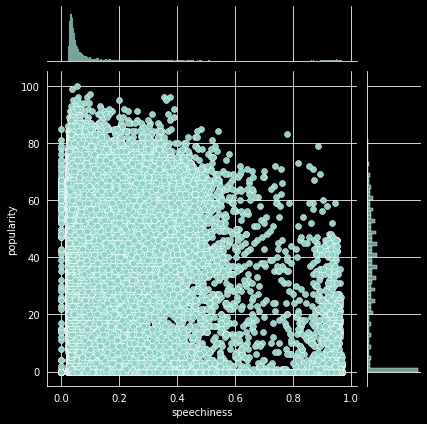

In [ ]:
sns.jointplot(x = 'speechiness', y = 'popularity', data = raw_dataset)

### `tempo`
**Extremo Inferior**: tempo < 30.24700 bpm
* Estas canciones pueden contenter piezas instrumentales, sin embargo todos los datos menores a esta cantidad son de ***0 bmp*** y en su mayoría son ruidos de corta o larga duración (ej: Hz, ruidos del oceano, lluvia, etc) o incluir rutinas de comedias, dado que no es una cantidad significativa ni datos útiles para el modelo, por lo que se optara por eliminar estos datos.

**Extremo Superior**: tempo > 198.71100
* Estas canciones incluyen remix , colaboraciones entre distintos artistas y distintos generos musicales, por lo tanto se conservaran estos datos.

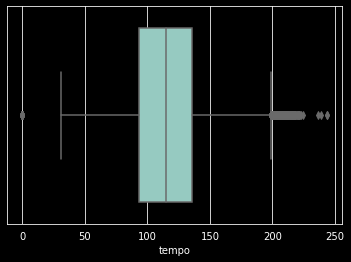

In [ ]:
ax = sns.boxplot(x=raw_dataset["tempo"])

In [ ]:
raw_dataset[raw_dataset.tempo < 30.24700]

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
508,0.0,1924,0.99600,['Ignacio Corsini'],0.0,133947,0.025800,0,2WTtJDfCUjAyCZHRSfCLDn,0.76800,5,0.0831,-24.894,1,La Mina del Ford - Remasterizado,0,1924-03-29,0.0,0.0
591,0.0,1924,0.99600,['Francisco Canaro'],0.0,170253,0.315000,0,5tQsQaMquCXBREb1FNymi7,0.95600,8,0.3750,-15.969,0,Oh Mujer Mujer - Remasterizado,0,1924-07-12,0.0,0.0
2578,0.0,1934,0.00244,['The Moors'],0.0,14629,0.801000,0,29IVdlO7CSlcoOIpOsamkO,0.00125,4,0.0503,-0.671,0,Santa Claus Is Coming To Town,0,1934,0.0,0.0
2764,0.0,1935,0.93600,['Orquesta Francisco Canaro'],0.0,211880,0.202000,0,1QXbWUSsLWPtHrbZ7H8o9i,0.01370,6,0.1200,-12.399,1,Tu Y Yo,4,1935-01-01,0.0,0.0
3042,0.0,1937,0.89000,['Billie Holiday'],0.0,159600,0.281000,0,09eDRV4nzC3eVX7tDEJUNb,0.00000,10,0.2470,-13.078,1,Back In Your Own Backyard - Take 1,17,1937,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
169591,0.0,2015,0.46900,['$uicideBoy$'],0.0,153809,0.630000,1,00CutyaH2ljgLtM0nM5LLd,0.37500,2,0.1270,-6.707,1,Clouds As Witnesses,52,2015-03-03,0.0,0.0
169717,0.0,2016,0.12700,"['Rain Sounds', 'Rain Sounds & White Noise', '...",0.0,93452,0.000062,0,6HMSnRW8Htfd3YxdNgUF73,0.99900,9,0.7180,-18.685,1,Pouring Rain,54,2016-03-01,0.0,0.0
169935,0.0,2017,0.42000,['Granular'],0.0,180656,0.001720,0,03sJaTenPLeRaVUISW6pI5,0.39900,4,0.1100,-27.848,0,Pink Noise - BP 240 hz,61,2017-11-24,0.0,0.0
169968,0.0,2017,0.96200,['Fabricants'],0.0,175680,0.000020,0,4UYLGTJRGCt4KzP9r9Y9bH,0.02800,11,0.1370,-52.220,0,Brain Relaxation,57,2017-01-18,0.0,0.0


In [ ]:
raw_dataset[raw_dataset.tempo < 30.24700].describe()

,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
count,143.0,143.000000,143.000000,143.0,1.430000e+02,143.000000,143.000000,143.000000,143.000000,143.000000,143.000000,143.000000,143.000000,143.0,143.0
mean,0.0,1985.818182,0.560623,0.0,1.891800e+05,0.186423,0.013986,0.481097,4.776224,0.307774,-22.599427,0.713287,37.265734,0.0,0.0
std,0.0,33.743990,0.409229,0.0,4.577506e+05,0.263091,0.117845,0.417927,3.662562,0.268493,13.449279,0.453816,28.585417,0.0,0.0
min,0.0,1924.000000,0.000000,0.0,5.108000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.0,0.0
25%,0.0,1949.500000,0.117500,0.0,6.912900e+04,0.000062,0.000000,0.000809,1.000000,0.111000,-25.555500,0.000000,0.000000,0.0,0.0
50%,0.0,2009.000000,0.747000,0.0,1.435830e+05,0.040100,0.000000,0.399000,5.000000,0.182000,-19.082000,1.000000,48.000000,0.0,0.0
75%,0.0,2017.000000,0.951000,0.0,1.768465e+05,0.303000,0.000000,0.927000,8.000000,0.480500,-15.291000,1.000000,62.500000,0.0,0.0
max,0.0,2020.000000,0.996000,0.0,5.403500e+06,1.000000,1.000000,1.000000,11.000000,0.970000,3.855000,1.000000,85.000000,0.0,0.0


In [ ]:
raw_dataset[raw_dataset.tempo > 198.71100].sort_values(by = 'popularity', ascending = False)

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
8206,0.776,1963,0.766,['Andy Williams'],0.240,151933,0.5980,0,5hslUAKq9I9CG2bAulFkHN,0.000000,7,0.1170,-8.435,1,It's the Most Wonderful Time of the Year,83,1963-11-24,0.0369,201.629
19642,0.590,2020,0.428,['Morgan Wallen'],0.457,210123,0.7740,0,0tbjiOUl4k492KPdWZS9sy,0.000043,0,0.1190,-5.201,1,7 Summers,82,2020-08-14,0.0336,203.863
18647,0.354,2015,0.875,"['Rihanna', 'Kanye West', 'Paul McCartney']",0.582,188238,0.2720,0,78TTtXnFQPzwqlbtbwqN0y,0.000000,2,0.1300,-5.662,1,FourFiveSeconds,79,2015-01-24,0.0501,205.846
19499,0.137,2019,0.174,"['Mustard', 'Migos']",0.682,192471,0.5590,1,3j84U36KvLeXNDPv4t5pI8,0.000000,0,0.3440,-5.545,1,Pure Water (with Migos),79,2019-06-28,0.1270,202.015
19504,0.229,2019,0.979,['Clairo'],0.509,175961,0.0167,0,3zksbXteOCeSusJ5Xltr3t,0.000027,9,0.3870,-24.639,1,Bubble Gum,78,2019-02-22,0.1150,207.970
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20635,0.962,1929,0.994,['Francisco Canaro'],0.495,150000,0.2000,0,2f64akqOBSB9RhyPNbtsNo,0.890000,2,0.1170,-17.241,1,New York - Instrumental (Remasterizado),0,1929-11-06,0.0759,209.332
20603,0.920,1929,0.991,"['Francisco Canaro', 'Charlo']",0.493,198160,0.4380,0,2R8bY6oilivsGKW6ELrxnQ,0.262000,0,0.0744,-5.693,1,Sulamita - Remasterizado,0,1929-10-18,0.1200,202.169
20594,0.884,1929,0.995,"['Francisco Canaro', 'Charlo']",0.547,153507,0.1990,0,2K1kK8eDFsNivqnXRQmESq,0.721000,5,0.1120,-15.549,1,Los Caleseros - Remasterizado,0,1929-11-06,0.1590,206.884
20370,0.889,1928,0.995,"['Francisco Canaro', 'Charlo']",0.498,172507,0.3070,0,0bTwh8lOoNkUlvEOPb8RU7,0.849000,5,0.2200,-10.995,1,Y Con el Se Fue Mi Amor - Remasterizado,0,1928-10-03,0.1860,203.481


In [ ]:
raw_dataset[raw_dataset.tempo > 198.71100].describe()

,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
count,1502.000000,1502.000000,1502.000000,1502.000000,1502.000000,1502.000000,1502.000000,1502.000000,1502.000000,1502.000000,1502.000000,1502.000000,1502.000000,1502.000000,1502.000000
mean,0.654818,1975.769640,0.513574,0.426070,202001.310919,0.503718,0.046605,0.138092,5.158455,0.200249,-10.615259,0.770972,31.173768,0.110705,204.329783
std,0.240745,25.240381,0.355051,0.134674,74010.295084,0.237449,0.210860,0.294564,3.535702,0.175611,4.849902,0.420347,20.313657,0.129278,4.512061
min,0.000000,1923.000000,0.000003,0.077700,30000.000000,0.000603,0.000000,0.000000,0.000000,0.021800,-37.787000,0.000000,0.000000,0.027900,198.716000
25%,0.473000,1958.000000,0.154000,0.331000,159029.750000,0.319000,0.000000,0.000000,2.000000,0.090900,-13.242000,1.000000,15.000000,0.041600,201.198250
50%,0.698500,1978.000000,0.546000,0.427500,188093.500000,0.483000,0.000000,0.000032,5.000000,0.131000,-10.101000,1.000000,33.000000,0.060700,203.593000
75%,0.863750,1996.000000,0.846000,0.524000,233563.000000,0.675750,0.000000,0.027625,8.000000,0.249000,-7.129250,1.000000,46.000000,0.120000,206.159000
max,0.986000,2020.000000,0.996000,0.811000,854667.000000,0.996000,1.000000,0.985000,11.000000,0.991000,-1.270000,1.000000,83.000000,0.969000,243.507000


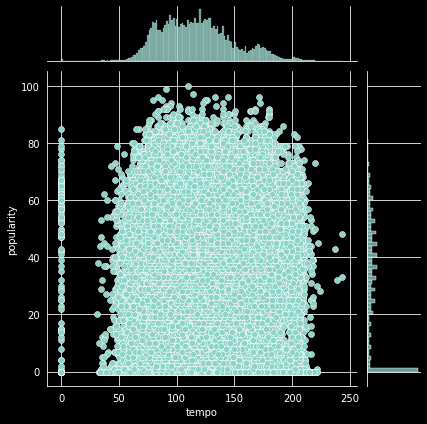

In [ ]:
sns.jointplot(x = 'tempo', y = 'popularity', data = raw_dataset)

### `valence`
La variable `valence` no presenta outliers significativos, por lo que se usará sin problemas para para la investigación.

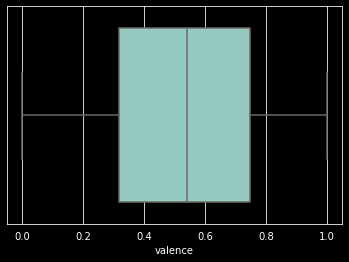

In [ ]:
ax = sns.boxplot(x=raw_dataset["valence"])

# 2. Tratamiento de datos

## Transformaciones

In [ ]:
dataset = raw_dataset.copy()

In [ ]:
# Eliminacion de Outliers danceability seleccionados
dataset.drop(dataset[dataset.danceability < 0.03550].index, inplace=True)

In [ ]:
# Eliminacion de Outliers duration_ms seleccionados
dataset.drop(dataset[dataset.duration_ms > 401259.5].index, inplace=True)

In [ ]:
# Eliminacion de Outliers tempo seleccionados
dataset.drop(dataset[dataset.tempo < 30.24700].index, inplace=True)

In [ ]:
#Se quitan las columnas que no se utilizaran
dataset.drop(['artists','id','name','release_date','year'],axis=1, inplace=True)

In [ ]:
dataset.describe()

,valence,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
count,161230.000000,161230.00000,161230.000000,161230.000000,161230.000000,161230.000000,161230.000000,161230.000000,161230.000000,161230.000000,161230.000000,161230.000000,161230.000000,161230.000000
mean,0.538838,0.49796,0.544479,211004.560553,0.486852,0.088216,0.155593,5.203511,0.203605,-11.302573,0.710159,31.853266,0.098921,117.239279
std,0.259949,0.37552,0.172699,66599.104679,0.266860,0.283609,0.305417,3.514151,0.170155,5.631689,0.453690,21.885853,0.162497,30.614311
min,0.000000,0.00000,0.055100,15307.000000,0.000216,0.000000,0.000000,0.000000,0.009670,-55.000000,0.000000,0.000000,0.022300,30.946000
25%,0.332000,0.09930,0.425000,167560.000000,0.261000,0.000000,0.000000,2.000000,0.098900,-14.380000,0.000000,12.000000,0.034800,93.763000
50%,0.551000,0.50600,0.555000,202935.000000,0.477000,0.000000,0.000143,5.000000,0.136000,-10.416000,1.000000,34.000000,0.045100,114.979000
75%,0.755000,0.88800,0.672000,251379.000000,0.707000,0.000000,0.065000,8.000000,0.259000,-7.064000,1.000000,49.000000,0.076900,135.917000
max,1.000000,0.99600,0.988000,401253.000000,1.000000,1.000000,1.000000,11.000000,1.000000,3.744000,1.000000,100.000000,0.970000,243.507000


In [ ]:
#Transformación variables categóricas

a = pd.get_dummies(dataset['explicit'])
a.columns = ['non_explicit', 'explicit']

b = pd.get_dummies(dataset['key'])
b.columns = ["C", "C#", "D", "D#", "E", "F", "F#", "G", "G#", "A", "A#", "B"]

c = pd.get_dummies(dataset['mode'])
c.columns = ['minor', 'major']

dataset.drop(['explicit', 'key', 'mode'], axis=1, inplace=True)

frames = [dataset, a, b, c]
dataset = pd.concat(frames, axis=1)
dataset.head()

,valence,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,popularity,speechiness,tempo,non_explicit,explicit,C,C#,D,D#,E,F,F#,G,G#,A,A#,B,minor,major
1,0.963,0.732,0.819,180533,0.341,0.000000,0.160,-12.441,5,0.4150,60.936,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
3,0.165,0.967,0.275,210000,0.309,0.000028,0.381,-9.316,3,0.0354,100.109,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1
4,0.253,0.957,0.418,166693,0.193,0.000002,0.229,-10.096,2,0.0380,101.665,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
5,0.196,0.579,0.697,395076,0.346,0.168000,0.130,-12.506,6,0.0700,119.824,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
6,0.406,0.996,0.518,159507,0.203,0.000000,0.115,-10.589,4,0.0615,66.221,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1


In [ ]:
dataset.isna().sum()

valence             0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
liveness            0
loudness            0
popularity          0
speechiness         0
tempo               0
non_explicit        0
explicit            0
C                   0
C#                  0
D                   0
D#                  0
E                   0
F                   0
F#                  0
G                   0
G#                  0
A                   0
A#                  0
B                   0
minor               0
major               0
dtype: int64

## Análisis de Factores

In [ ]:
chi_square_value, p_value = calculate_bartlett_sphericity(dataset)
chi_square_value, p_value

(inf, nan)

In [ ]:
kmo_all, kmo_model = calculate_kmo(dataset)
kmo_model

0.5940698226803998

Sin rotación y con 13 `n_factors`

In [ ]:
fa = FactorAnalyzer(n_factors = 13, rotation = None)
fa.fit(dataset)
ev, v = fa.get_eigenvalues()
ev

LinAlgError: ignored

In [ ]:
plt.scatter(range(1,dataset.shape[1]+1),ev)
plt.plot(range(1,dataset.shape[1]+1),ev)
plt.title('Scree Plot')
plt.xlabel('Factors')
plt.ylabel('Eigenvalue')
plt.grid()
plt.show()

In [ ]:
fa = FactorAnalyzer(n_factors = 6, rotation = "varimax")
fa.fit(dataset)

fa.loadings_

# 3. Modelamiento

## Modelos sin normalizar

In [ ]:
features = ["acousticness", "danceability", "duration_ms","energy","instrumentalness", "loudness","liveness", "speechiness", "tempo", "valence", "non_explicit", "explicit", "C", "C#", "D", "D#", "E", "F", "F#", "G", "G#", "A", "A#", "B", "minor", "major"]
training = dataset.sample(frac = 0.7,replace=True,random_state = 1)
variables = training[features]
lista = np.array(variables.columns)

dataset_popularity = training['popularity']
target = pd.DataFrame(training['popularity'])
training

,valence,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,popularity,speechiness,tempo,non_explicit,explicit,C,C#,D,D#,E,F,F#,G,G#,A,A#,B,minor,major
135397,0.5110,0.308,0.546,188867,0.70200,0.000000,0.3180,-7.485,37,0.0608,134.507,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
5462,0.3680,0.993,0.675,181147,0.07380,0.891000,0.0961,-17.951,21,0.0411,89.309,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
52535,0.5210,0.439,0.821,226227,0.55900,0.006440,0.2560,-10.204,45,0.1860,99.909,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
115291,0.6500,0.196,0.334,248760,0.91800,0.000003,0.7560,-5.894,25,0.0610,160.806,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
77056,0.7530,0.181,0.691,84796,0.00278,0.000000,0.2230,-34.061,0,0.1310,76.634,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86489,0.2130,0.858,0.227,161133,0.26700,0.890000,0.1010,-14.888,44,0.0317,83.986,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
96309,0.0679,0.986,0.231,333027,0.03600,0.951000,0.1170,-27.151,20,0.0344,173.922,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
49272,0.3160,0.144,0.386,314040,0.66200,0.002250,0.7370,-6.926,40,0.0373,136.560,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
53871,0.5540,0.148,0.561,245267,0.65900,0.000010,0.1060,-6.701,47,0.0267,76.490,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1


In [ ]:
# Separando los datos en sets de entrenamiento y evaluación
X_train = variables
y_train = target

X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size = 0.2)
print(len(X_train), len(X_valid), len(training))
X_train.head()

90288 22573 112861


,acousticness,danceability,duration_ms,energy,instrumentalness,loudness,liveness,speechiness,tempo,valence,non_explicit,explicit,C,C#,D,D#,E,F,F#,G,G#,A,A#,B,minor,major
92992,0.9900,0.516,195467,0.4470,0.164000,-11.354,0.2130,0.0323,90.211,0.675,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
21010,0.9870,0.375,353440,0.0213,0.000008,-33.470,0.2280,0.0579,138.261,0.198,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
28645,0.0862,0.277,298160,0.6330,0.001820,-7.709,0.0647,0.0374,135.352,0.345,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
142839,0.9740,0.370,149000,0.2150,0.000753,-15.605,0.4630,0.0463,130.405,0.176,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1
63118,0.9530,0.423,255333,0.0378,0.000323,-18.783,0.1090,0.0475,93.418,0.573,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0


### Regresión Lineal

In [ ]:
X_train.values

array([[9.90000e-01, 5.16000e-01, 1.95467e+05, ..., 0.00000e+00,
        0.00000e+00, 1.00000e+00],
       [9.87000e-01, 3.75000e-01, 3.53440e+05, ..., 0.00000e+00,
        0.00000e+00, 1.00000e+00],
       [8.62000e-02, 2.77000e-01, 2.98160e+05, ..., 0.00000e+00,
        0.00000e+00, 1.00000e+00],
       ...,
       [1.86000e-01, 6.33000e-01, 2.41507e+05, ..., 0.00000e+00,
        0.00000e+00, 1.00000e+00],
       [8.42000e-01, 5.43000e-01, 2.24093e+05, ..., 0.00000e+00,
        0.00000e+00, 1.00000e+00],
       [1.90000e-02, 6.81000e-01, 1.99008e+05, ..., 0.00000e+00,
        0.00000e+00, 1.00000e+00]])

In [ ]:
regression = LinearRegression()
regression.fit(X_train, y_train)
predict_regression = regression.predict(X_valid)
regression_Accuracy_Entrenamiento = regression.score(X_train, y_train)
regression_Accuracy_Real = regression.score(X_valid, y_valid)
regression_Explained_Variance = explained_variance_score(y_valid,predict_regression)
regression_Max_Error = max_error(y_valid,predict_regression)
regression_Mean_Absolute_Error = mean_absolute_error(y_valid,predict_regression)
regression_Squared_Error = mean_squared_error(y_valid,predict_regression)
regression_Median_Absolute_Error = median_absolute_error(y_valid,predict_regression)

In [ ]:
print("Train Score R^2:",regression_Accuracy_Entrenamiento)
print("Test Score R^2: ",regression_Accuracy_Real)
print("Explained Variance:", regression_Explained_Variance)
print("Max Error:", regression_Max_Error)
print("Mean Absolute Error:", regression_Mean_Absolute_Error)
print("Mean Squared Error:", regression_Squared_Error)
#print("Mean Squared Log Error:",mean_squared_log_error(y_valid,DT_Predict))
print("Median Absolute Error:", regression_Median_Absolute_Error)

Train Score R^2: 0.45840085484046167
Test Score R^2:  0.4621384477769596
Explained Variance: 0.4621576547257007
Max Error: 65.59159198615171
Mean Absolute Error: 12.922899396624349
Mean Squared Error: 257.8831326085406
Median Absolute Error: 11.338439329540364


In [ ]:
importancia = pd.DataFrame(zip(lista, regression.coef_[0]), columns = ['Caracteristica', 'Importancia'])
importancia = importancia.sort_values(by = 'Importancia', ascending = False)
importancia

,Caracteristica,Importancia
1,danceability,22.090220
3,energy,10.142466
11,explicit,4.491839
18,F#,1.038003
16,E,0.323891
5,loudness,0.287147
17,F,0.282236
20,G#,0.070083
8,tempo,0.027734
13,C#,0.023140


<BarContainer object of 26 artists>

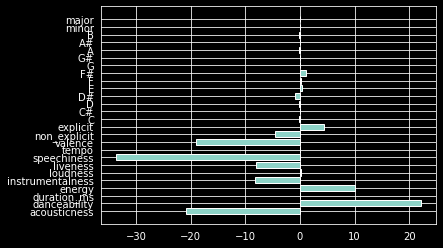

In [ ]:
plt.barh(features, regression.coef_[0])

### Arbol de Decisiones

In [ ]:
DT_Model = DecisionTreeRegressor()
DT_Model.fit(X_train, y_train)
DT_Predict = DT_Model.predict(X_valid)
DT_Model_Accuracy_Entrenamiento = DT_Model.score(X_train, y_train)
DT_Model_Accuracy_Real = DT_Model.score(X_valid, y_valid)
DT_Model_Explained_Variance = explained_variance_score(y_valid,DT_Predict)
DT_Model_Max_Error = max_error(y_valid,DT_Predict)
DT_Model_Mean_Absolute_Error = mean_absolute_error(y_valid,DT_Predict)
DT_Model_Squared_Error = mean_squared_error(y_valid,DT_Predict)
DT_Model_Median_Absolute_Error = median_absolute_error(y_valid,DT_Predict)

In [ ]:
print("Train Score R^2:",DT_Model_Accuracy_Entrenamiento)
print("Test Score R^2: ",DT_Model_Accuracy_Real)
print("Explained Variance:", DT_Model_Explained_Variance)
print("Max Error:", DT_Model_Max_Error)
print("Mean Absolute Error:", DT_Model_Mean_Absolute_Error)
print("Mean Squared Error:", DT_Model_Squared_Error)
#print("Mean Squared Log Error:",mean_squared_log_error(y_valid,DT_Predict))
print("Median Absolute Error:", DT_Model_Median_Absolute_Error)

Train Score R^2: 0.9981001744588085
Test Score R^2:  0.535969085820782
Explained Variance: 0.5359691098322406
Max Error: 88.0
Mean Absolute Error: 8.257442836258233
Mean Squared Error: 222.4842903924812
Median Absolute Error: 1.0


In [ ]:
importancia = pd.DataFrame(zip(lista, DT_Model.feature_importances_), columns = ['Caracteristica', 'Importancia'])
importancia = importancia.sort_values(by = 'Importancia', ascending = False)
importancia

,Caracteristica,Importancia
0,acousticness,0.390633
7,speechiness,0.119355
5,loudness,0.097790
2,duration_ms,0.064409
9,valence,0.055603
1,danceability,0.050311
3,energy,0.045661
6,liveness,0.043481
4,instrumentalness,0.040194
8,tempo,0.039768


<BarContainer object of 26 artists>

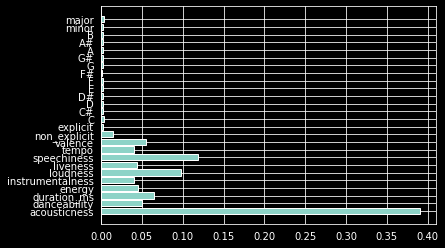

In [ ]:
plt.barh(features, DT_Model.feature_importances_)

In [ ]:
# Utilizando AdaBoost para aumentar la precisión
ada = AdaBoostRegressor(base_estimator=DT_Model, n_estimators=50, 
                         learning_rate=1)
# Ajustando los datos
ada = ada.fit(X_train, y_train)
ada_Predict = ada.predict(X_valid)

In [ ]:
ada_Accuracy_Entrenamiento = ada.score(X_train, y_train)
ada_Accuracy_Real = ada.score(X_valid, y_valid)
ada_Explained_Variance = explained_variance_score(y_valid,ada_Predict)
ada_Max_Error = max_error(y_valid,ada_Predict)
ada_Mean_Absolute_Error = mean_absolute_error(y_valid,ada_Predict)
ada_Squared_Error = mean_squared_error(y_valid,ada_Predict)
ada_Median_Absolute_Error = median_absolute_error(y_valid,ada_Predict)

In [ ]:
print("Train Score R^2:", ada_Accuracy_Entrenamiento)
print("Test Score R^2: ", ada_Accuracy_Real)
print("Explained Variance:", ada_Explained_Variance)
print("Max Error:", ada_Max_Error)
print("Mean Absolute Error:", ada_Mean_Absolute_Error)
print("Mean Squared Error:", ada_Squared_Error)
#print("Mean Squared Log Error:",mean_squared_log_error(y_valid,ada_Predict))
print("Median Absolute Error:", ada_Median_Absolute_Error)

Train Score R^2: 0.9958175601141603
Test Score R^2:  0.750586007511893
Explained Variance: 0.7509208778483987
Max Error: 76.0
Mean Absolute Error: 6.198017174918844
Mean Squared Error: 119.5840480387488
Median Absolute Error: 2.0


In [ ]:
importancia = pd.DataFrame(zip(lista, ada.feature_importances_), columns = ['Caracteristica', 'Importancia'])
importancia = importancia.sort_values(by = 'Importancia', ascending = False)
importancia

,Caracteristica,Importancia
0,acousticness,0.255416
5,loudness,0.101135
8,tempo,0.098949
7,speechiness,0.079066
6,liveness,0.072753
2,duration_ms,0.069444
9,valence,0.068970
1,danceability,0.064207
3,energy,0.055196
4,instrumentalness,0.052422


<BarContainer object of 26 artists>

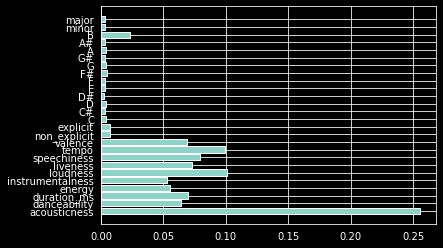

In [ ]:
plt.barh(features, ada.feature_importances_)

### Random Forest

In [ ]:
RFC_Model = RandomForestRegressor()
RFC_Model.fit(X_train, y_train)
RFC_Predict = RFC_Model.predict(X_valid)

In [ ]:
RFC_Model_Accuracy_Entrenamiento = RFC_Model.score(X_train, y_train)
RFC_Model_Accuracy_Real = RFC_Model.score(X_valid, y_valid)
RFC_Model_Explained_Variance = explained_variance_score(y_valid,RFC_Predict)
RFC_Model_Max_Error = max_error(y_valid,RFC_Predict)
RFC_Model_Mean_Absolute_Error = mean_absolute_error(y_valid,RFC_Predict)
RFC_Model_Squared_Error = mean_squared_error(y_valid,RFC_Predict)
RFC_Model_Median_Absolute_Error = median_absolute_error(y_valid,RFC_Predict)

In [ ]:
print("Train Score R^2:", RFC_Model_Accuracy_Entrenamiento)
print("Test Score R^2: ", RFC_Model_Accuracy_Real)
print("Explained Variance:", RFC_Model_Explained_Variance)
print("Max Error:", RFC_Model_Max_Error)
print("Mean Absolute Error:", RFC_Model_Mean_Absolute_Error)
print("Mean Squared Error:", RFC_Model_Squared_Error)
#print("Mean Squared Log Error:", mean_squared_log_error(y_valid,RFC_Predict))
print("Median Absolute Error:", RFC_Model_Median_Absolute_Error)

Train Score R^2: 0.9635419473865072
Test Score R^2:  0.7500262543716106
Explained Variance: 0.7500334177489523
Max Error: 64.94
Mean Absolute Error: 7.414691454690901
Mean Squared Error: 119.85242731350242
Median Absolute Error: 4.670000000000002


In [ ]:
importancia = pd.DataFrame(zip(lista, RFC_Model.feature_importances_), columns = ['Caracteristica', 'Importancia'])
importancia = importancia.sort_values(by = 'Importancia', ascending = False)
importancia

,Caracteristica,Importancia
0,acousticness,0.390008
7,speechiness,0.119269
5,loudness,0.096307
2,duration_ms,0.064008
9,valence,0.057328
1,danceability,0.050351
3,energy,0.044167
6,liveness,0.043886
4,instrumentalness,0.041420
8,tempo,0.039510


<BarContainer object of 26 artists>

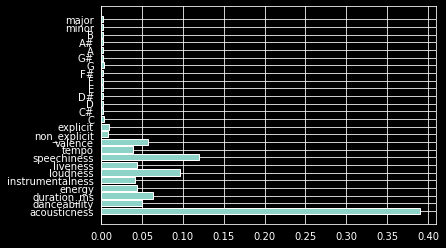

In [ ]:
plt.barh(features, RFC_Model.feature_importances_)

### KNN

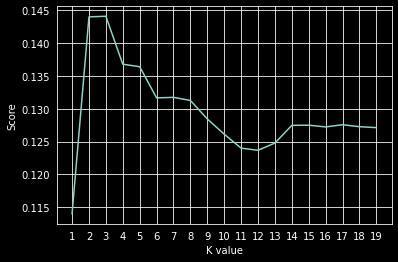

Maximum KNN Score is:  0.14410526560681536  with  3  neighbors


In [ ]:
knn_scoreList = []
best_vecino = 0
alto = 0
actual = 0
for i in range(1,20):
  vecinos = KNeighborsRegressor(n_neighbors = i)
  vecinos.fit(X_train, y_train)
  vecinos_predict = vecinos.predict(X_valid)
  actual = vecinos.score(X_valid, y_valid)
  knn_scoreList.append(actual)
  if(alto < actual):
    best_vecino = i
    alto = actual

plt.plot(range(1,20),knn_scoreList)
plt.xticks(np.arange(1,20,1))
plt.xlabel("K value")
plt.ylabel("Score")
plt.show()

best_knn = max(knn_scoreList)
print("Maximum KNN Score is: ", best_knn, " with ", best_vecino, " neighbors")

In [ ]:
KNN_Model = KNeighborsRegressor(n_neighbors = best_vecino)
KNN_Model.fit(X_train, y_train)
KNN_Predict = KNN_Model.predict(X_valid)
print(KNN_Model.score(X_train, y_train))
print(KNN_Model.score(X_valid, y_valid))

0.6248077731529644
0.14410526560681536


In [ ]:
KNN_Model_Accuracy_Entrenamiento = KNN_Model.score(X_train, y_train)
KNN_Model_Accuracy_Real = KNN_Model.score(X_valid, y_valid)
KNN_Model_Explained_Variance = explained_variance_score(y_valid,KNN_Predict)
KNN_Model_Max_Error = max_error(y_valid,KNN_Predict)
KNN_Model_Mean_Absolute_Error = mean_absolute_error(y_valid,KNN_Predict)
KNN_Model_Squared_Error = mean_squared_error(y_valid,KNN_Predict)
KNN_Model_Median_Absolute_Error = median_absolute_error(y_valid,KNN_Predict)

In [ ]:
print("Train Score R^2:", KNN_Model_Accuracy_Entrenamiento)
print("Test Score R^2: ", KNN_Model_Accuracy_Real)
print("Explained Variance:", KNN_Model_Explained_Variance)
print("Max Error:", KNN_Model_Max_Error)
print("Mean Absolute Error:", KNN_Model_Mean_Absolute_Error)
print("Mean Squared Error:", KNN_Model_Squared_Error)
#print("Mean Squared Log Error:", mean_squared_log_error(y_valid,KNN_Predict))
print("Median Absolute Error:", KNN_Model_Median_Absolute_Error)

Train Score R^2: 0.6248077731529644
Test Score R^2:  0.14410526560681536
Explained Variance: 0.14413396713111348
Max Error: 81.0
Mean Absolute Error: 15.46298675408674
Mean Squared Error: 410.36734151419836
Median Absolute Error: 12.333333333333334


### SVM - SVR

##### SVR: kernel poly

In [ ]:
svr_poly = SVR(kernel = 'poly')
svr_poly.fit(X_train, y_train)
svr_poly_Predict = svr_poly.predict(X_valid)

In [ ]:
svr_poly_Accuracy_Entrenamiento = svr_poly.score(X_train, y_train)
svr_poly_Accuracy_Real = svr_poly.score(X_valid, y_valid)
svr_poly_Explained_Variance = explained_variance_score(y_valid,svr_poly_Predict)
svr_poly_Max_Error = max_error(y_valid,svr_poly_Predict)
svr_poly_Mean_Absolute_Error = mean_absolute_error(y_valid,svr_poly_Predict)
svr_poly_Squared_Error = mean_squared_error(y_valid,svr_poly_Predict)
svr_poly_Median_Absolute_Error = median_absolute_error(y_valid,svr_poly_Predict)

In [ ]:
print("Train Score R^2:", svr_poly_Accuracy_Entrenamiento)
print("Test Score R^2: ", svr_poly_Accuracy_Real)
print("Explained Variance:", svr_poly_Explained_Variance)
print("Max Error:", svr_poly_Max_Error)
print("Mean Absolute Error:", svr_poly_Mean_Absolute_Error)
print("Mean Squared Error:", svr_poly_Squared_Error)
#print("Mean Squared Log Error:",mean_squared_log_error(y_valid,svr_poly_Predict))
print("Median Absolute Error:", svr_poly_Median_Absolute_Error)

Train Score R^2: 0.027431130549828483
Test Score R^2:  0.02987503338452213
Explained Variance: 0.032551950386868644
Max Error: 64.56627979997613
Mean Absolute Error: 18.0931297232198
Mean Squared Error: 465.1361756171989
Median Absolute Error: 16.72121323864972


#### SVR: kernel sigmoid

In [ ]:
svr_sigmoid = SVR(kernel = 'sigmoid', C=1.0)
svr_sigmoid.fit(X_train, y_train)
svr_sigmoid_Predict = svr_sigmoid.predict(X_valid)

In [ ]:
svr_sigmoid_Accuracy_Entrenamiento = svr_sigmoid.score(X_train, y_train)
svr_sigmoid_Accuracy_Real = svr_sigmoid.score(X_valid, y_valid)
svr_sigmoid_Explained_Variance = explained_variance_score(y_valid,svr_sigmoid_Predict)
svr_sigmoid_Max_Error = max_error(y_valid,svr_sigmoid_Predict)
svr_sigmoid_Mean_Absolute_Error = mean_absolute_error(y_valid,svr_sigmoid_Predict)
svr_sigmoid_Squared_Error = mean_squared_error(y_valid,svr_sigmoid_Predict)
svr_sigmoid_Median_Absolute_Error = median_absolute_error(y_valid,svr_sigmoid_Predict)

In [ ]:
print("Train Score R^2:", svr_sigmoid_Accuracy_Entrenamiento)
print("Test Score R^2: ", svr_sigmoid_Accuracy_Real)
print("Explained Variance:", svr_sigmoid_Explained_Variance)
print("Max Error:", svr_sigmoid_Max_Error)
print("Mean Absolute Error:", svr_sigmoid_Mean_Absolute_Error)
print("Mean Squared Error:", svr_sigmoid_Squared_Error)
#print("Mean Squared Log Error:",mean_squared_log_error(y_valid,svr_sigmoid_Predict))
print("Median Absolute Error:", svr_sigmoid_Median_Absolute_Error)

Train Score R^2: -2866.3793588829144
Test Score R^2:  -2868.2189881357103
Explained Variance: -2475.1852411195905
Max Error: 4969.790507417736
Mean Absolute Error: 795.958195732878
Mean Squared Error: 1375675.9109145484
Median Absolute Error: 482.62464058057685


#### SVR: kernel rbf

In [ ]:
svr_rbf = SVR(kernel = 'rbf')
svr_rbf.fit(X_train, y_train)
svr_rbf_Predict = svr_rbf.predict(X_valid)

In [ ]:
svr_rbf_Accuracy_Entrenamiento = svr_rbf.score(X_train, y_train)
svr_rbf_Accuracy_Real = svr_rbf.score(X_valid, y_valid)
svr_rbf_Explained_Variance = explained_variance_score(y_valid,svr_rbf_Predict)
svr_rbf_Max_Error = max_error(y_valid,svr_rbf_Predict)
svr_rbf_Mean_Absolute_Error = mean_absolute_error(y_valid,svr_rbf_Predict)
svr_rbf_Squared_Error = mean_squared_error(y_valid,svr_rbf_Predict)
svr_rbf_Median_Absolute_Error = median_absolute_error(y_valid,svr_rbf_Predict)

In [ ]:
print("Train Score R^2:", svr_rbf_Accuracy_Entrenamiento)
print("Test Score R^2: ", svr_rbf_Accuracy_Real)
print("Explained Variance:", svr_rbf_Explained_Variance)
print("Max Error:", svr_rbf_Max_Error)
print("Mean Absolute Error:", svr_rbf_Mean_Absolute_Error)
print("Mean Squared Error:", svr_rbf_Squared_Error)
#print("Mean Squared Log Error:",mean_squared_log_error(y_valid,svr_rbf_Predict))
print("Median Absolute Error:", svr_rbf_Median_Absolute_Error)

Train Score R^2: 0.08896626536143559
Test Score R^2:  0.09817898273526682
Explained Variance: 0.09868933802683133
Max Error: 68.82090316444285
Mean Absolute Error: 16.924411961167817
Mean Squared Error: 432.38715989874356
Median Absolute Error: 14.572723348014001


### Redes neuronales


In [ ]:
train_dataset = dataset.sample(frac=0.8,random_state=0)
test_dataset = dataset.drop(train_dataset.index)

train_labels = train_dataset.pop('popularity')
test_labels = test_dataset.pop('popularity')

train_dataset.head()

,valence,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,non_explicit,explicit,C,C#,D,D#,E,F,F#,G,G#,A,A#,B,minor,major
77101,0.731,0.941,0.527,173855,0.171,0.006260,0.3920,-19.583,0.0554,177.698,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
97980,0.172,0.594,0.147,289893,0.961,0.000018,0.9360,-4.868,0.2770,201.795,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
36631,0.179,0.016,0.518,325547,0.810,0.001300,0.1150,-6.445,0.0290,99.968,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1
148563,0.336,0.407,0.414,216095,0.439,0.923000,0.1030,-13.631,0.0308,135.285,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
51255,0.854,0.197,0.584,357347,0.949,0.001630,0.0738,-7.673,0.0465,99.061,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0


In [ ]:
# Se construye el modelo
model = keras.Sequential()

model.add(layers.Dense(64, activation = 'relu', input_shape=[len(train_dataset.keys())]))
model.add(layers.Dense(64, activation = 'relu'))
model.add(layers.Dense(1))

model.compile(loss=keras.losses.categorical_crossentropy, optimizer = keras.optimizers.RMSprop(0.001), metrics = ['mae', 'mse'])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 64)                1728      
_________________________________________________________________
dense_1 (Dense)              (None, 64)                4160      
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 65        
Total params: 5,953
Trainable params: 5,953
Non-trainable params: 0
_________________________________________________________________


In [ ]:
example_batch = train_dataset[:10]
example_result = model.predict(example_batch)
example_result

array([[ -8448.431 ],
       [-14095.197 ],
       [-15839.35  ],
       [-10508.409 ],
       [-17387.559 ],
       [ -8522.3545],
       [ -8934.763 ],
       [-12158.364 ],
       [-15273.983 ],
       [ -1545.0879]], dtype=float32)

In [ ]:
EPOCHS = 100

history = model.fit(
  train_dataset, train_labels,
  epochs=EPOCHS, validation_split = 0.2, verbose=1)


Epoch 1/100
3225/3225 [==============================] - 5s 1ms/step - loss: 3.7836e-06 - mae: 10288.2374 - mse: 116451076.9671 - val_loss: 3.7795e-06 - val_mae: 10281.1133 - val_mse: 116248992.0000
Epoch 2/100
3225/3225 [==============================] - 4s 1ms/step - loss: 3.8005e-06 - mae: 10295.2249 - mse: 116448733.3714 - val_loss: 3.7795e-06 - val_mae: 10281.1133 - val_mse: 116248992.0000
Epoch 3/100
3225/3225 [==============================] - 4s 1ms/step - loss: 3.7958e-06 - mae: 10290.8571 - mse: 116431505.4383 - val_loss: 3.7795e-06 - val_mae: 10281.1133 - val_mse: 116248992.0000
Epoch 4/100
3225/3225 [==============================] - 4s 1ms/step - loss: 3.8033e-06 - mae: 10295.3008 - mse: 116492931.5139 - val_loss: 3.7795e-06 - val_mae: 10281.1133 - val_mse: 116248992.0000
Epoch 5/100
3225/3225 [==============================] - 4s 1ms/step - loss: 3.7889e-06 - mae: 10298.7340 - mse: 116660319.3776 - val_loss: 3.7795e-06 - val_mae: 10281.1133 - val_mse: 116248992.0000
Epoch

In [ ]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,mae,mse,val_loss,val_mae,val_mse,epoch
95,0.000004,10299.142578,116632968.0,0.000004,10281.113281,116248992.0,95
96,0.000004,10299.140625,116632976.0,0.000004,10281.113281,116248992.0,96
97,0.000004,10299.151367,116632912.0,0.000004,10281.113281,116248992.0,97
98,0.000004,10299.148438,116633024.0,0.000004,10281.113281,116248992.0,98
99,0.000004,10299.132812,116633112.0,0.000004,10281.113281,116248992.0,99


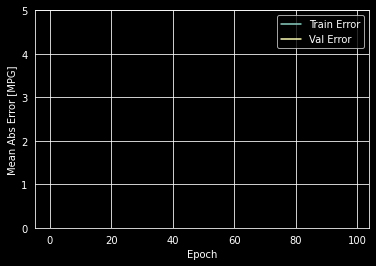

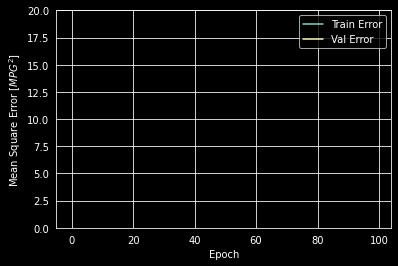

In [ ]:
def plot_history(history):
  hist = pd.DataFrame(history.history)
  hist['epoch'] = history.epoch

  plt.figure()
  plt.xlabel('Epoch')
  plt.ylabel('Mean Abs Error [MPG]')
  plt.plot(hist['epoch'], hist['mae'],
           label='Train Error')
  plt.plot(hist['epoch'], hist['val_mae'],
           label = 'Val Error')
  plt.ylim([0,5])
  plt.legend()

  plt.figure()
  plt.xlabel('Epoch')
  plt.ylabel('Mean Square Error [$MPG^2$]')
  plt.plot(hist['epoch'], hist['mse'],
           label='Train Error')
  plt.plot(hist['epoch'], hist['val_mse'],
           label = 'Val Error')
  plt.ylim([0,20])
  plt.legend()
  plt.show()


plot_history(history)

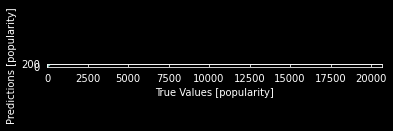

In [ ]:
test_predictions = model.predict(test_dataset).flatten()

plt.scatter(test_labels, test_predictions)
plt.xlabel('True Values [popularity]')
plt.ylabel('Predictions [popularity]')
plt.axis('equal')
plt.axis('square')
plt.xlim([0,plt.xlim()[1]])
plt.ylim([0,plt.ylim()[1]])
_ = plt.plot([-1000, 1000], [-1000, 1000])


In [ ]:
puntuacion = model.evaluate(test_dataset, test_labels, verbose=1)

print(puntuacion)

1008/1008 [==============================] - 1s 811us/step - loss: 3.8089e-06 - mae: 10287.3096 - mse: 116333664.0000
[3.8089226563897682e-06, 10287.3095703125, 116333664.0]


### Evaluación de modelos sin normalizar

In [ ]:
model_performance_accuracy = pd.DataFrame({'Model': ['Linear Regression',
                                                      'ada boost', 
                                                      'RandomForestRegressor', 
                                                      'KNeighborsRegressor',
                                                      'DecisionTreeRegressor',
                                                      'SVR poly',
                                                      'SVR rbf'],
                                            'Accuracy Real': [regression_Accuracy_Real,
                                                         DT_Model_Accuracy_Real,
                                                         ada_Accuracy_Real,
                                                         RFC_Model_Accuracy_Real,
                                                         KNN_Model_Accuracy_Real,
                                                         svr_poly_Accuracy_Real,
                                                         svr_rbf_Accuracy_Real],
                                           'Accuracy Entrenamiento': [regression_Accuracy_Entrenamiento,
                                                         DT_Model_Accuracy_Entrenamiento,
                                                         ada_Accuracy_Entrenamiento,
                                                         RFC_Model_Accuracy_Entrenamiento,
                                                         KNN_Model_Accuracy_Entrenamiento,
                                                         svr_poly_Accuracy_Entrenamiento,
                                                         svr_rbf_Accuracy_Entrenamiento],
                                           'Max Error': [regression_Max_Error,
                                                         DT_Model_Max_Error,
                                                         ada_Max_Error,
                                                         RFC_Model_Max_Error,
                                                         KNN_Model_Max_Error,
                                                         svr_poly_Max_Error,
                                                         svr_rbf_Max_Error],
                                           'Mean Absolute Error': [regression_Mean_Absolute_Error,
                                                         DT_Model_Mean_Absolute_Error,
                                                         ada_Mean_Absolute_Error,
                                                         RFC_Model_Mean_Absolute_Error,
                                                         KNN_Model_Mean_Absolute_Error,
                                                         svr_poly_Mean_Absolute_Error,
                                                         svr_rbf_Mean_Absolute_Error],
                                           'Squared Error': [regression_Squared_Error,
                                                         DT_Model_Squared_Error,
                                                         ada_Squared_Error,
                                                         RFC_Model_Squared_Error,
                                                         KNN_Model_Squared_Error,
                                                         svr_poly_Squared_Error,
                                                         svr_rbf_Squared_Error],
                                           'Median Absolute Error': [regression_Median_Absolute_Error,
                                                         DT_Model_Median_Absolute_Error,
                                                         ada_Median_Absolute_Error,
                                                         RFC_Model_Median_Absolute_Error,
                                                         KNN_Model_Median_Absolute_Error,
                                                         svr_poly_Median_Absolute_Error,
                                                         svr_rbf_Median_Absolute_Error]})

In [ ]:
model_performance_accuracy.sort_values(by = "Accuracy Real", ascending = False)

,Model,Accuracy Real,Accuracy Entrenamiento,Max Error,Mean Absolute Error,Squared Error,Median Absolute Error
2,RandomForestRegressor,0.750586,0.995818,76.000000,6.198017,119.584048,2.000000
3,KNeighborsRegressor,0.750026,0.963542,64.940000,7.414691,119.852427,4.670000
1,ada boost,0.535969,0.998100,88.000000,8.257443,222.484290,1.000000
0,Linear RegressionDecisionTreeRegressor,0.462138,0.458401,65.591592,12.922899,257.883133,11.338439
4,DecisionTreeRegressor,0.144105,0.624808,81.000000,15.462987,410.367342,12.333333
6,SVR rbf,0.098179,0.088966,68.820903,16.924412,432.387160,14.572723
5,SVR poly,0.029875,0.027431,64.566280,18.093130,465.136176,16.721213


## Modelo con normalización `MinMaxScaler`

In [ ]:
scaler = preprocessing.MinMaxScaler()
minmax_data = scaler.fit_transform(variables)
minmax_target = scaler.fit_transform(target)

In [ ]:
minmax_data

array([[0.30923695, 0.5262086 , 0.44973051, ..., 0.        , 0.        ,
        1.        ],
       [0.99698795, 0.66448708, 0.42972637, ..., 0.        , 0.        ,
        1.        ],
       [0.44076305, 0.82098832, 0.54653814, ..., 0.        , 0.        ,
        1.        ],
       ...,
       [0.14457831, 0.3547004 , 0.77408012, ..., 1.        , 0.        ,
        1.        ],
       [0.14859438, 0.54228749, 0.59587479, ..., 0.        , 0.        ,
        1.        ],
       [0.85140562, 0.36113195, 0.78071362, ..., 0.        , 0.        ,
        1.        ]])

### Mátriz de covarianza, vectores y valores propios

In [ ]:
cov_minmax = np.cov(minmax_data.T)
cov_minmax[:5]

array([[ 1.42043076e-01, -1.80596299e-02, -1.63924182e-02,
        -7.52695579e-02,  3.73024695e-02, -2.15439014e-02,
        -1.26363454e-03, -2.98314858e-03, -1.13386203e-02,
        -1.62195578e-02,  2.62409053e-02, -2.62409053e-02,
         1.28947033e-03, -4.83576433e-03, -2.34051869e-03,
         7.40754102e-03, -1.60127567e-03,  7.20294481e-03,
        -2.64488345e-03,  7.24493258e-05,  3.04156507e-03,
        -5.63568238e-03,  4.61170721e-03, -6.56755325e-03,
        -6.96846908e-03,  6.96846908e-03],
       [-1.80596299e-02,  3.43603087e-02, -1.12780711e-03,
         1.02317489e-02, -1.41466991e-02,  5.02819699e-03,
        -3.07551072e-03,  7.41861763e-03, -6.06970619e-04,
         2.60023557e-02, -1.26864874e-02,  1.26864874e-02,
        -2.16002650e-04,  1.64407178e-03, -1.14916405e-03,
        -1.61473289e-03, -8.75790214e-04, -7.95651845e-04,
         1.04232997e-03, -5.99223985e-05, -4.31109686e-04,
        -1.76983717e-04,  5.44833054e-04,  2.08812264e-03,
         4.08

In [ ]:
valores_minmax,vectores_minmax = np.linalg.eig(cov_minmax)

In [ ]:
valores_minmax

array([4.21315223e-01, 2.47743365e-01, 1.47987728e-01, 1.23796468e-01,
       1.15329540e-01, 1.05195554e-01, 2.90886425e-03, 1.35730306e-02,
       1.57593195e-02, 2.05408194e-02, 2.50168612e-02, 2.84799604e-02,
       3.40394077e-02, 9.76865026e-02, 4.32563739e-02, 8.57183553e-02,
       8.27806131e-02, 5.40587759e-02, 6.14481926e-02, 7.52236605e-02,
       7.18390537e-02, 6.97613133e-02, 6.62726741e-02, 6.95738560e-17,
       7.41080641e-17, 1.10819591e-17])

In [ ]:
vectores_minmax[:5]

array([[ 6.27372208e-02, -6.59048229e-01, -2.88296882e-01,
         2.90975910e-02, -1.25550944e-02, -3.28580079e-02,
         6.30371414e-02,  9.78823054e-02, -3.20451337e-01,
         2.84645919e-02, -1.12642773e-02,  4.02253412e-01,
        -2.18367530e-01,  1.66726643e-03,  1.30276004e-02,
         1.85644114e-01, -3.05693665e-01,  2.63523363e-03,
        -1.83929600e-02, -2.84376444e-02,  8.64876252e-02,
        -1.12468391e-01, -2.18951588e-02, -2.46178078e-16,
        -1.35327990e-16, -5.64915485e-18],
       [-2.38704658e-02,  1.55764011e-01, -1.37774745e-02,
        -2.28930233e-03,  2.72735495e-02, -1.10668244e-02,
         9.05969452e-02,  7.20999216e-01, -9.66287968e-02,
         9.04444053e-02, -3.42965288e-01, -1.57854954e-01,
         3.48644019e-01, -6.99357544e-02,  3.47114653e-02,
         1.56631961e-01, -2.41825247e-01,  2.91164707e-03,
        -1.69541336e-03, -9.90818426e-02, -8.32296194e-02,
        -2.42025572e-01,  2.08515924e-03, -4.58202850e-17,
         1.31

In [ ]:
explicada_minmax = []
for i in range(len(valores_minmax)):
    explicada_minmax.append(valores_minmax[i]/np.sum(valores_minmax))

In [ ]:
explicada_minmax

[0.20963755125164807,
 0.1232718630362621,
 0.07363556588678548,
 0.061598506047315794,
 0.057385541769453194,
 0.05234308446111842,
 0.00144738937832241,
 0.006753653189047982,
 0.00784150434945052,
 0.010220677658902316,
 0.01244786146938328,
 0.014171026422491826,
 0.016937289904134352,
 0.048606739275156116,
 0.021523457512077262,
 0.042651642112725,
 0.04118988369408857,
 0.026898504449452628,
 0.030575322039374863,
 0.037429703778258834,
 0.03574559496695474,
 0.03471175523776566,
 0.03297588210983053,
 3.461848042907462e-17,
 3.687460658894382e-17,
 5.514148630074401e-18]

In [ ]:
np.sum(explicada_minmax)

0.9999999999999999

### PCA con 11 componentes

Se puede observar mediante el PCA, que con 11 componentes se sobrepasa el 75% de la varianza explicada

In [ ]:
# Entrenamiento PCA con 11 componentes
pca = PCA(n_components=11)
pca.fit(minmax_data)

PCA(copy=True, iterated_power='auto', n_components=11, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

#### Transformada y gráfico `pairplot`

In [ ]:
# Transformar la información mediante PCA
transformada = pca.transform(minmax_data)

In [ ]:
variableTransformada = pd.DataFrame(transformada)

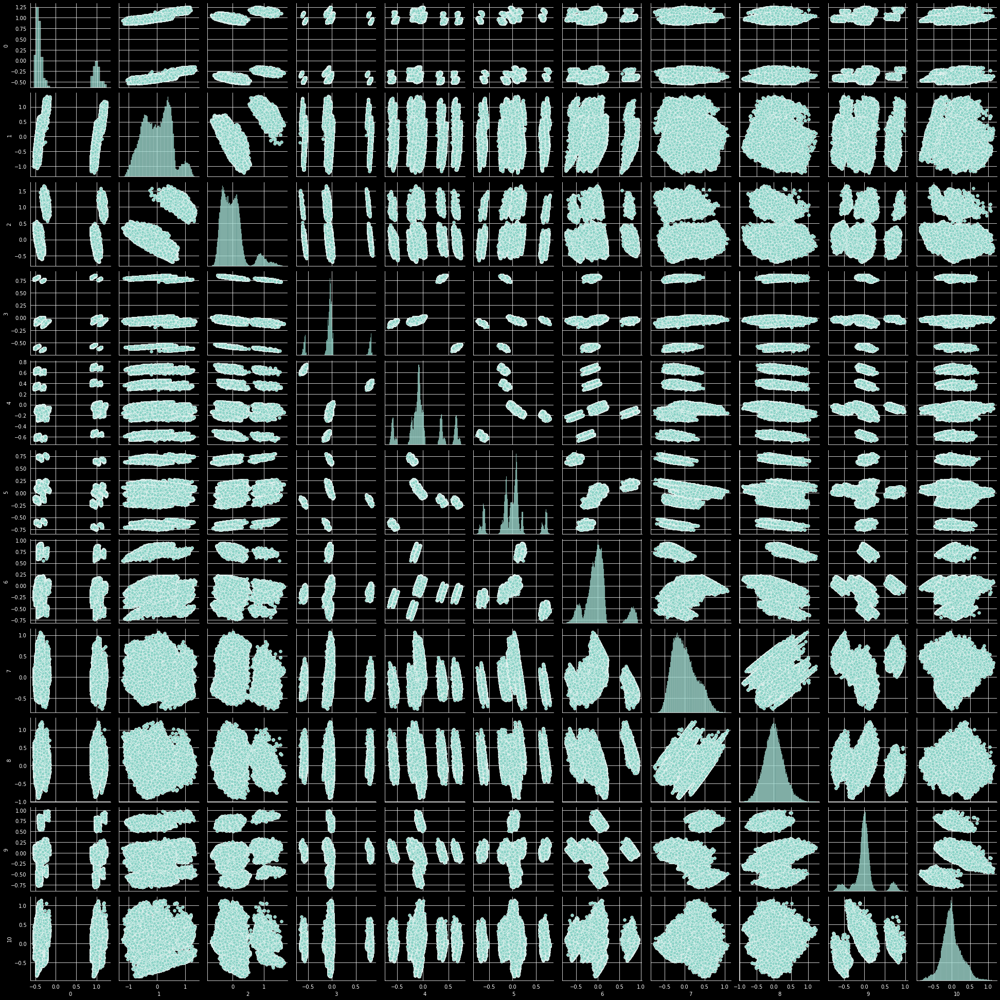

In [ ]:
sns.pairplot(variableTransformada)

In [ ]:
# Comparar las estructuras
print(minmax_data.shape)
print(transformada.shape)

(112861, 26)
(112861, 11)


#### Varianza | PCA Características

Text(0, 0.5, 'Varianza %')

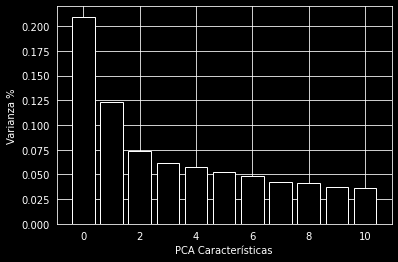

In [ ]:
features_minmax = range(pca.n_components)
plt.bar(features_minmax, pca.explained_variance_ratio_, color='black')
plt.xlabel('PCA Características')
plt.ylabel('Varianza %')

In [ ]:
pca.explained_variance_ratio_*100

array([20.96375513, 12.3271863 ,  7.36355658,  6.1598506 ,  5.73855418,
        5.23430844,  4.86067392,  4.26516414,  4.11898812,  3.74297036,
        3.57455911])

In [ ]:
minmax_listaPCA = pca.explained_variance_ratio_[:11].sum()
minmax_listaPCA

0.7834956687982229

In [ ]:
minmax_loading_scores = pd.Series(pca.components_[0], index=features)
sorted_minmax_loading_scores = minmax_loading_scores.abs().sort_values(ascending=False)
sorted_minmax_loading_scores = pd.DataFrame(sorted_minmax_loading_scores)
sorted_minmax_loading_scores

,0
major,0.695694
minor,0.695694
non_explicit,0.067485
explicit,0.067485
B,0.066873
acousticness,0.062737
C,0.058305
G,0.051733
E,0.042145
energy,0.037401


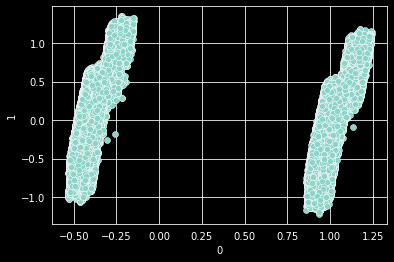

In [ ]:
# Gráfico en relación al objetivo
sns.scatterplot(variableTransformada[0],variableTransformada[1])

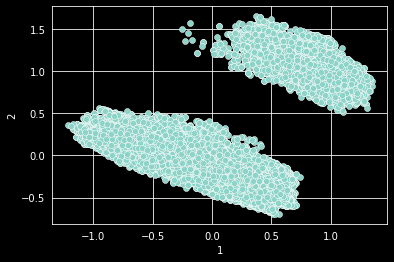

In [ ]:
# Gráfico en relación al objetivo
sns.scatterplot(variableTransformada[1],variableTransformada[2])

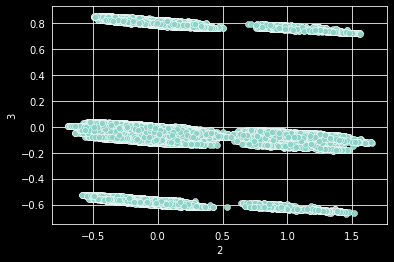

In [ ]:
# Gráfico en relación al objetivo
sns.scatterplot(variableTransformada[2],variableTransformada[3])

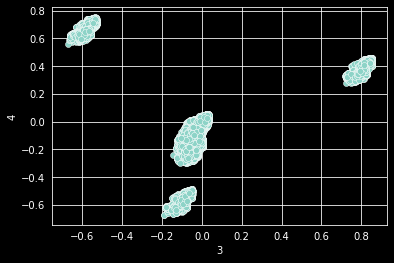

In [ ]:
sns.scatterplot(variableTransformada[3],variableTransformada[4])

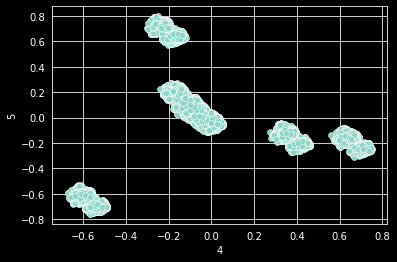

In [ ]:
sns.scatterplot(variableTransformada[4],variableTransformada[5])

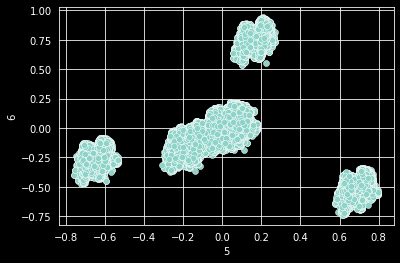

In [ ]:
sns.scatterplot(variableTransformada[5],variableTransformada[6])

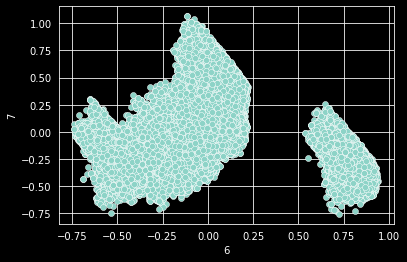

In [ ]:
sns.scatterplot(variableTransformada[6],variableTransformada[7])

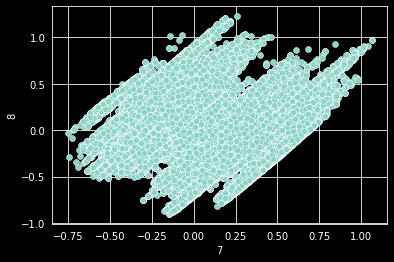

In [ ]:
sns.scatterplot(variableTransformada[7],variableTransformada[8])

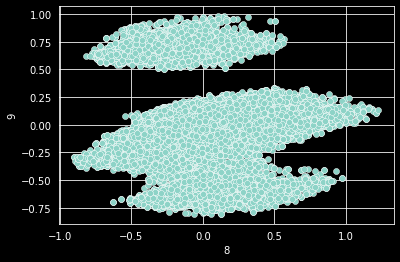

In [ ]:
sns.scatterplot(variableTransformada[8],variableTransformada[9])

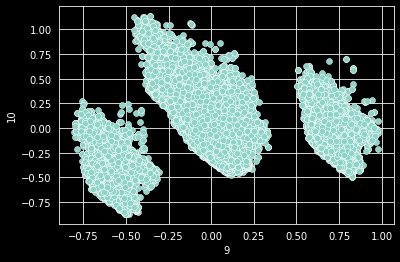

In [ ]:
sns.scatterplot(variableTransformada[9],variableTransformada[10])

In [ ]:
# Separando los datos en sets de entrenamiento y evaluación
minmax_X_train = minmax_data
minmax_y_train = minmax_target

minmax_X_train, minmax_X_valid, minmax_y_train, minmax_y_valid = train_test_split(minmax_X_train, minmax_y_train, test_size = 0.2)
print(len(minmax_X_train), len(minmax_X_valid), len(minmax_data))
minmax_X_train

90288 22573 112861


array([[0.94176707, 0.23142888, 0.37707297, ..., 0.        , 0.        ,
        1.        ],
       [0.99196787, 0.19712724, 0.26844942, ..., 0.        , 1.        ,
        0.        ],
       [0.84839357, 0.35577232, 0.29453255, ..., 0.        , 1.        ,
        0.        ],
       ...,
       [0.03273092, 0.47904384, 0.57293221, ..., 0.        , 0.        ,
        1.        ],
       [0.27911647, 0.44367028, 0.96493056, ..., 0.        , 0.        ,
        1.        ],
       [0.11044177, 0.78132704, 0.81139355, ..., 0.        , 0.        ,
        1.        ]])

### Regresión Lineal

In [ ]:
minmax_regression = LinearRegression()
minmax_regression.fit(minmax_X_train, minmax_y_train)
minmax_predict_regression = minmax_regression.predict(minmax_X_valid)

In [ ]:
minmax_regression_Accuracy_Entrenamiento = minmax_regression.score(minmax_X_train, minmax_y_train)
minmax_regression_Accuracy_Real = minmax_regression.score(minmax_X_valid, minmax_y_valid)
minmax_regression_Explained_Variance = explained_variance_score(minmax_y_valid,minmax_predict_regression)
minmax_regression_Max_Error = max_error(minmax_y_valid,minmax_predict_regression)
minmax_regression_Mean_Absolute_Error = mean_absolute_error(minmax_y_valid,minmax_predict_regression)
minmax_regression_Squared_Error = mean_squared_error(minmax_y_valid,minmax_predict_regression)
minmax_regression_Median_Absolute_Error = median_absolute_error(minmax_y_valid,minmax_predict_regression)

In [ ]:
print("Train Accuracy:", minmax_regression_Accuracy_Entrenamiento)
print("Test Accuracy:", minmax_regression_Accuracy_Real)
print("Explained Variance:", minmax_regression_Explained_Variance)
print("Max Error:", minmax_regression_Max_Error)
print("Mean Absolute Error:", minmax_regression_Mean_Absolute_Error)
print("Mean Squared Error:", minmax_regression_Squared_Error)
#print("Mean Squared Log Error:",mean_squared_log_error(minmax_y_valid,minmax_DT_Predict))
print("Median Absolute Error:", minmax_regression_Median_Absolute_Error)

Train Accuracy: 0.45795784139809415
Test Accuracy: 0.4638705818478496
Explained Variance: 0.4638950853986086
Max Error: 0.69122314453125
Mean Absolute Error: 0.13391168440829476
Mean Squared Error: 0.027867583932047375
Median Absolute Error: 0.11678059895833337


In [ ]:
importancia = pd.DataFrame(zip(lista, minmax_regression.coef_[0]), columns = ['Caracteristica', 'Importancia'])
importancia = importancia.sort_values(by = 'Importancia', ascending = False)
importancia

,Caracteristica,Importancia
18,F#,2.606997e+09
16,E,2.606997e+09
17,F,2.606997e+09
20,G#,2.606997e+09
13,C#,2.606997e+09
22,A#,2.606997e+09
14,D,2.606997e+09
21,A,2.606997e+09
23,B,2.606997e+09
12,C,2.606997e+09


<BarContainer object of 26 artists>

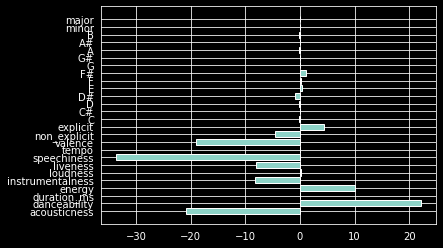

In [ ]:
plt.barh(features, regression.coef_[0])

### Arbol de Decisiones

In [ ]:
minmax_DT_Model = DecisionTreeRegressor()
minmax_DT_Model.fit(minmax_X_train, minmax_y_train)
minmax_DT_Predict = minmax_DT_Model.predict(minmax_X_valid)

In [ ]:
minmax_DT_Model_Accuracy_Entrenamiento = minmax_DT_Model.score(minmax_X_train, minmax_y_train)
minmax_DT_Model_Accuracy_Real = minmax_DT_Model.score(minmax_X_valid, minmax_y_valid)
minmax_DT_Model_Explained_Variance = explained_variance_score(minmax_y_valid,minmax_DT_Predict)
minmax_DT_Model_Max_Error = max_error(minmax_y_valid,minmax_DT_Predict)
minmax_DT_Model_Mean_Absolute_Error = mean_absolute_error(minmax_y_valid,minmax_DT_Predict)
minmax_DT_Model_Squared_Error = mean_squared_error(minmax_y_valid,minmax_DT_Predict)
minmax_DT_Model_Median_Absolute_Error = median_absolute_error(minmax_y_valid,minmax_DT_Predict)

In [ ]:
print("Train Score R^2:", minmax_DT_Model_Accuracy_Entrenamiento)
print("Test Score R^2: ", minmax_DT_Model_Accuracy_Real)
print("Explained Variance:", minmax_DT_Model_Explained_Variance)
print("Max Error:", minmax_DT_Model_Max_Error)
print("Mean Absolute Error:", minmax_DT_Model_Mean_Absolute_Error)
print("Mean Squared Error:", minmax_DT_Model_Squared_Error)
#print("Mean Squared Log Error:",mean_squared_log_error(minmax_y_valid,minmax_DT_Predict))
print("Median Absolute Error:", minmax_DT_Model_Median_Absolute_Error)

Train Score R^2: 0.9981116766838463
Test Score R^2:  0.5294370668977605
Explained Variance: 0.5295676382983758
Max Error: 0.9062499999999999
Mean Absolute Error: 0.0856746567925299
Mean Squared Error: 0.024201425814161476
Median Absolute Error: 0.010416666666666664


In [ ]:
importancia = pd.DataFrame(zip(lista, minmax_DT_Model.feature_importances_), columns = ['Caracteristica', 'Importancia'])
importancia = importancia.sort_values(by = 'Importancia', ascending = False)
importancia

,Caracteristica,Importancia
0,acousticness,0.391370
7,speechiness,0.118656
5,loudness,0.094154
2,duration_ms,0.064110
9,valence,0.059442
1,danceability,0.051112
6,liveness,0.045356
3,energy,0.042151
4,instrumentalness,0.040488
8,tempo,0.039949


<BarContainer object of 26 artists>

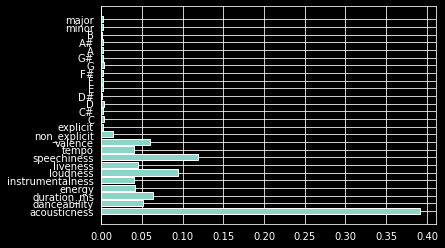

In [ ]:
plt.barh(features, minmax_DT_Model.feature_importances_)

In [ ]:
# Utilizando AdaBoost para aumentar la precisión
minmax_ada = AdaBoostRegressor(base_estimator=minmax_DT_Model, n_estimators=50, 
                         learning_rate=1)
# Ajustando los datos
minmax_ada = minmax_ada.fit(minmax_X_train, minmax_y_train)
minmax_ada_Predict = minmax_ada.predict(minmax_X_valid)

In [ ]:
minmax_ada_Accuracy_Entrenamiento = minmax_ada.score(minmax_X_train, minmax_y_train)
minmax_ada_Accuracy_Real = minmax_ada.score(minmax_X_valid, minmax_y_valid)
minmax_ada_Explained_Variance = explained_variance_score(minmax_y_valid,minmax_ada_Predict)
minmax_ada_Max_Error = max_error(minmax_y_valid,minmax_ada_Predict)
minmax_ada_Mean_Absolute_Error = mean_absolute_error(minmax_y_valid,minmax_ada_Predict)
minmax_ada_Squared_Error = mean_squared_error(minmax_y_valid,minmax_ada_Predict)
minmax_ada_Median_Absolute_Error = median_absolute_error(minmax_y_valid,minmax_ada_Predict)

In [ ]:
print("Train Score R^2:", minmax_ada_Accuracy_Entrenamiento)
print("Test Score R^2: ", minmax_ada_Accuracy_Real)
print("Explained Variance:", minmax_ada_Explained_Variance)
print("Max Error:", minmax_ada_Max_Error)
print("Mean Absolute Error:", minmax_ada_Mean_Absolute_Error)
print("Mean Squared Error:", minmax_ada_Squared_Error)
#print("Mean Squared Log Error:",mean_squared_log_error(y_valid,minmax_ada_Predict))
print("Median Absolute Error:", minmax_ada_Median_Absolute_Error)

Train Score R^2: 0.995705029222513
Test Score R^2:  0.7527744387519792
Explained Variance: 0.7528065692476849
Max Error: 0.9010416666666666
Mean Absolute Error: 0.0634713051209042
Mean Squared Error: 0.012715007194602881
Median Absolute Error: 0.01041666666666674


In [ ]:
importancia = pd.DataFrame(zip(lista, minmax_ada.feature_importances_), columns = ['Caracteristica', 'Importancia'])
importancia = importancia.sort_values(by = 'Importancia', ascending = False)
importancia

,Caracteristica,Importancia
3,energy,0.267023
0,acousticness,0.193684
5,loudness,0.080344
7,speechiness,0.069011
2,duration_ms,0.065140
9,valence,0.061914
1,danceability,0.057238
6,liveness,0.049013
8,tempo,0.048390
4,instrumentalness,0.045414


<BarContainer object of 26 artists>

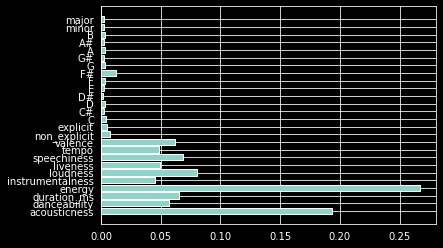

In [ ]:
plt.barh(features, minmax_ada.feature_importances_)

### Random Forest

In [ ]:
minmax_RFC_Model = RandomForestRegressor()
minmax_RFC_Model.fit(minmax_X_train, minmax_y_train)
minmax_RFC_Predict = minmax_RFC_Model.predict(minmax_X_valid)

In [ ]:
minmax_RFC_Model_Accuracy_Entrenamiento = minmax_RFC_Model.score(minmax_X_train, minmax_y_train)
minmax_RFC_Model_Accuracy_Real = minmax_RFC_Model.score(minmax_X_valid, minmax_y_valid)
minmax_RFC_Model_Explained_Variance = explained_variance_score(minmax_y_valid,minmax_RFC_Predict)
minmax_RFC_Model_Max_Error = max_error(minmax_y_valid,minmax_RFC_Predict)
minmax_RFC_Model_Mean_Absolute_Error = mean_absolute_error(minmax_y_valid,minmax_RFC_Predict)
minmax_RFC_Model_Squared_Error = mean_squared_error(minmax_y_valid,minmax_RFC_Predict)
minmax_RFC_Model_Median_Absolute_Error = median_absolute_error(minmax_y_valid,minmax_RFC_Predict)

In [ ]:
print("Train Score R^2:", minmax_RFC_Model_Accuracy_Entrenamiento)
print("Test Score R^2: ", minmax_RFC_Model_Accuracy_Real)
print("Explained Variance:", minmax_RFC_Model_Explained_Variance)
print("Max Error:", minmax_RFC_Model_Max_Error)
print("Mean Absolute Error:", minmax_RFC_Model_Mean_Absolute_Error)
print("Mean Squared Error:", minmax_RFC_Model_Squared_Error)
#print("Mean Squared Log Error:",mean_squared_log_error(minmax_y_valid,minmax_RFC_Predict))
print("Median Absolute Error:", minmax_RFC_Model_Median_Absolute_Error)

Train Score R^2: 0.9633652590373877
Test Score R^2:  0.7542517895292572
Explained Variance: 0.7543697557837348
Max Error: 0.6257291666666668
Mean Absolute Error: 0.0762441677397792
Mean Squared Error: 0.012773797985284831
Median Absolute Error: 0.04763541666666666


In [ ]:
importancia = pd.DataFrame(zip(lista, minmax_RFC_Model.feature_importances_), columns = ['Caracteristica', 'Importancia'])
importancia = importancia.sort_values(by = 'Importancia', ascending = False)
importancia

,Caracteristica,Importancia
0,acousticness,0.389602
7,speechiness,0.120968
5,loudness,0.095710
2,duration_ms,0.063650
9,valence,0.057201
1,danceability,0.050314
6,liveness,0.044335
3,energy,0.044052
4,instrumentalness,0.041281
8,tempo,0.039768


<BarContainer object of 26 artists>

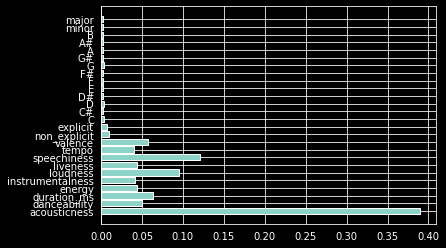

In [ ]:
plt.barh(features, minmax_RFC_Model.feature_importances_)

### KNN

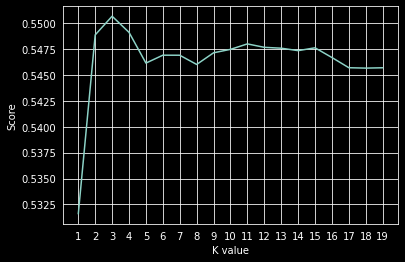

Maximum KNN Score is:  0.5506651552910354  with  3  neighbors


In [ ]:
minmax_knn_scoreList = []
minmax_best_vecino = 0
minmax_alto = 0
minmax_actual = 0
for i in range(1,20):
  minmax_vecinos = KNeighborsRegressor(n_neighbors = i)
  minmax_vecinos.fit(minmax_X_train, minmax_y_train)
  minmax_vecinos_predict = minmax_vecinos.predict(minmax_X_valid)
  minmax_actual = minmax_vecinos.score(minmax_X_valid, minmax_y_valid)
  minmax_knn_scoreList.append(minmax_actual)
  if(minmax_alto < minmax_actual):
    minmax_best_vecino = i
    minmax_alto = minmax_actual

plt.plot(range(1,20),minmax_knn_scoreList)
plt.xticks(np.arange(1,20,1))
plt.xlabel("K value")
plt.ylabel("Score")
plt.show()

minmax_best_knn = max(minmax_knn_scoreList)
print("Maximum KNN Score is: ", minmax_best_knn, " with ", minmax_best_vecino, " neighbors")

In [ ]:
minmax_KNN_Model = KNeighborsRegressor(n_neighbors = minmax_best_vecino)
minmax_KNN_Model.fit(minmax_X_train, minmax_y_train)
minmax_KNN_Predict = minmax_KNN_Model.predict(minmax_X_valid)

In [ ]:
minmax_KNN_Model_Accuracy_Entrenamiento = minmax_KNN_Model.score(minmax_X_train, minmax_y_train)
minmax_KNN_Model_Accuracy_Real = minmax_KNN_Model.score(minmax_X_valid, minmax_y_valid)
minmax_KNN_Model_Explained_Variance = explained_variance_score(minmax_y_valid,minmax_KNN_Predict)
minmax_KNN_Model_Max_Error = max_error(minmax_y_valid,minmax_KNN_Predict)
minmax_KNN_Model_Mean_Absolute_Error = mean_absolute_error(minmax_y_valid,minmax_KNN_Predict)
minmax_KNN_Model_Squared_Error = mean_squared_error(minmax_y_valid,minmax_KNN_Predict)
minmax_KNN_Model_Median_Absolute_Error = median_absolute_error(minmax_y_valid,minmax_KNN_Predict)

In [ ]:
print("Train Score R^2:", minmax_KNN_Model_Accuracy_Entrenamiento)
print("Test Score R^2: ", minmax_KNN_Model_Accuracy_Real)
print("Explained Variance:", minmax_KNN_Model_Explained_Variance)
print("Max Error:", minmax_KNN_Model_Max_Error)
print("Mean Absolute Error:", minmax_KNN_Model_Mean_Absolute_Error)
print("Mean Squared Error:", minmax_KNN_Model_Squared_Error)
#print("Mean Squared Log Error:",mean_squared_log_error(minmax_y_valid,minmax_KNN_Predict))
print("Median Absolute Error:", minmax_KNN_Model_Median_Absolute_Error)

Train Score R^2: 0.7972030124593967
Test Score R^2:  0.5506651552910354
Explained Variance: 0.5509500225378219
Max Error: 0.7638888888888888
Mean Absolute Error: 0.1102866256146724
Mean Squared Error: 0.0233560705205826
Median Absolute Error: 0.08333333333333331


### SVR - SVM

#### SVR: kernel poly

In [ ]:
minmax_svr_poly = SVR(kernel = 'poly')
minmax_svr_poly.fit(minmax_X_train, minmax_y_train)
minmax_svr_poly_Predict = minmax_svr_poly.predict(minmax_X_valid)

In [ ]:
minmax_svr_poly_Accuracy_Entrenamiento = minmax_svr_poly.score(minmax_X_train, minmax_y_train)
minmax_svr_poly_Accuracy_Real = minmax_svr_poly.score(minmax_X_valid, minmax_y_valid)
minmax_svr_poly_Explained_Variance = explained_variance_score(minmax_y_valid,minmax_svr_poly_Predict)
minmax_svr_poly_Max_Error = max_error(minmax_y_valid,minmax_svr_poly_Predict)
minmax_svr_poly_Mean_Absolute_Error = mean_absolute_error(minmax_y_valid,minmax_svr_poly_Predict)
minmax_svr_poly_Squared_Error = mean_squared_error(minmax_y_valid,minmax_svr_poly_Predict)
minmax_svr_poly_Median_Absolute_Error = median_absolute_error(minmax_y_valid,minmax_svr_poly_Predict)

In [ ]:
print("Train Score R^2:", minmax_svr_poly_Accuracy_Entrenamiento)
print("Test Score R^2: ", minmax_svr_poly_Accuracy_Real)
print("Explained Variance:", minmax_svr_poly_Explained_Variance)
print("Max Error:", minmax_svr_poly_Max_Error)
print("Mean Absolute Error:", minmax_svr_poly_Mean_Absolute_Error)
print("Mean Squared Error:", minmax_svr_poly_Squared_Error)
#contiene valores negativos, por lo tanto se omite mean squared log error
#print("Mean Squared Log Error:",mean_squared_log_error(minmax_y_valid,minmax_svr_poly_Predict))
print("Median Absolute Error:", minmax_svr_poly_Median_Absolute_Error)

Train Score R^2: 0.5775531463886499
Test Score R^2:  0.5729407956575167
Explained Variance: 0.5729438180258826
Max Error: 0.711333052810419
Mean Absolute Error: 0.11486629835204691
Mean Squared Error: 0.022198200318845514
Median Absolute Error: 0.09269477793561232


#### SVR: kernel sigmoid

In [ ]:
minmax_svr_sigmoid = SVR(kernel = 'sigmoid')
minmax_svr_sigmoid.fit(minmax_X_train, minmax_y_train)
minmax_svr_sigmoid_Predict = minmax_svr_sigmoid.predict(minmax_X_valid)

In [ ]:
minmax_svr_sigmoid_Accuracy_Entrenamiento = minmax_svr_sigmoid.score(minmax_X_train, minmax_y_train)
minmax_svr_sigmoid_Accuracy_Real = minmax_svr_sigmoid.score(minmax_X_valid, minmax_y_valid)
minmax_svr_sigmoid_Explained_Variance = explained_variance_score(minmax_y_valid,minmax_svr_sigmoid_Predict)
minmax_svr_sigmoid_Max_Error = max_error(minmax_y_valid,minmax_svr_sigmoid_Predict)
minmax_svr_sigmoid_Mean_Absolute_Error = mean_absolute_error(minmax_y_valid,minmax_svr_sigmoid_Predict)
minmax_svr_sigmoid_Squared_Error = mean_squared_error(minmax_y_valid,minmax_svr_sigmoid_Predict)
minmax_svr_sigmoid_Median_Absolute_Error = median_absolute_error(minmax_y_valid,minmax_svr_sigmoid_Predict)

In [ ]:
print("Train Score R^2:", minmax_svr_sigmoid_Accuracy_Entrenamiento)
print("Test Score R^2: ", minmax_svr_sigmoid_Accuracy_Real)
print("Explained Variance:", minmax_svr_sigmoid_Explained_Variance)
print("Max Error:", minmax_svr_sigmoid_Max_Error)
print("Mean Absolute Error:", minmax_svr_sigmoid_Mean_Absolute_Error)
print("Mean Squared Error:", minmax_svr_sigmoid_Squared_Error)
#contiene valores negativos, por lo tanto se omite mean squared log error
#print("Mean Squared Log Error:",mean_squared_log_error(minmax_y_valid,svr_sigmoid_Predict))
print("Median Absolute Error:", minmax_svr_sigmoid_Median_Absolute_Error)

Train Score R^2: -3210416.147567205
Test Score R^2:  -3188967.048788608
Explained Variance: -3169749.552565869
Max Error: 1851.117087508165
Mean Absolute Error: 220.59315812591612
Mean Squared Error: 165760.04178717427
Median Absolute Error: 68.64444616876499


#### SVR: kernel rbf

In [ ]:
minmax_svr_rbf = SVR(kernel = 'rbf')
minmax_svr_rbf.fit(minmax_X_train, minmax_y_train)
minmax_svr_rbf_Predict = minmax_svr_rbf.predict(minmax_X_valid)

In [ ]:
minmax_svr_rbf_Accuracy_Entrenamiento = minmax_svr_rbf.score(minmax_X_train, minmax_y_train)
minmax_svr_rbf_Accuracy_Real = minmax_svr_rbf.score(minmax_X_valid, minmax_y_valid)
minmax_svr_rbf_Explained_Variance = explained_variance_score(minmax_y_valid,minmax_svr_rbf_Predict)
minmax_svr_rbf_Max_Error = max_error(minmax_y_valid,minmax_svr_rbf_Predict)
minmax_svr_rbf_Mean_Absolute_Error = mean_absolute_error(minmax_y_valid,minmax_svr_rbf_Predict)
minmax_svr_rbf_Squared_Error = mean_squared_error(minmax_y_valid,minmax_svr_rbf_Predict)
minmax_svr_rbf_Median_Absolute_Error = median_absolute_error(minmax_y_valid,minmax_svr_rbf_Predict)

In [ ]:
print("Train Score R^2:",minmax_svr_rbf_Accuracy_Entrenamiento)
print("Test Score R^2: ",minmax_svr_rbf_Accuracy_Real)
print("Explained Variance:",minmax_svr_rbf_Explained_Variance)
print("Max Error:",minmax_svr_rbf_Max_Error)
print("Mean Absolute Error:",minmax_svr_rbf_Mean_Absolute_Error)
print("Mean Squared Error:",minmax_svr_rbf_Squared_Error)
#contiene valores negativos, por lo tanto se omite mean squared log error
#print("Mean Squared Log Error:",mean_squared_log_error(minmax_y_valid,minmax_svr_rbf_Predict))
print("Median Absolute Error:",minmax_svr_rbf_Median_Absolute_Error)

Train Score R^2: 0.5842863184255991
Test Score R^2:  0.5688602389416222
Explained Variance: 0.5689289524461525
Max Error: 0.6800816511016914
Mean Absolute Error: 0.11537959716117399
Mean Squared Error: 0.022336148653856823
Median Absolute Error: 0.09344405224057861


### Redes neuronales

In [ ]:
train_dataset = dataset.sample(frac=0.8,random_state=0)
test_dataset = dataset.drop(train_dataset.index)

train_labels = train_dataset.pop('popularity')
test_labels = test_dataset.pop('popularity')

train_dataset.head()

### Evaluación Modelos MinMaxScaler

In [ ]:
minmax_model_performance_accuracy = pd.DataFrame({'Model': ['MinMax Linear Regression',
                                                      'MinMax DecisionTreeRegressor',
                                                      'MinMax ada boost', 
                                                      'MinMax RandomForestRegressor', 
                                                      'MinMax KNeighborsRegressor',
                                                      'MinMax SVR poly',
                                                      'MinMax SVR rbf'],
                                            'Accuracy Real': [minmax_regression_Accuracy_Real,
                                                         minmax_DT_Model_Accuracy_Real,
                                                         minmax_ada_Accuracy_Real,
                                                         minmax_RFC_Model_Accuracy_Real,
                                                         minmax_KNN_Model_Accuracy_Real,
                                                         minmax_svr_poly_Accuracy_Real,
                                                         minmax_svr_rbf_Accuracy_Real],
                                           'Accuracy Entrenamiento': [minmax_regression_Accuracy_Entrenamiento,
                                                         minmax_DT_Model_Accuracy_Entrenamiento,
                                                         minmax_ada_Accuracy_Entrenamiento,
                                                         minmax_RFC_Model_Accuracy_Entrenamiento,
                                                         minmax_KNN_Model_Accuracy_Entrenamiento,
                                                         minmax_svr_poly_Accuracy_Entrenamiento,
                                                         minmax_svr_rbf_Accuracy_Entrenamiento],
                                           'Max Error': [minmax_regression_Max_Error,
                                                         minmax_DT_Model_Max_Error,
                                                         minmax_ada_Max_Error,
                                                         minmax_RFC_Model_Max_Error,
                                                         minmax_KNN_Model_Max_Error,
                                                         minmax_svr_poly_Max_Error,
                                                         minmax_svr_rbf_Max_Error],
                                           'Mean Absolute Error': [minmax_regression_Mean_Absolute_Error,
                                                         minmax_DT_Model_Mean_Absolute_Error,
                                                         minmax_ada_Mean_Absolute_Error,
                                                         minmax_RFC_Model_Mean_Absolute_Error,
                                                         minmax_KNN_Model_Mean_Absolute_Error,
                                                         minmax_svr_poly_Mean_Absolute_Error,
                                                         minmax_svr_rbf_Mean_Absolute_Error],
                                           'Squared Error': [minmax_regression_Squared_Error,
                                                         minmax_DT_Model_Squared_Error,
                                                         minmax_ada_Squared_Error,
                                                         minmax_RFC_Model_Squared_Error,
                                                         minmax_KNN_Model_Squared_Error,
                                                         minmax_svr_poly_Squared_Error,
                                                         minmax_svr_rbf_Squared_Error],
                                           'Median Absolute Error': [minmax_regression_Median_Absolute_Error,
                                                         minmax_DT_Model_Median_Absolute_Error,
                                                         minmax_ada_Median_Absolute_Error,
                                                         minmax_RFC_Model_Median_Absolute_Error,
                                                         minmax_KNN_Model_Median_Absolute_Error,
                                                         minmax_svr_poly_Median_Absolute_Error,
                                                         minmax_svr_rbf_Median_Absolute_Error]})

In [ ]:
minmax_model_performance_accuracy.sort_values(by = "Accuracy Real", ascending = False)

## Modelo con normalización `StandardScaler`

In [ ]:
standard_data = StandardScaler().fit_transform(variables)
standard_target = StandardScaler().fit_transform(target)
standard_data

array([[-0.50897155,  0.0131555 , -0.33124781, ..., -0.25985795,
        -0.6407012 ,  0.6407012 ],
       [ 1.31586143,  0.75913692, -0.44735525, ..., -0.25985795,
        -0.6407012 ,  0.6407012 ],
       [-0.15998889,  1.60342598,  0.23064004, ..., -0.25985795,
        -0.6407012 ,  0.6407012 ],
       ...,
       [-0.94586587, -0.91209278,  1.55133215, ...,  3.84825635,
        -0.6407012 ,  0.6407012 ],
       [-0.93520991,  0.09989753,  0.5169983 , ..., -0.25985795,
        -0.6407012 ,  0.6407012 ],
       [ 0.92958292, -0.87739597,  1.5898341 , ..., -0.25985795,
        -0.6407012 ,  0.6407012 ]])

### Mátriz de Covarianza, Vectores y Valores propios

In [ ]:
cov_standard = np.cov(standard_data.T)
cov_standard[:5]

array([[ 1.00000886e+00, -2.58508085e-01, -2.52449765e-01,
        -7.47240090e-01,  3.24418038e-01, -5.58023585e-01,
        -1.94874112e-02, -4.63974373e-02, -2.01875223e-01,
        -1.65322096e-01,  2.47134832e-01, -2.47134832e-01,
         1.03117877e-02, -4.81555988e-02, -1.99245080e-02,
         9.75838186e-02, -1.59847463e-02,  6.49929077e-02,
        -3.14656116e-02,  5.89461317e-04,  3.31233959e-02,
        -4.91404930e-02,  4.78806067e-02, -7.15876341e-02,
        -4.07048549e-02,  4.07048549e-02],
       [-2.58508085e-01,  1.00000886e+00, -3.53141111e-02,
         2.06524784e-01, -2.50152031e-01,  2.64802446e-01,
        -9.64342730e-02,  2.34597620e-01, -2.19721210e-02,
         5.38872592e-01, -2.42928264e-01,  2.42928264e-01,
        -3.51207027e-03,  3.32877118e-02, -1.98901945e-02,
        -4.32499829e-02, -1.77754759e-02, -1.45968942e-02,
         2.52125265e-02, -9.91269299e-04, -9.54568349e-03,
        -3.13767399e-03,  1.15011925e-02,  4.62777159e-02,
         4.84

In [ ]:
valores_standard, vectores_standard = np.linalg.eig(cov_standard)
valores_standard

array([ 3.32558457e+00,  2.31395902e+00,  2.02052061e+00,  1.21993044e-01,
        3.45079826e-01,  3.71727434e-01,  1.45468516e+00,  5.93744736e-01,
        7.53939765e-01,  8.16521392e-01,  9.45193592e-01,  9.77073191e-01,
        1.01902136e+00,  1.14260245e+00,  1.13440731e+00,  1.12257629e+00,
        1.11280254e+00,  1.09740702e+00,  1.08486814e+00,  1.04854375e+00,
        1.07272145e+00,  1.06026111e+00,  1.06499660e+00, -1.62557753e-16,
        7.45780386e-18,  1.01376088e-16])

In [ ]:
vectores_standard[:5]

array([[ 4.22152370e-01, -1.56249934e-01, -6.05695565e-02,
         4.05030009e-01, -3.15984945e-01, -5.24627678e-01,
        -1.95668953e-01, -4.58160519e-01,  1.17299496e-02,
        -3.85083707e-02,  1.78436850e-02,  2.74951850e-02,
         2.67706053e-02,  1.16953684e-02, -7.58331800e-04,
         3.29618168e-02,  1.34251508e-02,  9.29417866e-03,
         2.84386510e-02,  2.46295065e-02,  6.12373079e-03,
         4.73395244e-03, -2.54614389e-05,  3.08878614e-18,
         2.27375856e-18,  5.31917243e-18],
       [-2.92709070e-01, -4.22193393e-02, -9.09512073e-02,
         1.52201627e-01, -4.90188954e-01,  4.39497080e-01,
        -4.84294289e-01, -8.95409196e-02,  2.85537689e-01,
         8.57662741e-02,  1.45302620e-01, -1.10133468e-01,
        -5.79027645e-02, -8.65109282e-02, -1.59463911e-01,
        -7.51800462e-02, -9.68433760e-02, -8.57080874e-02,
        -2.69972904e-02, -8.31605863e-02, -9.02576320e-05,
        -1.37722476e-02,  1.28428187e-01, -3.22048413e-17,
         1.67

In [ ]:
explicada_standard = []
for i in range(len(valores_minmax)):
    explicada_standard.append(valores_standard[i]/np.sum(valores_standard))

explicada_standard

[0.12790596534135049,
 0.08899763531841705,
 0.077711642714285,
 0.004691998596796602,
 0.013272183390431649,
 0.014297082320905926,
 0.05594893360036857,
 0.02283613365104465,
 0.028997426345503678,
 0.031404390654576744,
 0.03635327756911849,
 0.03757940512749654,
 0.03919278199373965,
 0.04394585887647112,
 0.04363066394451057,
 0.043175628443948295,
 0.04279971842028654,
 0.042207588321706076,
 0.04172532794160745,
 0.040328248303380006,
 0.04125815192701876,
 0.04077891228714563,
 0.04096104490989055,
 -6.252165853920604e-18,
 2.86836068590394e-19,
 3.899045768388053e-18]

In [ ]:
np.sum(explicada_standard)

1.0

### PCA con 14 componentes

Se puede observar mediante el PCA, que con 14 componentes se sobrepasa el 75% de la varianza explicada

In [ ]:
# Entrenamiento PCA con 14 componentes
pca = PCA(n_components=14)
pca.fit(standard_data)

PCA(copy=True, iterated_power='auto', n_components=14, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

#### Transformada y Gráfico pairplot

In [ ]:
# Transformar la información mediante PCA
X_scaled_transformada = pca.transform(standard_data)

In [ ]:
standardTransformada = pd.DataFrame(X_scaled_transformada)

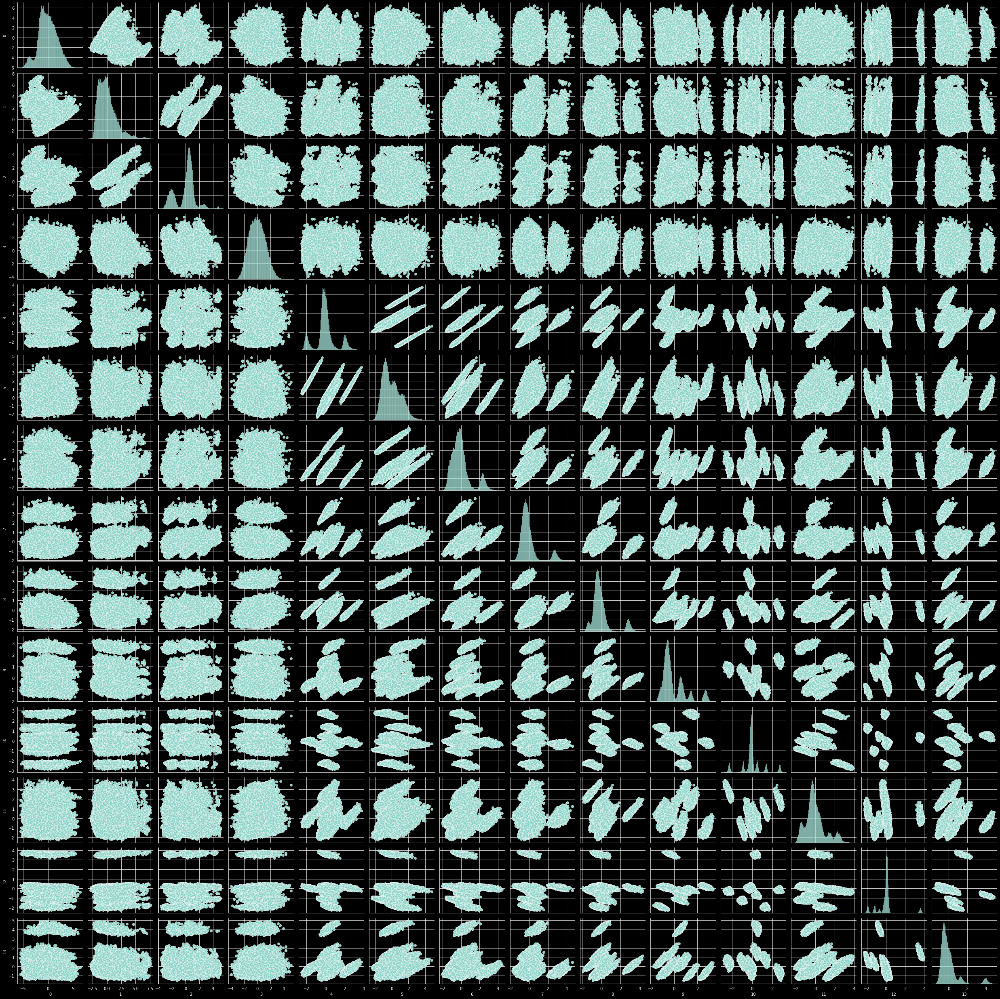

In [ ]:
sns.pairplot(standardTransformada)

In [ ]:
# Comparar las estructuras
print(standard_data.shape)
print(X_scaled_transformada.shape)

(112861, 26)
(112861, 14)


#### Varianza | PCA Características

In [ ]:
features_standard = range(pca.n_components)
plt.bar(features_standard, pca.explained_variance_ratio_, color='black')
plt.xlabel('PCA Características')
plt.ylabel('Varianza %')

Text(20.75, 0.5, 'Varianza %')

In [ ]:
pca.explained_variance_ratio_*100

array([12.79059653,  8.89976353,  7.77116427,  5.59489336,  4.39458589,
        4.36306639,  4.31756284,  4.27997184,  4.22075883,  4.17253279,
        4.12581519,  4.09610449,  4.07789123,  4.03282483])

In [ ]:
standard_listaPCA = pca.explained_variance_ratio_[:14].sum()
standard_listaPCA

0.7713753203503866

In [ ]:
standard_loading_scores = pd.Series(pca.components_[0], index=features)
sorted_standard_loading_scores = standard_loading_scores.abs().sort_values(ascending=False)
sorted_standard_loading_scores = pd.DataFrame(sorted_standard_loading_scores)
sorted_standard_loading_scores

,0
energy,0.426106
acousticness,0.422152
loudness,0.404464
explicit,0.303306
non_explicit,0.303306
danceability,0.292709
instrumentalness,0.273711
valence,0.227747
tempo,0.141858
speechiness,0.132006


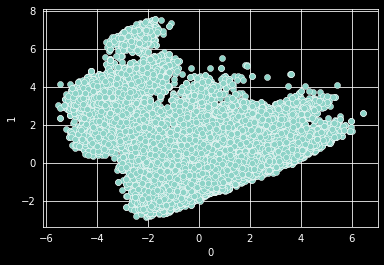

In [ ]:
# Gráfico en relación al objetivo
sns.scatterplot(standardTransformada[0],standardTransformada[1])

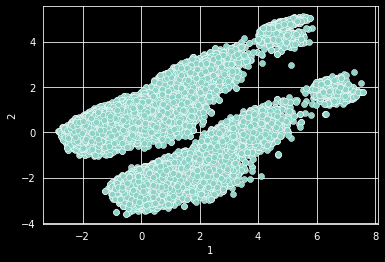

In [ ]:
# Gráfico en relación al objetivo
sns.scatterplot(standardTransformada[1],standardTransformada[2])

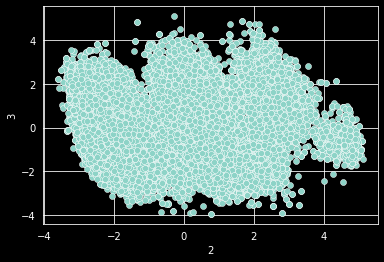

In [ ]:
# Gráfico en relación al objetivo
sns.scatterplot(standardTransformada[2],standardTransformada[3])

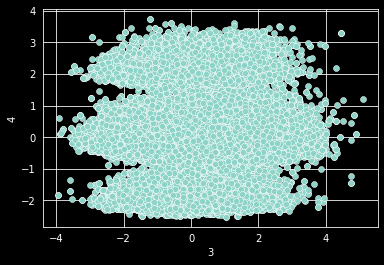

In [ ]:
# Gráfico en relación al objetivo
sns.scatterplot(standardTransformada[3],standardTransformada[4])

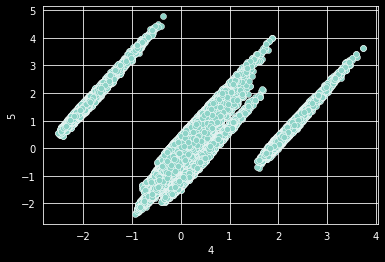

In [ ]:
# Gráfico en relación al objetivo
sns.scatterplot(standardTransformada[4],standardTransformada[5])

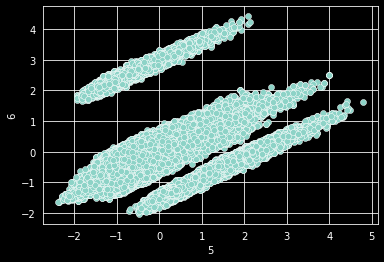

In [ ]:
# Gráfico en relación al objetivo
sns.scatterplot(standardTransformada[5],standardTransformada[6])

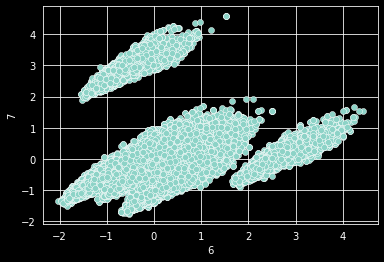

In [ ]:
sns.scatterplot(standardTransformada[6],standardTransformada[7])

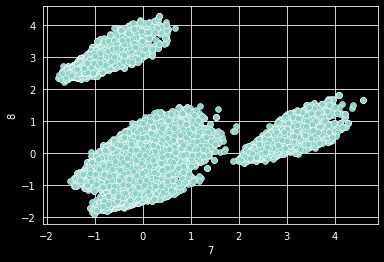

In [ ]:
sns.scatterplot(standardTransformada[7],standardTransformada[8])

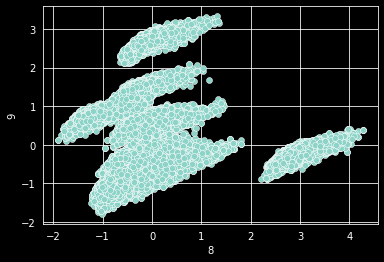

In [ ]:
sns.scatterplot(standardTransformada[8],standardTransformada[9])

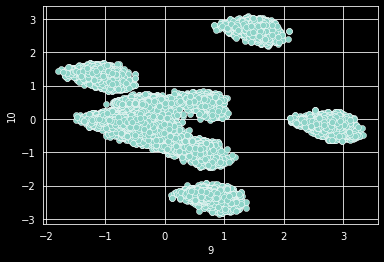

In [ ]:
sns.scatterplot(standardTransformada[9],standardTransformada[10])

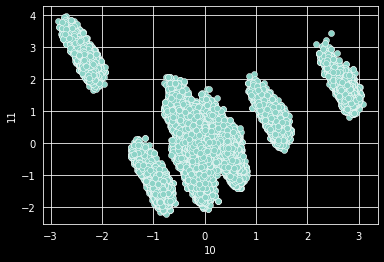

In [ ]:
sns.scatterplot(standardTransformada[10],standardTransformada[11])

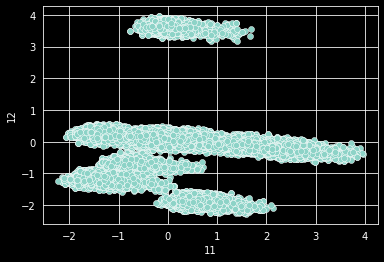

In [ ]:
sns.scatterplot(standardTransformada[11],standardTransformada[12])

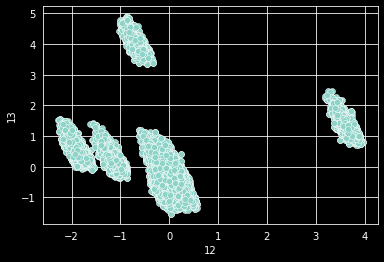

In [ ]:
sns.scatterplot(standardTransformada[12],standardTransformada[13])

In [ ]:
# Separando los datos en sets de entrenamiento y evaluación
standard_X_train = standard_data
standard_y_train = standard_target

standard_X_train, standard_X_valid, standard_y_train, standard_y_valid = train_test_split(standard_X_train, standard_y_train, test_size = 0.2)
print(len(standard_X_train), len(standard_X_valid), len(standard_data))
standard_X_train

90288 22573 112861


array([[ 1.25458967, -1.3111061 , -1.97159635, ..., -0.25985795,
        -0.6407012 ,  0.6407012 ],
       [-1.32863058,  0.27338158, -0.37035135, ...,  3.84825635,
         1.56078995, -1.56078995],
       [-1.27060622,  0.47577964,  0.42474401, ..., -0.25985795,
        -0.6407012 ,  0.6407012 ],
       ...,
       [-0.69012285,  0.56252167,  0.34385984, ..., -0.25985795,
        -0.6407012 ,  0.6407012 ],
       [-1.31048615,  0.94996938,  0.10851666, ..., -0.25985795,
         1.56078995, -1.56078995],
       [-1.3240725 , -0.20659096, -0.98397619, ...,  3.84825635,
        -0.6407012 ,  0.6407012 ]])

### Regresión Lineal

In [ ]:
standard_regression = LinearRegression()
standard_regression.fit(standard_X_train, standard_y_train)
standard_predict_regression = standard_regression.predict(standard_X_valid)

In [ ]:
standard_regression_Accuracy_Entrenamiento = standard_regression.score(standard_X_train, standard_y_train)
standard_regression_Accuracy_Real = standard_regression.score(standard_X_valid, standard_y_valid)
standard_regression_Explained_Variance = explained_variance_score(standard_y_valid,standard_predict_regression)
standard_regression_Max_Error = max_error(standard_y_valid,standard_predict_regression)
standard_regression_Mean_Absolute_Error = mean_absolute_error(standard_y_valid,standard_predict_regression)
standard_regression_Squared_Error = mean_squared_error(standard_y_valid,standard_predict_regression)
standard_regression_Median_Absolute_Error = median_absolute_error(standard_y_valid,standard_predict_regression)

In [ ]:
print("Train Accuracy:", standard_regression_Accuracy_Entrenamiento)
print("Test Accuracy:", standard_regression_Accuracy_Real)
print("Explained Variance:", standard_regression_Explained_Variance)
print("Max Error:", standard_regression_Max_Error)
print("Mean Absolute Error:", standard_regression_Mean_Absolute_Error)
print("Mean Squared Error:", standard_regression_Squared_Error)
#print("Mean Squared Log Error:",mean_squared_log_error(standard_y_valid,standard_DT_Predict))
print("Median Absolute Error:", standard_regression_Median_Absolute_Error)

Train Accuracy: 0.4588138838057917
Test Accuracy: 0.46040455616495013
Explained Variance: 0.4604375237281707
Max Error: 3.047448790715339
Mean Absolute Error: 0.5926522311476458
Mean Squared Error: 0.543915130594869
Median Absolute Error: 0.5210333239181911


In [ ]:
importancia = pd.DataFrame(zip(lista, standard_regression.coef_[0]), columns = ['Caracteristica', 'Importancia'])
importancia = importancia.sort_values(by = 'Importancia', ascending = False)
importancia

,Caracteristica,Importancia
11,explicit,6.620356e+10
10,non_explicit,6.620356e+10
1,danceability,1.736271e-01
3,energy,1.161361e-01
5,loudness,7.639031e-02
2,duration_ms,5.486671e-02
8,tempo,4.135177e-02
6,liveness,-6.101371e-02
4,instrumentalness,-1.144573e-01
9,valence,-2.246988e-01


<BarContainer object of 26 artists>

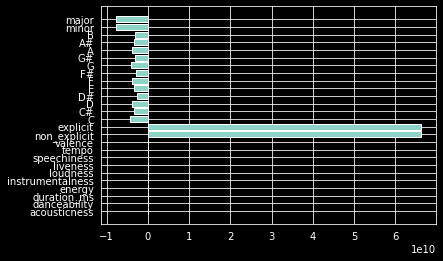

In [ ]:
plt.barh(features, standard_regression.coef_[0])

### Arbol de Decisiones

In [ ]:
standard_DT_Model = DecisionTreeRegressor()
standard_DT_Model.fit(standard_X_train, standard_y_train)
standard_DT_Predict = standard_DT_Model.predict(standard_X_valid)

In [ ]:
standard_DT_Model_Accuracy_Entrenamiento = standard_DT_Model.score(standard_X_train, standard_y_train)
standard_DT_Model_Accuracy_Real = standard_DT_Model.score(standard_X_valid, standard_y_valid)
standard_DT_Model_Explained_Variance = explained_variance_score(standard_y_valid,standard_DT_Predict)
standard_DT_Model_Max_Error = max_error(standard_y_valid,standard_DT_Predict)
standard_DT_Model_Mean_Absolute_Error = mean_absolute_error(standard_y_valid,standard_DT_Predict)
standard_DT_Model_Squared_Error = mean_squared_error(standard_y_valid,standard_DT_Predict)
standard_DT_Model_Median_Absolute_Error = median_absolute_error(standard_y_valid,standard_DT_Predict)

In [ ]:
print("Train Score R^2:", standard_DT_Model_Accuracy_Entrenamiento)
print("Test Score R^2: ", standard_DT_Model_Accuracy_Real)
print("Explained Variance:", standard_DT_Model_Explained_Variance)
print("Max Error:", standard_DT_Model_Max_Error)
print("Mean Absolute Error:", standard_DT_Model_Mean_Absolute_Error)
print("Mean Squared Error:", standard_DT_Model_Squared_Error)
#contiene valores negativos, por lo tanto se omite mean squared log error
#print("Mean Squared Log Error:",mean_squared_log_error(standard_y_valid,standard_DT_Predict))
print("Median Absolute Error:", standard_DT_Model_Median_Absolute_Error)

Train Score R^2: 0.9980240178836722
Test Score R^2:  0.5387169131597251
Explained Variance: 0.5388246956810103
Max Error: 3.883821749367419
Mean Absolute Error: 0.3736512568306483
Mean Squared Error: 0.46497585049407897
Median Absolute Error: 0.045692020580793136


In [ ]:
importancia = pd.DataFrame(zip(lista, standard_DT_Model.feature_importances_), columns = ['Caracteristica', 'Importancia'])
importancia = importancia.sort_values(by = 'Importancia', ascending = False)
importancia

,Caracteristica,Importancia
0,acousticness,0.389373
7,speechiness,0.122020
5,loudness,0.095636
2,duration_ms,0.064319
9,valence,0.057265
1,danceability,0.050483
6,liveness,0.044368
3,energy,0.043121
8,tempo,0.041263
4,instrumentalness,0.038705


<BarContainer object of 26 artists>

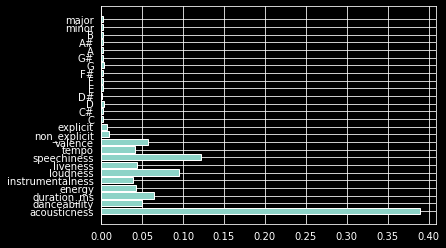

In [ ]:
plt.barh(features, standard_DT_Model.feature_importances_)

In [ ]:
# Utilizando AdaBoost para aumentar la precisión
standard_ada = AdaBoostRegressor(base_estimator=standard_DT_Model, n_estimators=50, 
                         learning_rate=1)
# Ajustando los datos
standard_ada = standard_ada.fit(standard_X_train, standard_y_train)
standard_ada_Predict = standard_ada.predict(standard_X_valid)

In [ ]:
standard_ada_Accuracy_Entrenamiento = standard_ada.score(standard_X_train, standard_y_train)
standard_ada_Accuracy_Real = standard_ada.score(standard_X_valid, standard_y_valid)
standard_ada_Explained_Variance = explained_variance_score(standard_y_valid,standard_ada_Predict)
standard_ada_Max_Error = max_error(standard_y_valid,standard_ada_Predict)
standard_ada_Mean_Absolute_Error = mean_absolute_error(standard_y_valid,standard_ada_Predict)
standard_ada_Squared_Error = mean_squared_error(standard_y_valid,standard_ada_Predict)
standard_ada_Median_Absolute_Error = median_absolute_error(standard_y_valid,standard_ada_Predict)

In [ ]:
print("Train Score R^2:", standard_ada_Accuracy_Entrenamiento)
print("Test Score R^2: ", standard_ada_Accuracy_Real)
print("Explained Variance:", standard_ada_Explained_Variance)
print("Max Error:", standard_ada_Max_Error)
print("Mean Absolute Error:", standard_ada_Mean_Absolute_Error)
print("Mean Squared Error:", standard_ada_Squared_Error)
#contiene valores negativos, por lo tanto se omite mean squared log error
#print("Mean Squared Log Error:",mean_squared_log_error(y_valid,standard_ada_Predict))
print("Median Absolute Error:", standard_ada_Median_Absolute_Error)

Train Score R^2: 0.9955992953772875
Test Score R^2:  0.7562735101703876
Explained Variance: 0.7562923605764482
Max Error: 3.883821749367419
Mean Absolute Error: 0.2776610926474107
Mean Squared Error: 0.24567762211429497
Median Absolute Error: 0.0761533676346553


In [ ]:
importancia = pd.DataFrame(zip(lista, standard_ada.feature_importances_), columns = ['Caracteristica', 'Importancia'])
importancia = importancia.sort_values(by = 'Importancia', ascending = False)
importancia

,Caracteristica,Importancia
3,energy,0.265029
0,acousticness,0.192705
5,loudness,0.080584
7,speechiness,0.072044
2,duration_ms,0.062852
9,valence,0.062485
1,danceability,0.056793
6,liveness,0.049138
8,tempo,0.046854
4,instrumentalness,0.046610


<BarContainer object of 26 artists>

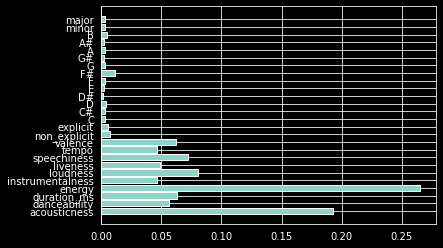

In [ ]:
plt.barh(features, standard_ada.feature_importances_)

### Random Forest

In [ ]:
standard_RFC_Model = RandomForestRegressor()
standard_RFC_Model.fit(standard_X_train, standard_y_train)
standard_RFC_Predict = standard_RFC_Model.predict(standard_X_valid)

In [ ]:
standard_RFC_Model_Accuracy_Entrenamiento =standard_RFC_Model.score(standard_X_train, standard_y_train)
standard_RFC_Model_Accuracy_Real = standard_RFC_Model.score(standard_X_valid, standard_y_valid)
standard_RFC_Model_Explained_Variance = explained_variance_score(standard_y_valid,standard_RFC_Predict)
standard_RFC_Model_Max_Error = max_error(standard_y_valid,standard_RFC_Predict)
standard_RFC_Model_Mean_Absolute_Error = mean_absolute_error(standard_y_valid,standard_RFC_Predict)
standard_RFC_Model_Squared_Error = mean_squared_error(standard_y_valid,standard_RFC_Predict)
standard_RFC_Model_Median_Absolute_Error = median_absolute_error(standard_y_valid,standard_RFC_Predict)

In [ ]:
print("Train Score R^2:", standard_RFC_Model_Accuracy_Entrenamiento)
print("Test Score R^2: ", standard_RFC_Model_Accuracy_Real)
print("Explained Variance:", standard_RFC_Model_Explained_Variance)
print("Max Error:", standard_RFC_Model_Max_Error)
print("Mean Absolute Error:", standard_RFC_Model_Mean_Absolute_Error)
print("Mean Squared Error:", standard_RFC_Model_Squared_Error)
#contiene valores negativos, por lo tanto se omite mean squared log error
#print("Mean Squared Log Error:",mean_squared_log_error(standard_y_valid,standard_RFC_Predict))
print("Median Absolute Error:", standard_RFC_Model_Median_Absolute_Error)

Train Score R^2: 0.9634781151517035
Test Score R^2:  0.7512464963743976
Explained Variance: 0.7513571693542407
Max Error: 3.067244418894537
Mean Absolute Error: 0.33590108620369136
Mean Squared Error: 0.25074487925404193
Median Absolute Error: 0.20698485323099325


In [ ]:
importancia = pd.DataFrame(zip(lista, standard_RFC_Model.feature_importances_), columns = ['Caracteristica', 'Importancia'])
importancia = importancia.sort_values(by = 'Importancia', ascending = False)
importancia

,Caracteristica,Importancia
0,acousticness,0.389635
7,speechiness,0.120929
5,loudness,0.095575
2,duration_ms,0.063914
9,valence,0.057631
1,danceability,0.049912
6,liveness,0.044604
3,energy,0.043855
4,instrumentalness,0.040947
8,tempo,0.039058


<BarContainer object of 26 artists>

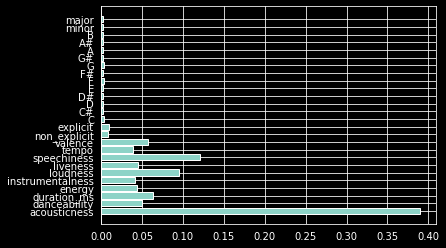

In [ ]:
plt.barh(features, standard_RFC_Model.feature_importances_)

### KNN

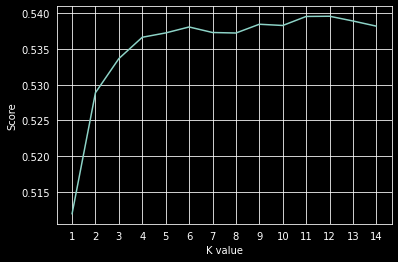

Maximum KNN Score is:  0.5396011325340797  with  12  neighbors


In [ ]:
standard_knn_scoreList = []
standard_best_vecino = 0
standard_alto = 0
standard_actual = 0
for i in range(1,15):
  standard_vecinos = KNeighborsRegressor(n_neighbors = i)
  standard_vecinos.fit(standard_X_train, standard_y_train)
  standard_vecinos_predict = standard_vecinos.predict(standard_X_valid)
  standard_actual = standard_vecinos.score(standard_X_valid, standard_y_valid)
  standard_knn_scoreList.append(standard_actual)
  if(standard_alto < standard_actual):
    standard_best_vecino = i
    standard_alto = standard_actual

plt.plot(range(1,15),standard_knn_scoreList)
plt.xticks(np.arange(1,15,1))
plt.xlabel("K value")
plt.ylabel("Score")
plt.show()

standard_best_knn = max(standard_knn_scoreList)
print("Maximum KNN Score is: ", standard_best_knn, " with ", standard_best_vecino, " neighbors")

In [ ]:
standard_KNN_Model = KNeighborsRegressor(n_neighbors= standard_best_vecino)
standard_KNN_Model.fit(standard_X_train, standard_y_train)
standard_KNN_Predict = standard_KNN_Model.predict(standard_X_valid)

In [ ]:
standard_KNN_Model_Accuracy_Entrenamiento = standard_KNN_Model.score(standard_X_train, standard_y_train)
standard_KNN_Model_Accuracy_Real = standard_KNN_Model.score(standard_X_valid, standard_y_valid)
standard_KNN_Model_Explained_Variance = explained_variance_score(standard_y_valid,standard_KNN_Predict)
standard_KNN_Model_Max_Error = max_error(standard_y_valid,standard_KNN_Predict)
standard_KNN_Model_Mean_Absolute_Error = mean_absolute_error(standard_y_valid,standard_KNN_Predict)
standard_KNN_Model_Squared_Error = mean_squared_error(standard_y_valid,standard_KNN_Predict)
standard_KNN_Model_Median_Absolute_Error = median_absolute_error(standard_y_valid,standard_KNN_Predict)

In [ ]:
print("Train Score R^2:", standard_KNN_Model_Accuracy_Entrenamiento)
print("Test Score R^2: ", standard_KNN_Model_Accuracy_Real)
print("Explained Variance:", standard_KNN_Model_Explained_Variance)
print("Max Error:", standard_KNN_Model_Max_Error)
print("Mean Absolute Error:", standard_KNN_Model_Mean_Absolute_Error)
print("Mean Squared Error:", standard_KNN_Model_Squared_Error)
#contiene valores negativos, por lo tanto se omite mean squared log error
#print("Mean Squared Log Error:",mean_squared_log_error(standard_y_valid,standard_KNN_Predict))
print("Median Absolute Error:", standard_KNN_Model_Median_Absolute_Error)

Train Score R^2: 0.6100173831118283
Test Score R^2:  0.5396011325340797
Explained Variance: 0.5401119321044718
Max Error: 3.0651730472948744
Mean Absolute Error: 0.5262412604964253
Mean Squared Error: 0.4640845525745518
Median Absolute Error: 0.43026652713580227


### SVR - SVM

#### SVR: kernel poly

In [ ]:
standard_svr_poly = SVR(kernel = 'poly')
standard_svr_poly.fit(standard_X_train, standard_y_train)
standard_svr_poly_Predict = standard_svr_poly.predict(standard_X_valid)

In [ ]:
standard_svr_poly_Accuracy_Entrenamiento = standard_svr_poly.score(standard_X_train, standard_y_train)
standard_svr_poly_Accuracy_Real = standard_svr_poly.score(standard_X_valid, standard_y_valid)
standard_svr_poly_Explained_Variance = explained_variance_score(standard_y_valid,standard_svr_poly_Predict)
standard_svr_poly_Max_Error = max_error(standard_y_valid,standard_svr_poly_Predict)
standard_svr_poly_Mean_Absolute_Error = mean_absolute_error(standard_y_valid,standard_svr_poly_Predict)
standard_svr_poly_Squared_Error = mean_squared_error(standard_y_valid,standard_svr_poly_Predict)
standard_svr_poly_Median_Absolute_Error = median_absolute_error(standard_y_valid,standard_svr_poly_Predict)

In [ ]:
print("Train Score R^2:", standard_svr_poly_Accuracy_Entrenamiento)
print("Test Score R^2: ", standard_svr_poly_Accuracy_Real)
print("Explained Variance:", standard_svr_poly_Explained_Variance)
print("Max Error:", standard_svr_poly_Max_Error)
print("Mean Absolute Error:", standard_svr_poly_Mean_Absolute_Error)
print("Mean Squared Error:", standard_svr_poly_Squared_Error)
#contiene valores negativos, por lo tanto se omite mean squared log error
#print("Mean Squared Log Error:",mean_squared_log_error(standard_y_valid,standard_svr_poly_Predict))
print("Median Absolute Error:", standard_svr_poly_Median_Absolute_Error)

Train Score R^2: 0.5359645993930797
Test Score R^2:  0.5204890373012405
Explained Variance: 0.5256190955704226
Max Error: 5.879860244806656
Mean Absolute Error: 0.5264778518386863
Mean Squared Error: 0.4833496481072877
Median Absolute Error: 0.41444317827766347


#### SVR: kernel sigmoid

In [ ]:
standard_svr_sigmoid = SVR(kernel = 'sigmoid')
standard_svr_sigmoid.fit(standard_X_train, standard_y_train)
standard_svr_sigmoid_Predict = standard_svr_sigmoid.predict(standard_X_valid)

In [ ]:
standard_svr_sigmoid_Accuracy_Entrenamiento = standard_svr_sigmoid.score(standard_X_train, standard_y_train)
standard_svr_sigmoid_Accuracy_Real = standard_svr_sigmoid.score(standard_X_valid, standard_y_valid)
standard_svr_sigmoid_Explained_Variance = explained_variance_score(standard_y_valid,standard_svr_sigmoid_Predict)
standard_svr_sigmoid_Max_Error = max_error(standard_y_valid,standard_svr_sigmoid_Predict)
standard_svr_sigmoid_Mean_Absolute_Error = mean_absolute_error(standard_y_valid,standard_svr_sigmoid_Predict)
standard_svr_sigmoid_Squared_Error = mean_squared_error(standard_y_valid,standard_svr_sigmoid_Predict)
standard_svr_sigmoid_Median_Absolute_Error = median_absolute_error(standard_y_valid,standard_svr_sigmoid_Predict)

In [ ]:
print("Train Score R^2:", standard_svr_sigmoid_Accuracy_Entrenamiento)
print("Test Score R^2: ", standard_svr_sigmoid_Accuracy_Real)
print("Explained Variance:", standard_svr_sigmoid_Explained_Variance)
print("Max Error:", standard_svr_sigmoid_Max_Error)
print("Mean Absolute Error:", standard_svr_sigmoid_Mean_Absolute_Error)
print("Mean Squared Error:", standard_svr_sigmoid_Squared_Error)
#contiene valores negativos, por lo tanto se omite mean squared log error
#print("Mean Squared Log Error:",mean_squared_log_error(standard_y_valid,svr_sigmoid_Predict))
print("Median Absolute Error:", standard_svr_sigmoid_Median_Absolute_Error)

#### SVR: kernel rbf

In [ ]:
standard_svr_rbf = SVR(kernel = 'rbf')
standard_svr_rbf.fit(standard_X_train, standard_y_train)
standard_svr_rbf_Predict = standard_svr_rbf.predict(standard_X_valid)

In [ ]:
standard_svr_rbf_Accuracy_Entrenamiento = standard_svr_rbf.score(standard_X_train, standard_y_train)
standard_svr_rbf_Accuracy_Real = standard_svr_rbf.score(standard_X_valid, standard_y_valid)
standard_svr_rbf_Explained_Variance = explained_variance_score(standard_y_valid,standard_svr_rbf_Predict)
standard_svr_rbf_Max_Error = max_error(standard_y_valid,standard_svr_rbf_Predict)
standard_svr_rbf_Mean_Absolute_Error = mean_absolute_error(standard_y_valid,standard_svr_rbf_Predict)
standard_svr_rbf_Squared_Error = mean_squared_error(standard_y_valid,standard_svr_rbf_Predict)
standard_svr_rbf_Median_Absolute_Error = median_absolute_error(standard_y_valid,standard_svr_rbf_Predict)

In [ ]:
print("Train Score R^2:", standard_svr_rbf_Accuracy_Entrenamiento)
print("Test Score R^2: ", standard_svr_rbf_Accuracy_Real)
print("Explained Variance:", standard_svr_rbf_Explained_Variance)
print("Max Error:", standard_svr_rbf_Max_Error)
print("Mean Absolute Error:", standard_svr_rbf_Mean_Absolute_Error)
print("Mean Squared Error:", standard_svr_rbf_Squared_Error)
#contiene valores negativos, por lo tanto se omite mean squared log error
#print("Mean Squared Log Error:",mean_squared_log_error(standard_y_valid,standard_svr_rbf_Predict))
print("Median Absolute Error:", standard_svr_rbf_Median_Absolute_Error)

Train Score R^2: 0.5909148993634594
Test Score R^2:  0.57086965393304
Explained Variance: 0.5741844572516193
Max Error: 3.432349004846473
Mean Absolute Error: 0.48682552871847956
Mean Squared Error: 0.43256571361003493
Median Absolute Error: 0.36889862625512926


### Evaluación Modelos StandardScaler

In [ ]:
standard_model_performance_accuracy = pd.DataFrame({'Model': ['Standard Linear Regression',
                                                      'Standard DecisionTreeRegressor',
                                                      'Standard ada boost', 
                                                      'Standard RandomForestRegressor', 
                                                      'Standard KNeighborsRegressor',
                                                      'Standard SVR poly',
                                                      'Standard SVR rbf'],
                                            'Accuracy Real': [standard_regression_Accuracy_Real,
                                                         standard_DT_Model_Accuracy_Real,
                                                         standard_ada_Accuracy_Real,
                                                         standard_RFC_Model_Accuracy_Real,
                                                         standard_KNN_Model_Accuracy_Real,
                                                         standard_svr_poly_Accuracy_Real,
                                                         standard_svr_rbf_Accuracy_Real],
                                           'Accuracy Entrenamiento': [standard_regression_Accuracy_Entrenamiento,
                                                         standard_DT_Model_Accuracy_Entrenamiento,
                                                         standard_ada_Accuracy_Entrenamiento,
                                                         standard_RFC_Model_Accuracy_Entrenamiento,
                                                         standard_KNN_Model_Accuracy_Entrenamiento,
                                                         standard_svr_poly_Accuracy_Entrenamiento,
                                                         standard_svr_rbf_Accuracy_Entrenamiento],
                                           'Max Error': [standard_regression_Max_Error,
                                                         standard_DT_Model_Max_Error,
                                                         standard_ada_Max_Error,
                                                         standard_RFC_Model_Max_Error,
                                                         standard_KNN_Model_Max_Error,
                                                         standard_svr_poly_Max_Error,
                                                         standard_svr_rbf_Max_Error],
                                           'Mean Absolute Error': [standard_regression_Mean_Absolute_Error,
                                                         standard_DT_Model_Mean_Absolute_Error,
                                                         standard_ada_Mean_Absolute_Error,
                                                         standard_RFC_Model_Mean_Absolute_Error,
                                                         standard_KNN_Model_Mean_Absolute_Error,
                                                         standard_svr_poly_Mean_Absolute_Error,
                                                         standard_svr_rbf_Mean_Absolute_Error],
                                           'Squared Error': [standard_regression_Squared_Error,
                                                         standard_DT_Model_Squared_Error,
                                                         standard_ada_Squared_Error,
                                                         standard_RFC_Model_Squared_Error,
                                                         standard_KNN_Model_Squared_Error,
                                                         standard_svr_poly_Squared_Error,
                                                         standard_svr_rbf_Squared_Error],
                                           'Median Absolute Error': [standard_regression_Median_Absolute_Error,
                                                         standard_DT_Model_Median_Absolute_Error,
                                                         standard_ada_Median_Absolute_Error,
                                                         standard_RFC_Model_Median_Absolute_Error,
                                                         standard_KNN_Model_Median_Absolute_Error,
                                                         standard_svr_poly_Median_Absolute_Error,
                                                         standard_svr_rbf_Median_Absolute_Error]})

In [ ]:
standard_model_performance_accuracy.sort_values(by = "Accuracy Real", ascending = False)

,Model,Accuracy Real,Accuracy Entrenamiento,Max Error,Mean Absolute Error,Squared Error,Median Absolute Error
2,Standard ada boost,0.756274,0.995599,3.883822,0.277661,0.245678,0.076153
3,Standard RandomForestRegressor,0.751246,0.963478,3.067244,0.335901,0.250745,0.206985
6,Standard SVR rbf,0.570870,0.590915,3.432349,0.486826,0.432566,0.368899
4,Standard KNeighborsRegressor,0.539601,0.610017,3.065173,0.526241,0.464085,0.430267
1,Standard DecisionTreeRegressor,0.538717,0.998024,3.883822,0.373651,0.464976,0.045692
5,Standard SVR poly,0.520489,0.535965,5.879860,0.526478,0.483350,0.414443
0,Standard Linear Regression,0.460405,0.458814,3.047449,0.592652,0.543915,0.521033


## Modelo con normalización `scale`

In [ ]:
scale_data = scale(variables)
scale_target = scale(target)
scale_data

array([[-0.50897155,  0.0131555 , -0.33124781, ..., -0.25985795,
        -0.6407012 ,  0.6407012 ],
       [ 1.31586143,  0.75913692, -0.44735525, ..., -0.25985795,
        -0.6407012 ,  0.6407012 ],
       [-0.15998889,  1.60342598,  0.23064004, ..., -0.25985795,
        -0.6407012 ,  0.6407012 ],
       ...,
       [-0.94586587, -0.91209278,  1.55133215, ...,  3.84825635,
        -0.6407012 ,  0.6407012 ],
       [-0.93520991,  0.09989753,  0.5169983 , ..., -0.25985795,
        -0.6407012 ,  0.6407012 ],
       [ 0.92958292, -0.87739597,  1.5898341 , ..., -0.25985795,
        -0.6407012 ,  0.6407012 ]])

### Mátriz de Covarianza, Vectores y Valores propios

In [ ]:
cov_scale = np.cov(scale_data.T)
cov_scale[:5]

array([[ 1.00000886e+00, -2.58508085e-01, -2.52449765e-01,
        -7.47240090e-01,  3.24418038e-01, -5.58023585e-01,
        -1.94874112e-02, -4.63974373e-02, -2.01875223e-01,
        -1.65322096e-01,  2.47134832e-01, -2.47134832e-01,
         1.03117877e-02, -4.81555988e-02, -1.99245080e-02,
         9.75838186e-02, -1.59847463e-02,  6.49929077e-02,
        -3.14656116e-02,  5.89461317e-04,  3.31233959e-02,
        -4.91404930e-02,  4.78806067e-02, -7.15876341e-02,
        -4.07048549e-02,  4.07048549e-02],
       [-2.58508085e-01,  1.00000886e+00, -3.53141111e-02,
         2.06524784e-01, -2.50152031e-01,  2.64802446e-01,
        -9.64342730e-02,  2.34597620e-01, -2.19721210e-02,
         5.38872592e-01, -2.42928264e-01,  2.42928264e-01,
        -3.51207027e-03,  3.32877118e-02, -1.98901945e-02,
        -4.32499829e-02, -1.77754759e-02, -1.45968942e-02,
         2.52125265e-02, -9.91269299e-04, -9.54568349e-03,
        -3.13767399e-03,  1.15011925e-02,  4.62777159e-02,
         4.84

In [ ]:
valores_scale, vectores_scale = np.linalg.eig(cov_scale)
valores_scale

array([ 3.32558457e+00,  2.31395902e+00,  2.02052061e+00,  1.21993044e-01,
        3.45079826e-01,  3.71727434e-01,  1.45468516e+00,  5.93744736e-01,
        7.53939765e-01,  8.16521392e-01,  9.45193592e-01,  9.77073191e-01,
        1.01902136e+00,  1.14260245e+00,  1.13440731e+00,  1.12257629e+00,
        1.11280254e+00,  1.09740702e+00,  1.08486814e+00,  1.04854375e+00,
        1.07272145e+00,  1.06026111e+00,  1.06499660e+00, -1.62557753e-16,
        7.45780386e-18,  1.01376088e-16])

In [ ]:
vectores_scale[:5]

array([[ 4.22152370e-01, -1.56249934e-01, -6.05695565e-02,
         4.05030009e-01, -3.15984945e-01, -5.24627678e-01,
        -1.95668953e-01, -4.58160519e-01,  1.17299496e-02,
        -3.85083707e-02,  1.78436850e-02,  2.74951850e-02,
         2.67706053e-02,  1.16953684e-02, -7.58331800e-04,
         3.29618168e-02,  1.34251508e-02,  9.29417866e-03,
         2.84386510e-02,  2.46295065e-02,  6.12373079e-03,
         4.73395244e-03, -2.54614389e-05,  3.08878614e-18,
         2.27375856e-18,  5.31917243e-18],
       [-2.92709070e-01, -4.22193393e-02, -9.09512073e-02,
         1.52201627e-01, -4.90188954e-01,  4.39497080e-01,
        -4.84294289e-01, -8.95409196e-02,  2.85537689e-01,
         8.57662741e-02,  1.45302620e-01, -1.10133468e-01,
        -5.79027645e-02, -8.65109282e-02, -1.59463911e-01,
        -7.51800462e-02, -9.68433760e-02, -8.57080874e-02,
        -2.69972904e-02, -8.31605863e-02, -9.02576320e-05,
        -1.37722476e-02,  1.28428187e-01, -3.22048413e-17,
         1.67

In [ ]:
explicada_scale = []
for i in range(len(valores_scale)):
    explicada_scale.append(valores_scale[i]/np.sum(valores_scale))

explicada_scale

[0.12790596534135049,
 0.08899763531841705,
 0.077711642714285,
 0.004691998596796602,
 0.013272183390431649,
 0.014297082320905926,
 0.05594893360036857,
 0.02283613365104465,
 0.028997426345503678,
 0.031404390654576744,
 0.03635327756911849,
 0.03757940512749654,
 0.03919278199373965,
 0.04394585887647112,
 0.04363066394451057,
 0.043175628443948295,
 0.04279971842028654,
 0.042207588321706076,
 0.04172532794160745,
 0.040328248303380006,
 0.04125815192701876,
 0.04077891228714563,
 0.04096104490989055,
 -6.252165853920604e-18,
 2.86836068590394e-19,
 3.899045768388053e-18]

In [ ]:
np.sum(explicada_scale)

1.0

### PCA con 14 componentes

In [ ]:
# Entrenamiento PCA con 14 componentes
pca = PCA(n_components=14)
pca.fit(scale_data)

PCA(copy=True, iterated_power='auto', n_components=14, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

#### Transformada y Gráfico `pairplot`

In [ ]:
# Transformar la información mediante PCA
scale_transformada = pca.transform(scale_data)

In [ ]:
scaleTransformada = pd.DataFrame(scale_transformada)

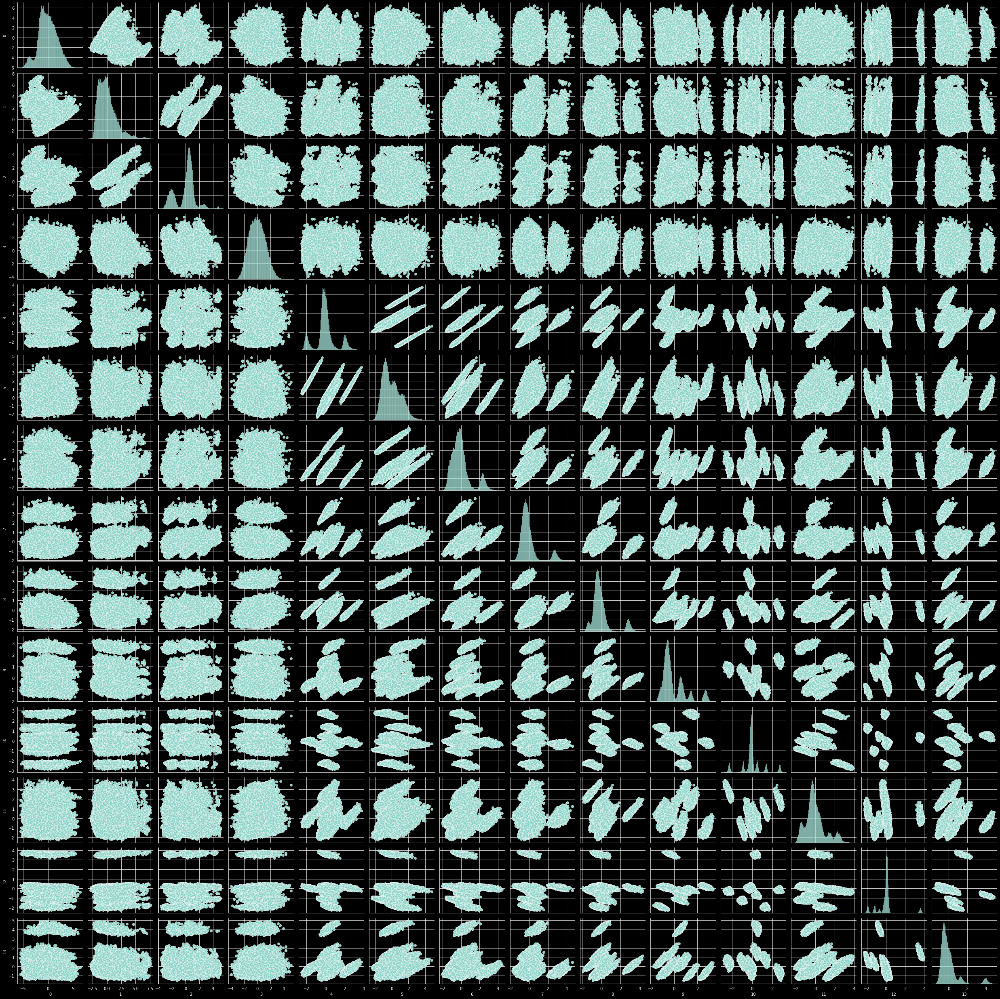

In [ ]:
sns.pairplot(scaleTransformada)

In [ ]:
# Comparar las estructuras
print(scale_data.shape)
print(scale_transformada.shape)

(112861, 26)
(112861, 14)


#### Varianza | PCA Características

In [ ]:
features_scale = range(pca.n_components)
plt.bar(features_scale, pca.explained_variance_ratio_, color='black')
plt.xlabel('PCA Características')
plt.ylabel('Varianza %')

Text(0, 0.5, 'Varianza %')

In [ ]:
pca.explained_variance_ratio_*100

array([12.79059653,  8.89976353,  7.77116427,  5.59489336,  4.39458589,
        4.36306639,  4.31756284,  4.27997184,  4.22075883,  4.17253279,
        4.12581519,  4.09610449,  4.07789123,  4.03282483])

In [ ]:
scale_listaPCA = pca.explained_variance_ratio_[:14].sum()
scale_listaPCA

0.7713753203503864

In [ ]:
scale_loading_scores = pd.Series(pca.components_[0], index=features)
sorted_scale_loading_scores = scale_loading_scores.abs().sort_values(ascending=False)
sorted_scale_loading_scores = pd.DataFrame(sorted_scale_loading_scores)
sorted_scale_loading_scores

,0
energy,0.426106
acousticness,0.422152
loudness,0.404464
non_explicit,0.303306
explicit,0.303306
danceability,0.292709
instrumentalness,0.273711
valence,0.227747
tempo,0.141858
speechiness,0.132006


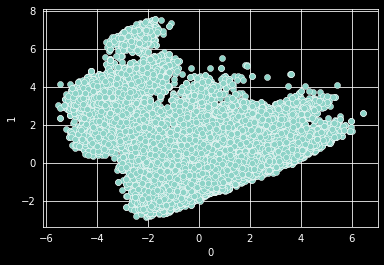

In [ ]:
# Gráfico en relación al objetivo
sns.scatterplot(scaleTransformada[0],scaleTransformada[1])

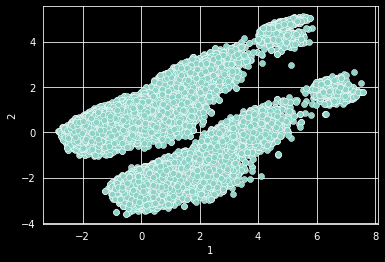

In [ ]:
# Gráfico en relación al objetivo
sns.scatterplot(scaleTransformada[1],scaleTransformada[2])

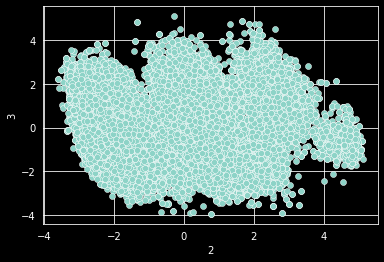

In [ ]:
# Gráfico en relación al objetivo
sns.scatterplot(scaleTransformada[2],scaleTransformada[3])

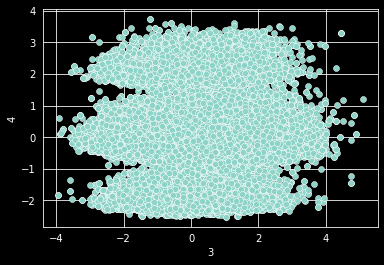

In [ ]:
# Gráfico en relación al objetivo
sns.scatterplot(scaleTransformada[3],scaleTransformada[4])

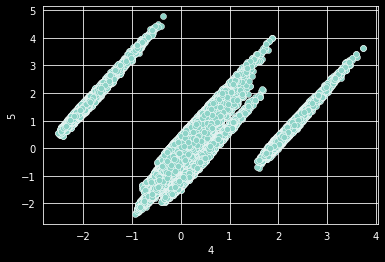

In [ ]:
# Gráfico en relación al objetivo
sns.scatterplot(scaleTransformada[4],scaleTransformada[5])

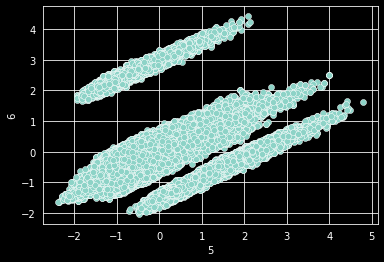

In [ ]:
# Gráfico en relación al objetivo
sns.scatterplot(scaleTransformada[5],scaleTransformada[6])

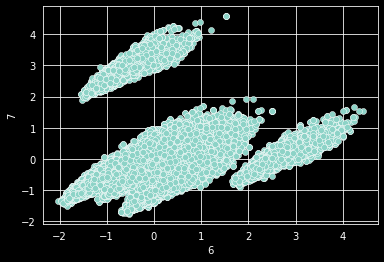

In [ ]:
sns.scatterplot(scaleTransformada[6],scaleTransformada[7])

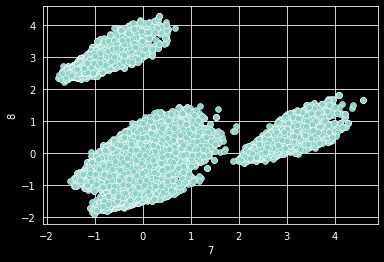

In [ ]:
sns.scatterplot(scaleTransformada[7],scaleTransformada[8])

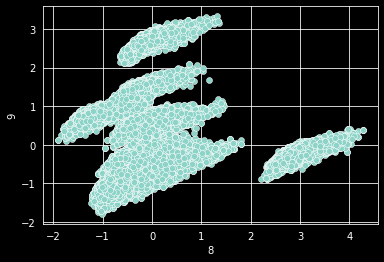

In [ ]:
sns.scatterplot(scaleTransformada[8],scaleTransformada[9])

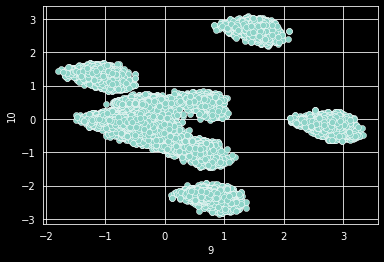

In [ ]:
sns.scatterplot(scaleTransformada[9],scaleTransformada[10])

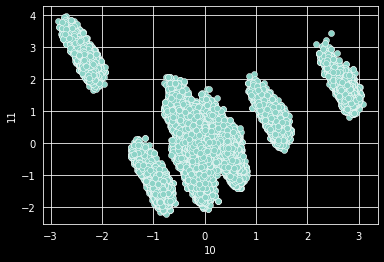

In [ ]:
sns.scatterplot(scaleTransformada[10],scaleTransformada[11])

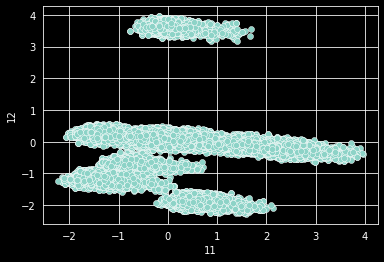

In [ ]:
sns.scatterplot(scaleTransformada[11],scaleTransformada[12])

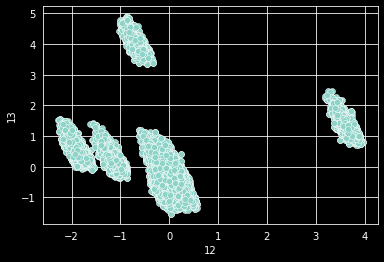

In [ ]:
sns.scatterplot(scaleTransformada[12],scaleTransformada[13])

In [ ]:
# Separando los datos en sets de entrenamiento y evaluación
scale_X_train = scale_data
scale_y_train = scale_target

scale_X_train, scale_X_valid, scale_y_train, scale_y_valid = train_test_split(scale_X_train, scale_y_train, test_size = 0.2)
print(len(scale_X_train), len(scale_X_valid), len(scale_data))
scale_X_train

90288 22573 112861


array([[ 1.32118941, -0.91787558,  1.86916876, ..., -0.25985795,
         1.56078995, -1.56078995],
       [ 1.31053345, -1.17231885, -0.10826737, ..., -0.25985795,
        -0.6407012 ,  0.6407012 ],
       [ 1.17999796,  1.36054831, -0.70283675, ..., -0.25985795,
         1.56078995, -1.56078995],
       ...,
       [ 1.3238534 ,  0.97310059, -0.3350228 , ..., -0.25985795,
        -0.6407012 ,  0.6407012 ],
       [ 1.30254148, -1.03931441,  0.40789941, ..., -0.25985795,
        -0.6407012 ,  0.6407012 ],
       [-0.23990859, -0.76173993, -0.34830297, ..., -0.25985795,
        -0.6407012 ,  0.6407012 ]])

### Regresión Lineal

In [ ]:
scale_regression = LinearRegression()
scale_regression.fit(scale_X_train, scale_y_train)
scale_predict_regression = scale_regression.predict(scale_X_valid)

In [ ]:
scale_regression_Accuracy_Entrenamiento = scale_regression.score(scale_X_train, scale_y_train)
scale_regression_Accuracy_Real = scale_regression.score(scale_X_valid, scale_y_valid)
scale_regression_Explained_Variance = explained_variance_score(scale_y_valid,scale_predict_regression)
scale_regression_Max_Error = max_error(scale_y_valid,scale_predict_regression)
scale_regression_Mean_Absolute_Error = mean_absolute_error(scale_y_valid,scale_predict_regression)
scale_regression_Squared_Error = mean_squared_error(scale_y_valid,scale_predict_regression)
scale_regression_Median_Absolute_Error = median_absolute_error(scale_y_valid,scale_predict_regression)

In [ ]:
print("Train Accuracy:", scale_regression_Accuracy_Entrenamiento)
print("Test Accuracy:", scale_regression_Accuracy_Real)
print("Explained Variance:", scale_regression_Explained_Variance)
print("Max Error:", scale_regression_Max_Error)
print("Mean Absolute Error:", scale_regression_Mean_Absolute_Error)
print("Mean Squared Error:", scale_regression_Squared_Error)
#print("Mean Squared Log Error:",mean_squared_log_error(scale_y_valid,scale_DT_Predict))
print("Median Absolute Error:", scale_regression_Median_Absolute_Error)

Train Accuracy: 0.45761411867839463
Test Accuracy: 0.46511300489497565
Explained Variance: 0.4651198430789679
Max Error: 3.498475063213707
Mean Absolute Error: 0.5901218710448056
Mean Squared Error: 0.539181375098634
Median Absolute Error: 0.5171094202029286


In [ ]:
importancia = pd.DataFrame(zip(lista, scale_regression.coef_[0]), columns = ['Caracteristica', 'Importancia'])
importancia = importancia.sort_values(by = 'Importancia', ascending = False)
importancia

,Caracteristica,Importancia
12,C,1.684672e+10
19,G,1.655835e+10
14,D,1.582568e+10
21,A,1.545058e+10
17,F,1.493076e+10
13,C#,1.352871e+10
16,E,1.349579e+10
22,A#,1.297597e+10
20,G#,1.237087e+10
23,B,1.235957e+10


<BarContainer object of 26 artists>

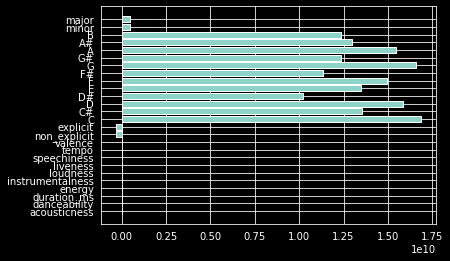

In [ ]:
plt.barh(features, scale_regression.coef_[0])

### Arbol de Decisiones

In [ ]:
scale_DT_Model = DecisionTreeRegressor()
scale_DT_Model.fit(scale_X_train, scale_y_train)
scale_DT_Predict = scale_DT_Model.predict(scale_X_valid)

In [ ]:
scale_DT_Model_Accuracy_Entrenamiento = scale_DT_Model.score(scale_X_train, scale_y_train)
scale_DT_Model_Accuracy_Real = scale_DT_Model.score(scale_X_valid, scale_y_valid)
scale_DT_Model_Explained_Variance = explained_variance_score(scale_y_valid,scale_DT_Predict)
scale_DT_Model_Max_Error = max_error(scale_y_valid,scale_DT_Predict)
scale_DT_Model_Mean_Absolute_Error = mean_absolute_error(scale_y_valid,scale_DT_Predict)
scale_DT_Model_Squared_Error = mean_squared_error(scale_y_valid,scale_DT_Predict)
scale_DT_Model_Median_Absolute_Error = median_absolute_error(scale_y_valid,scale_DT_Predict)

In [ ]:
print("Train Score R^2:", scale_DT_Model_Accuracy_Entrenamiento)
print("Test Score R^2: ", scale_DT_Model_Accuracy_Real)
print("Explained Variance:", scale_DT_Model_Explained_Variance)
print("Max Error:", scale_DT_Model_Max_Error)
print("Mean Absolute Error:", scale_DT_Model_Mean_Absolute_Error)
print("Mean Squared Error:", scale_DT_Model_Squared_Error)
#contiene valores negativos, por lo tanto se omite mean squared log error
#print("Mean Squared Log Error:",mean_squared_log_error(scale_y_valid,scale_DT_Predict))
print("Median Absolute Error:", scale_DT_Model_Median_Absolute_Error)

Train Score R^2: 0.9979343327341635
Test Score R^2:  0.542318823878668
Explained Variance: 0.5423227309062156
Max Error: 3.929513769948212
Mean Absolute Error: 0.37438526876446565
Mean Squared Error: 0.46135570345920685
Median Absolute Error: 0.045692020580793136


In [ ]:
importancia = pd.DataFrame(zip(lista, scale_DT_Model.feature_importances_), columns = ['Caracteristica', 'Importancia'])
importancia = importancia.sort_values(by = 'Importancia', ascending = False)
importancia

,Caracteristica,Importancia
0,acousticness,0.389949
7,speechiness,0.119203
5,loudness,0.095392
2,duration_ms,0.066502
9,valence,0.058614
1,danceability,0.047975
6,liveness,0.045055
3,energy,0.042733
4,instrumentalness,0.042063
8,tempo,0.039425


<BarContainer object of 26 artists>

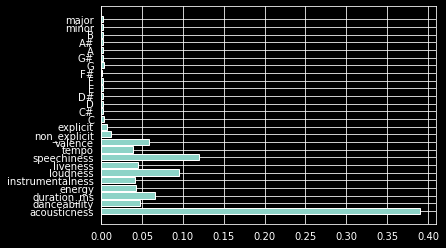

In [ ]:
plt.barh(features, scale_DT_Model.feature_importances_)

In [ ]:
# Utilizando AdaBoost para aumentar la precisión
scale_ada = AdaBoostRegressor(base_estimator=scale_DT_Model, n_estimators=50, 
                         learning_rate=1)
# Ajustando los datos
scale_ada = scale_ada.fit(scale_X_train, scale_y_train)
scale_ada_Predict = scale_ada.predict(scale_X_valid)

In [ ]:
scale_ada_Accuracy_Entrenamiento = scale_ada.score(scale_X_train, scale_y_train)
scale_ada_Accuracy_Real = scale_ada.score(scale_X_valid, scale_y_valid)
scale_ada_Explained_Variance = explained_variance_score(scale_y_valid,scale_ada_Predict)
scale_ada_Max_Error = max_error(scale_y_valid,scale_ada_Predict)
scale_ada_Mean_Absolute_Error = mean_absolute_error(scale_y_valid,scale_ada_Predict)
scale_ada_Squared_Error = mean_squared_error(scale_y_valid,scale_ada_Predict)
scale_ada_Median_Absolute_Error = median_absolute_error(scale_y_valid,scale_ada_Predict)

In [ ]:
print("Train Score R^2:", scale_ada_Accuracy_Entrenamiento)
print("Test Score R^2: ", scale_ada_Accuracy_Real)
print("Explained Variance:", scale_ada_Explained_Variance)
print("Max Error:", scale_ada_Max_Error)
print("Mean Absolute Error:", scale_ada_Mean_Absolute_Error)
print("Mean Squared Error:", scale_ada_Squared_Error)
#contiene valores negativos, por lo tanto se omite mean squared log error
#print("Mean Squared Log Error:",mean_squared_log_error(y_valid,scale_ada_Predict))
print("Median Absolute Error:", scale_ada_Median_Absolute_Error)

Train Score R^2: 0.995162268309042
Test Score R^2:  0.7580783792860971
Explained Variance: 0.7584135847652823
Max Error: 3.7924377082058323
Mean Absolute Error: 0.27829887913620244
Mean Squared Error: 0.243863906425694
Median Absolute Error: 0.09138404116158627


In [ ]:
importancia = pd.DataFrame(zip(lista, scale_ada.feature_importances_), columns = ['Caracteristica', 'Importancia'])
importancia = importancia.sort_values(by = 'Importancia', ascending = False)
importancia

,Caracteristica,Importancia
3,energy,0.256412
0,acousticness,0.192076
5,loudness,0.083635
7,speechiness,0.075174
2,duration_ms,0.062757
1,danceability,0.059549
9,valence,0.059193
6,liveness,0.048386
8,tempo,0.047935
4,instrumentalness,0.047651


<BarContainer object of 26 artists>

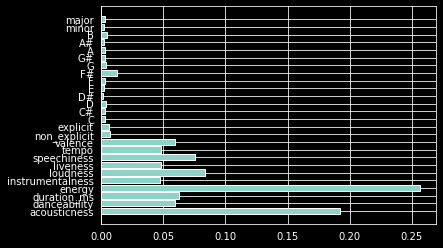

In [ ]:
plt.barh(features, scale_ada.feature_importances_)

### Random Forest

In [ ]:
scale_RFC_Model = RandomForestRegressor()
scale_RFC_Model.fit(scale_X_train, scale_y_train)
scale_RFC_Predict = scale_RFC_Model.predict(scale_X_valid)

In [ ]:
scale_RFC_Model_Accuracy_Entrenamiento =scale_RFC_Model.score(scale_X_train, scale_y_train)
scale_RFC_Model_Accuracy_Real = scale_RFC_Model.score(scale_X_valid, scale_y_valid)
scale_RFC_Model_Explained_Variance = explained_variance_score(scale_y_valid,scale_RFC_Predict)
scale_RFC_Model_Max_Error = max_error(scale_y_valid,scale_RFC_Predict)
scale_RFC_Model_Mean_Absolute_Error = mean_absolute_error(scale_y_valid,scale_RFC_Predict)
scale_RFC_Model_Squared_Error = mean_squared_error(scale_y_valid,scale_RFC_Predict)
scale_RFC_Model_Median_Absolute_Error = median_absolute_error(scale_y_valid,scale_RFC_Predict)

In [ ]:
print("Train Score R^2:", scale_RFC_Model_Accuracy_Entrenamiento)
print("Test Score R^2: ", scale_RFC_Model_Accuracy_Real)
print("Explained Variance:", scale_RFC_Model_Explained_Variance)
print("Max Error:", scale_RFC_Model_Max_Error)
print("Mean Absolute Error:", scale_RFC_Model_Mean_Absolute_Error)
print("Mean Squared Error:", scale_RFC_Model_Squared_Error)
#contiene valores negativos, por lo tanto se omite mean squared log error
#print("Mean Squared Log Error:",mean_squared_log_error(scale_y_valid,scale_RFC_Predict))
print("Median Absolute Error:", scale_RFC_Model_Median_Absolute_Error)

Train Score R^2: 0.9632108188216948
Test Score R^2:  0.7554136428011671
Explained Variance: 0.7554136695393663
Max Error: 3.5297085898662726
Mean Absolute Error: 0.3355339145085468
Mean Squared Error: 0.24655003694553967
Median Absolute Error: 0.2101832946716473


In [ ]:
importancia = pd.DataFrame(zip(lista, scale_RFC_Model.feature_importances_), columns = ['Caracteristica', 'Importancia'])
importancia = importancia.sort_values(by = 'Importancia', ascending = False)
importancia

,Caracteristica,Importancia
0,acousticness,0.389338
7,speechiness,0.119521
5,loudness,0.095174
2,duration_ms,0.064352
9,valence,0.057691
1,danceability,0.050129
3,energy,0.044207
6,liveness,0.044202
4,instrumentalness,0.041500
8,tempo,0.039296


<BarContainer object of 26 artists>

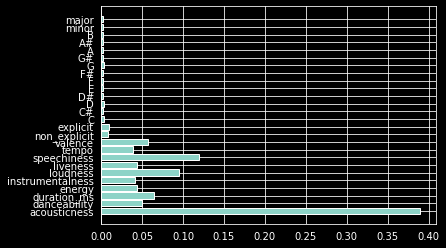

In [ ]:
plt.barh(features, scale_RFC_Model.feature_importances_)

### KNN

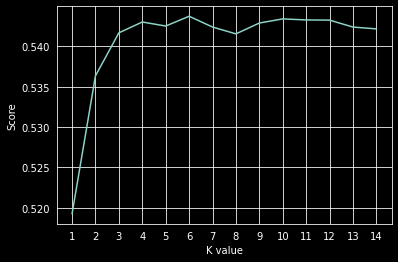

Maximum KNN Score is:  0.5437441195539078  with  6  neighbors


In [ ]:
scale_knn_scoreList = []
scale_best_vecino = 0
scale_alto = 0
scale_actual = 0
for i in range(1,15):
  scale_vecinos = KNeighborsRegressor(n_neighbors = i)
  scale_vecinos.fit(scale_X_train, scale_y_train)
  scale_vecinos_predict = scale_vecinos.predict(scale_X_valid)
  scale_actual = scale_vecinos.score(scale_X_valid, scale_y_valid)
  scale_knn_scoreList.append(scale_actual)
  if(scale_alto < scale_actual):
    scale_best_vecino = i
    scale_alto = scale_actual

plt.plot(range(1,15),scale_knn_scoreList)
plt.xticks(np.arange(1,15,1))
plt.xlabel("K value")
plt.ylabel("Score")
plt.show()

scale_best_knn = max(scale_knn_scoreList)
print("Maximum KNN Score is: ", scale_best_knn, " with ", scale_best_vecino, " neighbors")

In [ ]:
scale_KNN_Model = KNeighborsRegressor(n_neighbors=scale_best_vecino)
scale_KNN_Model.fit(scale_X_train, scale_y_train)
scale_KNN_Predict = scale_KNN_Model.predict(scale_X_valid)

In [ ]:
scale_KNN_Model_Accuracy_Entrenamiento = scale_KNN_Model.score(scale_X_train, scale_y_train)
scale_KNN_Model_Accuracy_Real = scale_KNN_Model.score(scale_X_valid, scale_y_valid)
scale_KNN_Model_Explained_Variance = explained_variance_score(scale_y_valid,scale_KNN_Predict)
scale_KNN_Model_Max_Error = max_error(scale_y_valid,scale_KNN_Predict)
scale_KNN_Model_Mean_Absolute_Error = mean_absolute_error(scale_y_valid,scale_KNN_Predict)
scale_KNN_Model_Squared_Error = mean_squared_error(scale_y_valid,scale_KNN_Predict)
scale_KNN_Model_Median_Absolute_Error = median_absolute_error(scale_y_valid,scale_KNN_Predict)

In [ ]:
print("Train Score R^2:", scale_KNN_Model_Accuracy_Entrenamiento)
print("Test Score R^2: ", scale_KNN_Model_Accuracy_Real)
print("Explained Variance:", scale_KNN_Model_Explained_Variance)
print("Max Error:", scale_KNN_Model_Max_Error)
print("Mean Absolute Error:", scale_KNN_Model_Mean_Absolute_Error)
print("Mean Squared Error:", scale_KNN_Model_Squared_Error)
#contiene valores negativos, por lo tanto se omite mean squared log error
#print("Mean Squared Log Error:",mean_squared_log_error(scale_y_valid,scale_KNN_Predict))
print("Median Absolute Error:", scale_KNN_Model_Median_Absolute_Error)

Train Score R^2: 0.6763745207140874
Test Score R^2:  0.5437441195539078
Explained Variance: 0.5440623337490809
Max Error: 3.746745687625039
Mean Absolute Error: 0.5122021596203852
Mean Squared Error: 0.4599189646917088
Median Absolute Error: 0.41122818522713844


### SVR - SVM

#### SVR: kernel poly

In [ ]:
scale_svr_poly = SVR(kernel = 'poly')
scale_svr_poly.fit(scale_X_train, scale_y_train)
scale_svr_poly_Predict = scale_svr_poly.predict(scale_X_valid)

In [ ]:
scale_svr_poly_Accuracy_Entrenamiento = scale_svr_poly.score(scale_X_train, scale_y_train)
scale_svr_poly_Accuracy_Real = scale_svr_poly.score(scale_X_valid, scale_y_valid)
scale_svr_poly_Explained_Variance = explained_variance_score(scale_y_valid,scale_svr_poly_Predict)
scale_svr_poly_Max_Error = max_error(scale_y_valid,scale_svr_poly_Predict)
scale_svr_poly_Mean_Absolute_Error = mean_absolute_error(scale_y_valid,scale_svr_poly_Predict)
scale_svr_poly_Squared_Error = mean_squared_error(scale_y_valid,scale_svr_poly_Predict)
scale_svr_poly_Median_Absolute_Error = median_absolute_error(scale_y_valid,scale_svr_poly_Predict)

In [ ]:
print("Train Score R^2:", scale_svr_poly_Accuracy_Entrenamiento)
print("Test Score R^2: ", scale_svr_poly_Accuracy_Real)
print("Explained Variance:", scale_svr_poly_Explained_Variance)
print("Max Error:", scale_svr_poly_Max_Error)
print("Mean Absolute Error:", scale_svr_poly_Mean_Absolute_Error)
print("Mean Squared Error:", scale_svr_poly_Squared_Error)
#contiene valores negativos, por lo tanto se omite mean squared log error
#print("Mean Squared Log Error:",mean_squared_log_error(scale_y_valid,scale_svr_poly_Predict))
print("Median Absolute Error:", scale_svr_poly_Median_Absolute_Error)

Train Score R^2: 0.5334414509176586
Test Score R^2:  0.531854607247082
Explained Variance: 0.537243015695529
Max Error: 3.7831948673829943
Mean Absolute Error: 0.5223834356033056
Mean Squared Error: 0.47190393283173193
Median Absolute Error: 0.4137860248841825


#### SVR: kernel sigmoid

In [ ]:
scale_svr_sigmoid = SVR(kernel = 'sigmoid')
scale_svr_sigmoid.fit(scale_X_train, scale_y_train)
scale_svr_sigmoid_Predict = scale_svr_sigmoid.predict(scale_X_valid)

In [ ]:
scale_svr_sigmoid_Accuracy_Entrenamiento = scale_svr_sigmoid.score(scale_X_train, scale_y_train)
scale_svr_sigmoid_Accuracy_Real = scale_svr_sigmoid.score(scale_X_valid, scale_y_valid)
scale_svr_sigmoid_Explained_Variance = explained_variance_score(scale_y_valid,scale_svr_sigmoid_Predict)
scale_svr_sigmoid_Max_Error = max_error(scale_y_valid,scale_svr_sigmoid_Predict)
scale_svr_sigmoid_Mean_Absolute_Error = mean_absolute_error(scale_y_valid,scale_svr_sigmoid_Predict)
scale_svr_sigmoid_Squared_Error = mean_squared_error(scale_y_valid,scale_svr_sigmoid_Predict)
scale_svr_sigmoid_Median_Absolute_Error = median_absolute_error(scale_y_valid,scale_svr_sigmoid_Predict)

In [ ]:
print("Train Score R^2:", scale_svr_sigmoid_Accuracy_Entrenamiento)
print("Test Score R^2: ", scale_svr_sigmoid_Accuracy_Real)
print("Explained Variance:", scale_svr_sigmoid_Explained_Variance)
print("Max Error:", scale_svr_sigmoid_Max_Error)
print("Mean Absolute Error:", scale_svr_sigmoid_Mean_Absolute_Error)
print("Mean Squared Error:", scale_svr_sigmoid_Squared_Error)
#contiene valores negativos, por lo tanto se omite mean squared log error
#print("Mean Squared Log Error:",mean_squared_log_error(scale_y_valid,svr_sigmoid_Predict))
print("Median Absolute Error:", scale_svr_sigmoid_Median_Absolute_Error)

#### SVR: kernel rbf

In [ ]:
scale_svr_rbf = SVR(kernel = 'rbf')
scale_svr_rbf.fit(scale_X_train, scale_y_train)
scale_svr_rbf_Predict = scale_svr_rbf.predict(scale_X_valid)

In [ ]:
scale_svr_rbf_Accuracy_Entrenamiento = scale_svr_rbf.score(scale_X_train, scale_y_train)
scale_svr_rbf_Accuracy_Real = scale_svr_rbf.score(scale_X_valid, scale_y_valid)
scale_svr_rbf_Explained_Variance = explained_variance_score(scale_y_valid,scale_svr_rbf_Predict)
scale_svr_rbf_Max_Error = max_error(scale_y_valid,scale_svr_rbf_Predict)
scale_svr_rbf_Mean_Absolute_Error = mean_absolute_error(scale_y_valid,scale_svr_rbf_Predict)
scale_svr_rbf_Squared_Error = mean_squared_error(scale_y_valid,scale_svr_rbf_Predict)
scale_svr_rbf_Median_Absolute_Error = median_absolute_error(scale_y_valid,scale_svr_rbf_Predict)

In [ ]:
print("Train Score R^2:", scale_svr_rbf_Accuracy_Entrenamiento)
print("Test Score R^2: ", scale_svr_rbf_Accuracy_Real)
print("Explained Variance:", scale_svr_rbf_Explained_Variance)
print("Max Error:", scale_svr_rbf_Max_Error)
print("Mean Absolute Error:", scale_svr_rbf_Mean_Absolute_Error)
print("Mean Squared Error:", scale_svr_rbf_Squared_Error)
#contiene valores negativos, por lo tanto se omite mean squared log error
#print("Mean Squared Log Error:",mean_squared_log_error(scale_y_valid,scale_svr_rbf_Predict))
print("Median Absolute Error:", scale_svr_rbf_Median_Absolute_Error)

Train Score R^2: 0.589193977076635
Test Score R^2:  0.5770910111069614
Explained Variance: 0.5806578083711211
Max Error: 3.4400374466582297
Mean Absolute Error: 0.4845298500808706
Mean Squared Error: 0.4263043451414426
Median Absolute Error: 0.3681972797960278


### Evaluación Modelos Scale

In [ ]:
scale_model_performance_accuracy = pd.DataFrame({'Model': ['Scale Linear Regression',
                                                      'Scale DecisionTreeRegressor',
                                                      'Scale ada boost', 
                                                      'Scale RandomForestRegressor', 
                                                      'Scale KNeighborsRegressor',
                                                      'Scale SVR poly',
                                                      'Scale SVR rbf'],
                                            'Accuracy Real': [scale_regression_Accuracy_Real,
                                                         scale_DT_Model_Accuracy_Real,
                                                         scale_ada_Accuracy_Real,
                                                         scale_RFC_Model_Accuracy_Real,
                                                         scale_KNN_Model_Accuracy_Real,
                                                         scale_svr_poly_Accuracy_Real,
                                                         scale_svr_rbf_Accuracy_Real],
                                           'Accuracy Entrenamiento': [scale_regression_Accuracy_Entrenamiento,
                                                         scale_DT_Model_Accuracy_Entrenamiento,
                                                         scale_ada_Accuracy_Entrenamiento,
                                                         scale_RFC_Model_Accuracy_Entrenamiento,
                                                         scale_KNN_Model_Accuracy_Entrenamiento,
                                                         scale_svr_poly_Accuracy_Entrenamiento,
                                                         scale_svr_rbf_Accuracy_Entrenamiento],
                                           'Max Error': [scale_regression_Max_Error,
                                                         scale_DT_Model_Max_Error,
                                                         scale_ada_Max_Error,
                                                         scale_RFC_Model_Max_Error,
                                                         scale_KNN_Model_Max_Error,
                                                         scale_svr_poly_Max_Error,
                                                         scale_svr_rbf_Max_Error],
                                           'Mean Absolute Error': [scale_regression_Mean_Absolute_Error,
                                                         scale_DT_Model_Mean_Absolute_Error,
                                                         scale_ada_Mean_Absolute_Error,
                                                         scale_RFC_Model_Mean_Absolute_Error,
                                                         scale_KNN_Model_Mean_Absolute_Error,
                                                         scale_svr_poly_Mean_Absolute_Error,
                                                         scale_svr_rbf_Mean_Absolute_Error],
                                           'Squared Error': [scale_regression_Squared_Error,
                                                         scale_DT_Model_Squared_Error,
                                                         scale_ada_Squared_Error,
                                                         scale_RFC_Model_Squared_Error,
                                                         scale_KNN_Model_Squared_Error,
                                                         scale_svr_poly_Squared_Error,
                                                         scale_svr_rbf_Squared_Error],
                                           'Median Absolute Error': [scale_regression_Median_Absolute_Error,
                                                         scale_DT_Model_Median_Absolute_Error,
                                                         scale_ada_Median_Absolute_Error,
                                                         scale_RFC_Model_Median_Absolute_Error,
                                                         scale_KNN_Model_Median_Absolute_Error,
                                                         scale_svr_poly_Median_Absolute_Error,
                                                         scale_svr_rbf_Median_Absolute_Error]})

In [ ]:
scale_model_performance_accuracy.sort_values(by = "Accuracy Real", ascending = False)

,Model,Accuracy Real,Accuracy Entrenamiento,Max Error,Mean Absolute Error,Squared Error,Median Absolute Error
2,Scale ada boost,0.758078,0.995162,3.792438,0.278299,0.243864,0.091384
3,Scale RandomForestRegressor,0.755414,0.963211,3.529709,0.335534,0.246550,0.210183
6,Scale SVR rbf,0.577091,0.589194,3.440037,0.484530,0.426304,0.368197
4,Scale KNeighborsRegressor,0.543744,0.676375,3.746746,0.512202,0.459919,0.411228
1,Scale DecisionTreeRegressor,0.542319,0.997934,3.929514,0.374385,0.461356,0.045692
5,Scale SVR poly,0.531855,0.533441,3.783195,0.522383,0.471904,0.413786
0,Scale Linear Regression,0.465113,0.457614,3.498475,0.590122,0.539181,0.517109
